# 1. Importar librerías

In [ ]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

import string
import time
import datetime

import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

!pip install --upgrade yellowbrick
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering
from sklearn import metrics

# 2. Cargar la información

In [ ]:
#Montamos el google drive para poder usar los archivos que subimos a nuestro drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Cargamos el dataset
data_original = pd.read_csv('/content/drive/MyDrive/final_proyect_lamarque/la_marque_2021.csv')

#3. Observación inicial del dataset

### Exploración inicial de la información

In [ ]:
#Le echamos un vistazo a la información original a como la arroja el sistema
data_original.head()

,Date,Time,Time Zone,Category,Item,Qty,Price Point Name,SKU,Modifiers Applied,Gross Sales,Discounts,Net Sales,Tax,Transaction ID,Payment ID,Device Name,Notes,Details,Event Type,Location,Dining Option,Unit,Count
0,07/31/21,21:54:52,Mazatlan,Mini Postres,Mini Triple Chocolate,1.0,NaN,31.0,NaN,$40.00,$0.00,$40.00,$0.00,gsHaNtHqx9Td8zk3oci5L5reV,jblqdiUBj8VF495bHDXMa69ivaB,iPad de Daniel (2),NaN,https://squareup.com/dashboard/sales/transacti...,Payment,LAMARQUE Guadalupe,Para comer aquí,ea,1
1,07/31/21,21:54:52,Mazatlan,Mini Postres,Mini Better Than Sex,1.0,NaN,4.0,NaN,$40.00,$0.00,$40.00,$0.00,gsHaNtHqx9Td8zk3oci5L5reV,jblqdiUBj8VF495bHDXMa69ivaB,iPad de Daniel (2),NaN,https://squareup.com/dashboard/sales/transacti...,Payment,LAMARQUE Guadalupe,Para comer aquí,ea,1
2,07/31/21,21:54:52,Mazatlan,Copitas,Copita Glorias,1.0,NaN,127.0,NaN,$85.00,$0.00,$85.00,$0.00,gsHaNtHqx9Td8zk3oci5L5reV,jblqdiUBj8VF495bHDXMa69ivaB,iPad de Daniel (2),NaN,https://squareup.com/dashboard/sales/transacti...,Payment,LAMARQUE Guadalupe,Para comer aquí,ea,1
3,07/31/21,21:42:13,Mazatlan,Rebanada,R. Desnudo de Chocolate,1.0,NaN,NaN,NaN,$85.00,$0.00,$85.00,$0.00,KnQVfQokevimU7h1OCvnEaheV,FOiee3ml913MtIK4q3aAKAoavaB,iPad de Daniel,NaN,https://squareup.com/dashboard/sales/transacti...,Payment,LAMARQUE Guadalupe,Para comer aquí,ea,1
4,07/31/21,21:42:13,Mazatlan,Rebanada,R. Suspiro de Fresa,1.0,NaN,53.0,NaN,$85.00,$0.00,$85.00,$0.00,KnQVfQokevimU7h1OCvnEaheV,FOiee3ml913MtIK4q3aAKAoavaB,iPad de Daniel,NaN,https://squareup.com/dashboard/sales/transacti...,Payment,LAMARQUE Guadalupe,Para comer aquí,ea,1


In [ ]:
#Revisamos la forma del dataset original
data_original.shape

(115357, 23)

In [ ]:
#Revisamos los datos, los tipos de columnas
data_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115357 entries, 0 to 115356
Data columns (total 23 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Date               115357 non-null  object 
 1   Time               115357 non-null  object 
 2   Time Zone          115357 non-null  object 
 3   Category           115357 non-null  object 
 4   Item               115357 non-null  object 
 5   Qty                115357 non-null  float64
 6   Price Point Name   25493 non-null   object 
 7   SKU                73000 non-null   float64
 8   Modifiers Applied  0 non-null       float64
 9   Gross Sales        115357 non-null  object 
 10  Discounts          115357 non-null  object 
 11  Net Sales          115357 non-null  object 
 12  Tax                115357 non-null  object 
 13  Transaction ID     115357 non-null  object 
 14  Payment ID         115357 non-null  object 
 15  Device Name        110835 non-null  object 
 16  No

### Revisión de datos nulos

In [ ]:
#Creamos la función:
def revision_datos_nulos (dataset):
  revision_datos_nulos = pd.DataFrame(dataset.isnull().sum(), columns = ['Número_datos_nulos'])
  revision_datos_nulos['Porcentaje_datos_nulos'] = round ((revision_datos_nulos['Número_datos_nulos'] / dataset.shape[0]) * 100 , 2)
  return revision_datos_nulos

In [ ]:
#Corremos la función 
revision_datos_nulos (data_original)

,Número_datos_nulos,Porcentaje_datos_nulos
Date,0,0.00
Time,0,0.00
Time Zone,0,0.00
Category,0,0.00
Item,0,0.00
Qty,0,0.00
Price Point Name,89864,77.90
SKU,42357,36.72
Modifiers Applied,115357,100.00
Gross Sales,0,0.00


### Revisión de nombre de las columnas del dataset

In [ ]:
#Creamos la función:
def limpieza_nombres_columnas (dataset):
  #Vemos el nombre original de las columnas
  print(dataset.columns)
  #Quitamos los espacios en blanco que hay al principio o al final del nombre de la columna
  dataset.columns = dataset.columns.str.strip()
  #Quitamos los signos de puntuación más comunes
  for i in string.punctuation:
    dataset.columns = dataset.columns.str.replace(i, '')
  #Si alguna variable tiene un espacio en medio entre dos palabras, lo cambiamos por un '_'
  dataset.columns = dataset.columns.str.replace(' ', '_')
  #Cambiamos el nombre de las variables a minúsculas
  dataset.columns= dataset.columns.str.lower()
  #Vemos el nombre final de las columnas
  print(dataset.columns)
  return

In [ ]:
#Corremos la función 
limpieza_nombres_columnas(data_original)

Index(['Date', 'Time', 'Time Zone', 'Category', 'Item', 'Qty',
       'Price Point Name', 'SKU', 'Modifiers Applied', 'Gross Sales',
       'Discounts', 'Net Sales', 'Tax', 'Transaction ID', 'Payment ID',
       'Device Name', 'Notes', 'Details', 'Event Type', 'Location',
       'Dining Option', 'Unit', 'Count'],
      dtype='object')
Index(['date', 'time', 'time_zone', 'category', 'item', 'qty',
       'price_point_name', 'sku', 'modifiers_applied', 'gross_sales',
       'discounts', 'net_sales', 'tax', 'transaction_id', 'payment_id',
       'device_name', 'notes', 'details', 'event_type', 'location',
       'dining_option', 'unit', 'count'],
      dtype='object')


In [ ]:
#Cambiamos de nombre las columnas para que estén en español

nombre_columnas_español = ['fecha', 'hora', 'zona_horaria', 'categoria', 'item', 'cantidad',
       'price_point', 'sku', 'modificatorios_aplicados', 'ventas_brutas',
       'descuentos', 'ventas_netas', 'impuestos', 'id_transaccion', 'id_pago',
       'aparato_cobro', 'notas', 'detalles', 'tipo_evento', 'sucursal',
       'tipo_servicio', 'unidad', 'cuenta']

data_original.columns = nombre_columnas_español

# 4. Crear el dataset de trabajo

### Creamos una copia del dataset original para poder iniciar a trabjar

In [ ]:
data = data_original.copy()

# 5. Revisión de columnas y valores cualitativos

### Columnas iniciales

In [ ]:
data.columns

Index(['fecha', 'hora', 'zona_horaria', 'categoria', 'item', 'cantidad',
       'price_point', 'sku', 'modificatorios_aplicados', 'ventas_brutas',
       'descuentos', 'ventas_netas', 'impuestos', 'id_transaccion', 'id_pago',
       'aparato_cobro', 'notas', 'detalles', 'tipo_evento', 'sucursal',
       'tipo_servicio', 'unidad', 'cuenta'],
      dtype='object')

### Revisión de las columnas y su frecuencia de datos al interior

In [ ]:
for columna in nombre_columnas_español:
  print('C O L U M N A   A   A N A L I Z A R :', columna)
  print('')
  print(data[columna].value_counts(1).head(20))
  print('')
  print(' * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *')
  print(' * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *')
  print('')


C O L U M N A   A   A N A L I Z A R : fecha

05/10/21    0.012405
02/14/21    0.011174
06/19/21    0.008417
04/30/21    0.007984
02/13/21    0.007889
06/20/21    0.007863
06/06/21    0.007698
05/09/21    0.007594
07/20/21    0.007507
07/27/21    0.007308
07/13/21    0.007100
07/24/21    0.006692
07/17/21    0.006606
07/10/21    0.006554
06/29/21    0.006450
02/06/21    0.006146
07/31/21    0.006137
07/23/21    0.006068
07/16/21    0.006042
01/30/21    0.005990
Name: fecha, dtype: float64

 * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *
 * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

C O L U M N A   A   A N A L I Z A R : hora

19:39:23    0.000243
17:58:47    0.000234
18:34:07    0.000225
17:02:45    0.000217
18:37:30    0.000199
18:13:38    0.000199
19:14:45    0.000191
19:34:06    0.000191
18:31:56    0.000182
19:20:50    0.000182
18:55:40    0.000182
11:49:56    0.000182
17:42:02    0.0

### Observaciones y acciones a realizar de la observación de columnas

#### Observaciones:

In [ ]:
#Observaciones:

# 1. El 10 de mayo de 2021 fue el día que más registros hubo, seguido del 14 de febrero de 2021.
# 2. La información de 'hora'no será útil porque contiene demasiado detalle de la hora con minutos y segundos.
# 3. El mes en la que más transacciones se realizan fue en julio.
# 4. El día en la que más transacciones se realizan es el sábado.
# 5. La hora en la que más transacciones se realizan es a las 18 horas.
# 6. Todos los registros de la columna 'zona_horaria' son en la misma zona horaria.
# 7. Existen 21 categorías y el 80% de las transacciones se realizan en las primeras 4 categorías.
# 8. Existen 305 items y el más popular es el suspiro de fresa. En su presentación mini (10.18%) y su presentación chico (5.78%).
# 9. El 85.97% de los registros de las compras son de un solo item.
# 10. Existen cantidades negativas que se refieren a devoluciones de productos o algunos registros duplicados que se eliminaron.
# 11. Los registros de la columna 'price_point' se refieren a lo mismo: 'Normal', 'Precio normal', 'Sin variacón', 'Regular' y 'Precio normal'.
# 12. No coinciden los porcentajes de los registros de los 'sku' y los 'item'. Existen muchos datos nulos que representan 'item' sin 'sku' asignado.
# 13. La mayoría de las transacciones registradas (el 28.97%) son por $40.00 pesos de 'ventas_brutas'.
# 14. Solamente alrededor del 5% de las transacciones se realizaron con algún descuento.
# 15. La mayoría de las transacciones registradas (el 26.40%) son por 40 pesos de 'ventas_netas', por lo que algunas transacciones de $40.00 pesos tuvieron descuento.
# 16. Todas las transacciones están registradas con 'impuesto' de $0.00.
# 17. La columna 'id_transaccion' es el registro de todas las transacciones realizadas por un mismo cliente.
# 18. La columna 'notas' tiene muy pocos registros con datos y no son significativos para el análisis.
# 19. La columna 'notas' tiene direcciones web para ver otras cosas que no son significativos para el análisis.
# 20. La columna 'tipo_evento' indica si es reembolso o pago y va relacionada con la cantidad. Las cantidades positivas son pago y negativas son reembolso.
# 21. La sucursal con más volumen de registros es 'LAMARQUE Guadalupe' con el 44.46%.
# 22. El 'tipo_servicio' con más volumen de registros es 'Para comer aquí'. Existen datos nulos en esta columna.
# 23. La columna 'unidad' tiene el mismo valor para todos los datos 'ea' y no dice nada.
# 24. La columna 'cuenta' es identica a los datos de la columna 'cantidad'.



#### Acciones sugeridas:

In [ ]:
# Acciones sugeridas:
# 1. Crear la columna 'fecha_hora' que contenga los datos de las columnas fecha y hora y eliminar las columnas de 'fecha' y 'hora'.
# 2. Crear las columnas 'mes', 'dia' y 'hora' de la columna creada en la acción sugerida #1.
# 3. Cambiar el nombre de los meses del año y los días de la semana a español.
# 4. Eliminar la columna 'zona_horaria'.
# 5. Agrupar las categorías < 1.00 % en 'otros'. Renombrar las categorías sin espacios, etc.
# 6. Eliminar los registros de cantidades negativas.
# 7. Eliminar la columna 'price_point'.
# 8. Eliminar la columna 'sku'.
# 9. Eliminar la columna 'modificatorios_aplicados'.
# 10. Eliminar las puntuaciones: $' y ',' de las columnas 'ventas_netas', 'descuentos' y 'ventas_brutas'.
# 11. Eliminar la columna 'impuestos'.
# 12. Eliminar la columna 'id_pago'.
# 13. Eliminar la columna 'aparato_cobro'.
# 14. Eliminar la columna 'notas'.
# 15. Eliminar la columna 'detalles'.
# 16. Eliminar la columna 'tipo_evento'.
# 17. Revisar los datos nulos de la columna 'tipo_servicio' y ver si se pueden llenar de acuerdo a la sucursal.
# 18. Eliminar la columna 'unidad'.
# 19. Eliminar la columna 'cuenta'.
# 20. Hacer el dummy encoding de las columnas: 'categoria', 'sucursal', 'tipo_servicio, 'dia'.

In [ ]:
# Acción sugerida 1:

# Creamos la columna 'fecha_hora'.
data['fecha_hora'] = pd.to_datetime(data.fecha + ' ' + data.hora)

# Eliminamos las columnas 'fecha' y 'hora'.
data = data.drop(columns = ['fecha'])
data = data.drop(columns = ['hora'])

In [ ]:
# Acción sugerida 2:

# Creamos las columnas 'mes', 'dia' y 'hora'
data['mes'] = data.fecha_hora.dt.month_name()
data['dia'] = data.fecha_hora.dt.day_name()
data['hora'] = data.fecha_hora.dt.hour

In [ ]:
# Acción sugerida 3:

# Cambiamos los nombres de los meses del año a español.
data['mes'] = np.where(data['mes'] == 'January', 'enero',
                       np.where(data['mes'] == 'February', 'febrero',
                                np.where(data['mes'] == 'March', 'marzo',
                                         np.where(data['mes'] == 'April', 'abril',
                                                  np.where(data['mes'] == 'May', 'mayo',                                                           
                                                           np.where(data['mes'] == 'June', 'junio',
                                                                    np.where(data['mes'] == 'July', 'julio',
                                                                             np.where(data['mes'] == 'August', 'agosto',
                                                                                      np.where(data['mes'] == 'September', 'septiembre',
                                                                                               np.where(data['mes'] == 'October', 'octubre',
                                                                                                        np.where(data['mes'] == 'November', 'noviembre',
                                                                                                                          np.where(data['mes'] == 'December', 'diciembre', 'otros'))))))))))))
# Cambiamos los nombres de los días de la semana a español.
data['dia'] = np.where(data['dia'] == 'Monday', 'lunes',
                                   np.where(data['dia'] == 'Tuesday', 'martes',
                                         np.where(data['dia'] == 'Wednesday', 'miercoles',
                                                  np.where(data['dia'] == 'Thursday', 'jueves',
                                                           np.where(data['dia'] == 'Friday', 'viernes',                                                           
                                                                    np.where(data['dia'] == 'Saturday', 'sabado',
                                                                             np.where(data['dia'] == 'Sunday', 'domingo', 'otros')))))))

In [ ]:
# Acción sugerida 4:

data = data.drop(columns = ['zona_horaria'])

In [ ]:
# Acción sugerida 5:

# Cambiamos los nombres de las categorías a minúsculas, etc. 
# Agrupamos el resto de las categorías menores al 1.00% en la categoría 'otros'.

data['categoria'] = np.where(data['categoria'] == 'Mini Postres', 'mini_postres',
                                   np.where(data['categoria'] == 'Bebidas', 'bebidas',
                                         np.where(data['categoria'] == 'Pasteles', 'pasteles',
                                                  np.where(data['categoria'] == 'Rebanada', 'rebanada',
                                                           np.where(data['categoria'] == 'Extras', 'extras',                                                           
                                                                    np.where(data['categoria'] == 'Promos', 'promos',
                                                                             np.where(data['categoria'] == 'Galletas', 'galletas',
                                                                                      np.where(data['categoria'] == 'Copitas', 'copitas',
                                                                                               np.where(data['categoria'] == 'Pays', 'pays',
                                                                                                        np.where(data['categoria'] == 'Pan', 'pan', 'otros'))))))))))


In [ ]:
# Acción sugerida 6:

# Borraremos los registros con cantidad negativa y sus contrapartes con cantidad positiva

#Revisamos los registos con cantidad negativa
data_cantidad_negativa = data[data['cantidad'] < -0]

#Seleccionamos los 'id_pago' de los registros con cantidad negativa (Los registros que son sus contrapartes con cantidad positiva tienen el mismo 'id_pago')
id_pago_data_cantidad_negativa = data_cantidad_negativa['id_pago'].unique()

#Creamos el dataset con los registros que tienen el id_pago en el dataset 'id_pago_data_cantidad_negativa'
id_pago_cantidad_negativa_mas_contrapartes = data[data['id_pago'].isin(id_pago_data_cantidad_negativa)]

#Agrupamos los registros por 'id_pago'
id_pago_cantidad_negativa_mas_contrapartes_grouped = id_pago_cantidad_negativa_mas_contrapartes.groupby(['id_pago']).sum()

#Seleccionamos los registros que tienen 'cantidad' = 0, lo que significa que lo que se registró como positivo es igual que los negativos (lo que se compró se regresó)
id_pago_cantidad_negativa_mas_contrapartes_grouped_cantidad0 = id_pago_cantidad_negativa_mas_contrapartes_grouped[id_pago_cantidad_negativa_mas_contrapartes_grouped['cantidad'] == 0]

#Creamos la lista de los 'id_pago_a_eliminar' de los índices del dataset que creamos
id_pago_a_eliminar = id_pago_cantidad_negativa_mas_contrapartes_grouped_cantidad0.index

#Actualizamos el dataset para solamente tener los registros netos sin incluir lod que están en la lista 'id_pago_a_eliminar'
data = data[~data['id_pago'].isin(id_pago_a_eliminar)]

#Actualizamos el índice
data = data.reset_index()

In [ ]:
#Aún quedan 73 registros negativos debido a que hay transacciones en las que no se devolvieron la totalidad de los productos comprados
len(data[data['cantidad'] < -0])

73

In [ ]:
#Eliminaremos manualmente estos registros.
data[data['cantidad'] < 0][['id_pago', 'categoria', 'item', 'cantidad', 'ventas_netas', 'sucursal', 'fecha_hora']].head()

,id_pago,categoria,item,cantidad,ventas_netas,sucursal,fecha_hora
2756,T1MJbEAu49RHPREkoPWt7XCluaB,rebanada,Rebanada Cheesecake Nuevo,-1.0,$-85.00,LAMARQUE Guadalupe,2021-07-27 18:28:28
2818,7pUd7sNC9vfxZ0OwUoVcUpgsuaB,pasteles,Suspiro de Fresa Chico,-1.0,$-390.00,LAMARQUE Guadalupe,2021-07-27 17:56:15
3043,1ioWiy74P4av7M020uVlgR13vaB,bebidas,Iced Chai,-1.0,$-65.00,LAMARQUE Guadalupe,2021-07-27 15:35:33
3044,1ioWiy74P4av7M020uVlgR13vaB,bebidas,Leche de Almendra,-1.0,$-10.00,LAMARQUE Guadalupe,2021-07-27 15:35:33
4270,pOPrp0gX1xqFJr6XDOOMqvJnvaB,pays,Pay de Platano,-1.0,$-390.00,LAMARQUE Quintas,2021-07-25 14:40:56


In [ ]:
#Revisamos los índices de las transacciones con cantidades negativas que quedaron
indices_a_eliminar = data[data['cantidad'] < -0].index
indices_a_eliminar = list(indices_a_eliminar)
print(indices_a_eliminar)

[2756, 2818, 3043, 3044, 4270, 8656, 9035, 11380, 12112, 12899, 12904, 13200, 13753, 15474, 16085, 16448, 16449, 16450, 18861, 19489, 20870, 24069, 24177, 24178, 24863, 25969, 27467, 27468, 27469, 27470, 27677, 29858, 31944, 32676, 33615, 33687, 33688, 34532, 38742, 38743, 40144, 40321, 44888, 45443, 45462, 48045, 49830, 50033, 52089, 53070, 54757, 57506, 57903, 58708, 59928, 65818, 66247, 67202, 71158, 78576, 82512, 85714, 87569, 91866, 95576, 96303, 96671, 96672, 98550, 100879, 101948, 108942, 110181]


In [ ]:
# E N C O N T R A R   L O S  P A R E S   D E   L O S   N E G A T I V O S

filtro = data[data['id_pago'] == 'GT9IFFwaPDVhJFEU9RN6KQB'][['categoria', 'item', 'cantidad', 'ventas_netas', 'sucursal', 'fecha_hora', 'notas']]
filtro

,categoria,item,cantidad,ventas_netas,sucursal,fecha_hora,notas
110181,mini_postres,Mini Pay de Platano,-1.0,$-40.00,LAMARQUE Guadalupe,2021-01-09 19:50:55,Mercancía devuelta
110182,rebanada,R. Cheesecake Fresa,1.0,$85.00,LAMARQUE Guadalupe,2021-01-09 19:49:29,NaN
110183,mini_postres,Mini Pay de Platano,1.0,$40.00,LAMARQUE Guadalupe,2021-01-09 19:49:29,NaN


In [ ]:
#Vamos anotando los índices de las contrapartes:
# 2761, 2822, 3046, 3047, 4285, 8657, 9039, 11413, 12122, 12901, 12907, 13221, 13756, 15477, 16453, 16451, 16452, 19644, 20877, 24078, 24181, 24182, 25982, 
# 27681, 29863, 31948, 32679, 33624, 33690, 33691, 34661, 38744, 38745, 40150, 40322, 44890, 49167, 45464, 48050, 49832, 50035, 52104, 53073, 54762, 57905,
# 59934, 65820, 66255, 67261, 78580, 82514, 85836, 87615, 91871, 95579, 96304, 96674, 96675, 98551, 100882, 101960, 108948, 110183

indices_contrapartes = [2761, 2822, 3046, 3047, 4285, 8657, 9039, 11413, 12122, 12901, 12907, 13221, 13756, 15477, 16453, 16451, 16452, 19644, 20877, 24078, 24181, 24182, 25982, 27681, 29863, 31948, 32679, 33624, 33690, 33691, 34661, 38744, 38745, 40150, 40322, 44890, 49167, 45464, 48050, 49832, 50035, 52104, 53073, 54762, 57905, 59934, 65820, 66255, 67261, 78580, 82514, 85836, 87615, 91871, 95579, 96304, 96674, 96675, 98551, 100882, 101960, 108948, 110183]
print(indices_contrapartes)

[2761, 2822, 3046, 3047, 4285, 8657, 9039, 11413, 12122, 12901, 12907, 13221, 13756, 15477, 16453, 16451, 16452, 19644, 20877, 24078, 24181, 24182, 25982, 27681, 29863, 31948, 32679, 33624, 33690, 33691, 34661, 38744, 38745, 40150, 40322, 44890, 49167, 45464, 48050, 49832, 50035, 52104, 53073, 54762, 57905, 59934, 65820, 66255, 67261, 78580, 82514, 85836, 87615, 91871, 95579, 96304, 96674, 96675, 98551, 100882, 101960, 108948, 110183]


In [ ]:
#Hay registros sin contraparte por medio del 'id_pago', vamos a revisar sin esta columna a ver si se encuentra la contraparte
# 16085, 27467, 27468, 27469, 27470, 58708, 71158

# E N C O N T R A R   L O S  P A R E S   D E   L O S   N E G A T I V O S   S I N    C O N T R A P A R T E   P O R  I_D P A G O

#Revisión de los índices
data[data.index == 71158]

,index,categoria,item,cantidad,price_point,sku,modificatorios_aplicados,ventas_brutas,descuentos,ventas_netas,impuestos,id_transaccion,id_pago,aparato_cobro,notas,detalles,tipo_evento,sucursal,tipo_servicio,unidad,cuenta,fecha_hora,mes,dia,hora
71158,72002,pasteles,Pastel Peanut Brownie Chico,-1.0,Normal,NaN,NaN,$-480.00,$0.00,$-480.00,$0.00,Xgwms7fZWoWYO0t7AOO0N03eV,"7LxByaqG70Q6nJYO9KfMBtzxuaB, FKoKc6hH06WOXKTYU...",alia's iPad,Cobro accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Quintas,NaN,ea,-1,2021-03-24 18:40:06,marzo,miercoles,18


In [ ]:
#Para el registro con índice 16085 con fecha: 2021-07-07 10:49:51, no se encontró la compra el mismo día a una hora previa de la devolución. 
                                                                  #Del día anterior hay 1 solo registro de una compra similar: 16542, con fecha: 2021-07-06 13:03:54.
#Para el registro con índice 27467 con fecha: 2021-06-17 18:25:01, se selecciona como contraparte la compra más cercana a la devolución: 27476 con fecha: 2021-06-17 18:22:45
#Para el registro con índice 27468 con fecha: 2021-06-17 18:25:01, se selecciona como contraparte la compra más cercana a la devolución: 27477 con fecha: 2021-06-17 18:22:45
#Para el registro con índice 27469 con fecha: 2021-06-17 18:25:01, se selecciona como contraparte la compra más cercana a la devolución: 27478 con fecha: 2021-06-17 18:22:45
#Para el registro con índice 27470 con fecha: 2021-06-17 18:25:01, se selecciona como contraparte la compra más cercana a la devolución: 27479 con fecha: 2021-06-17 18:22:45
#Para el registro con índice 58708 con fecha: 2021-04-18 14:28:32, se selecciona como contraparte la compra más cercana a la devolución: 58713 con fecha: 2021-04-18 14:24:48
#Para el registro con índice 71158 con fecha: 2021-03-24 18:40:06, se selecciona como contraparte la compra más cercana a la devolución: 71411 con fecha: 2021-03-24 14:57:13 (única compra)

#Vamos anotando los índices de las contrapartes:
# 16542, 27476, 27477, 27478, 27479, 58713, 71411
indices_contrapartes_2 = [16542, 27476, 27477, 27478, 27479, 58713, 71411]
print(indices_contrapartes_2)

[16542, 27476, 27477, 27478, 27479, 58713, 71411]


In [ ]:
#Búsqueda de la contraparte
filtro2 = data[data['ventas_netas'] == '$480.00'][['categoria', 'item', 'cantidad', 'ventas_netas', 'sucursal', 'fecha_hora', 'mes', 'dia']]
filtro3 = filtro2[filtro2['sucursal'] == 'LAMARQUE Quintas']
filtro4 = filtro3[filtro3['item'] == 'Pastel Peanut Brownie Chico']
filtro5 = filtro4 [filtro4['mes'] == 'marzo']
filtro5 [filtro5['dia'] == 'miercoles']

,categoria,item,cantidad,ventas_netas,sucursal,fecha_hora,mes,dia
71411,pasteles,Pastel Peanut Brownie Chico,1.0,$480.00,LAMARQUE Quintas,2021-03-24 14:57:13,marzo,miercoles


In [ ]:
#Hay registros negativos cuya cantidad es menor a la cantidad original, por tal motivo no se eliminan las contrapartes, solo se les actualiza la cantidad considerando la devoluciín
#Índice: 18862 - Cambiar la cantidad de 2 a 1  
#Índice: 24875 - Cambiar la cantidad de 2 a 1
#Índice: 57660 - Cambiar la cantidad de 3 a 2

#Revisión de los índices
data[data.index == 57660]

,index,categoria,item,cantidad,price_point,sku,modificatorios_aplicados,ventas_brutas,descuentos,ventas_netas,impuestos,id_transaccion,id_pago,aparato_cobro,notas,detalles,tipo_evento,sucursal,tipo_servicio,unidad,cuenta,fecha_hora,mes,dia,hora
57660,58314,bebidas,Agua,3.0,NaN,75.0,NaN,$60.00,$0.00,$60.00,$0.00,k6bfu2d2UAJRkdHtyvALX81eV,xEQRs12nyKjC14gZ8iiv9JGDwaB,iPad de Daniel,NaN,https://squareup.com/dashboard/sales/transacti...,Payment,LAMARQUE Guadalupe,Para comer aquí,ea,3,2021-04-20 18:43:50,abril,martes,18


In [ ]:
#Cambiamos el valor de las columnas:
#Índice 18862
data.at[18862, 'cantidad'] = 1.0
data.at[18862, 'ventas_brutas'] = '$75.00'
data.at[18862, 'ventas_netas'] = '$75.00'
data.at[18862, 'cuenta'] = 1.0

#Índice 24875
data.at[24875, 'cantidad'] = 1.0
data.at[24875, 'ventas_brutas'] = '$40.00'
data.at[24875, 'ventas_netas'] = '$40.00'
data.at[24875, 'cuenta'] = 1.0

#Índice 57660
data.at[57660, 'cantidad'] = 2.0
data.at[57660, 'ventas_brutas'] = '$40.00'
data.at[57660, 'ventas_netas'] = '$40.00'
data.at[57660, 'cuenta'] = 2.0

#Revisamos la información
data[data.index == 57660]

,index,categoria,item,cantidad,price_point,sku,modificatorios_aplicados,ventas_brutas,descuentos,ventas_netas,impuestos,id_transaccion,id_pago,aparato_cobro,notas,detalles,tipo_evento,sucursal,tipo_servicio,unidad,cuenta,fecha_hora,mes,dia,hora
57660,58314,bebidas,Agua,2.0,NaN,75.0,NaN,$40.00,$0.00,$40.00,$0.00,k6bfu2d2UAJRkdHtyvALX81eV,xEQRs12nyKjC14gZ8iiv9JGDwaB,iPad de Daniel,NaN,https://squareup.com/dashboard/sales/transacti...,Payment,LAMARQUE Guadalupe,Para comer aquí,ea,2,2021-04-20 18:43:50,abril,martes,18


In [ ]:
#Actualizamos la lista de 'indices_a_eliminar' sumandole los 'indices_contrapartes'
indices_a_eliminar_con_contrapartes = indices_a_eliminar + indices_contrapartes + indices_contrapartes_2
print(indices_a_eliminar_con_contrapartes)

[2756, 2818, 3043, 3044, 4270, 8656, 9035, 11380, 12112, 12899, 12904, 13200, 13753, 15474, 16085, 16448, 16449, 16450, 18861, 19489, 20870, 24069, 24177, 24178, 24863, 25969, 27467, 27468, 27469, 27470, 27677, 29858, 31944, 32676, 33615, 33687, 33688, 34532, 38742, 38743, 40144, 40321, 44888, 45443, 45462, 48045, 49830, 50033, 52089, 53070, 54757, 57506, 57903, 58708, 59928, 65818, 66247, 67202, 71158, 78576, 82512, 85714, 87569, 91866, 95576, 96303, 96671, 96672, 98550, 100879, 101948, 108942, 110181, 2761, 2822, 3046, 3047, 4285, 8657, 9039, 11413, 12122, 12901, 12907, 13221, 13756, 15477, 16453, 16451, 16452, 19644, 20877, 24078, 24181, 24182, 25982, 27681, 29863, 31948, 32679, 33624, 33690, 33691, 34661, 38744, 38745, 40150, 40322, 44890, 49167, 45464, 48050, 49832, 50035, 52104, 53073, 54762, 57905, 59934, 65820, 66255, 67261, 78580, 82514, 85836, 87615, 91871, 95579, 96304, 96674, 96675, 98551, 100882, 101960, 108948, 110183, 16542, 27476, 27477, 27478, 27479, 58713, 71411]


In [ ]:
# Eliminamos los índices localizados
data = data.drop(indices_a_eliminar_con_contrapartes)

In [ ]:
# Acción sugerida 7:

data = data.drop(columns = ['price_point'])

In [ ]:
# Acción sugerida 8:

data = data.drop(columns = ['sku'])

In [ ]:
# Acción sugerida 9:

data = data.drop(columns = ['modificatorios_aplicados'])

In [ ]:
# Acción sugerida 10:

# Quitamos el signo de pesos
data['ventas_brutas'] = data['ventas_brutas'].str.replace('$', '')
data['descuentos'] = data['descuentos'].str.replace('$', '')
data['ventas_netas'] = data['ventas_netas'].str.replace('$', '')

# Quitamos las comas
data['ventas_brutas'] = data['ventas_brutas'].str.replace(',', '')
data['descuentos'] = data['descuentos'].str.replace(',', '')
data['ventas_netas'] = data['ventas_netas'].str.replace(',', '')

# Cambiamos las columnas ventas_brutas, descuentos y ventas_netas para que esan tipo numéricas
data['ventas_brutas'] = data['ventas_brutas'].astype('float64')
data['descuentos'] = data['descuentos'].astype('float64')
data['ventas_netas'] = data['ventas_netas'].astype('float64')

In [ ]:
# Acción sugerida 11:

data = data.drop(columns = ['impuestos'])

In [ ]:
# Acción sugerida 12:

data = data.drop(columns = ['id_pago'])

In [ ]:
# Acción sugerida 13:

data = data.drop(columns = ['aparato_cobro'])

In [ ]:
# Acción sugerida 14:

data = data.drop(columns = ['notas'])

In [ ]:
# Acción sugerida 15:

data = data.drop(columns = ['detalles'])

In [ ]:
# Acción sugerida 16:

data = data.drop(columns = ['tipo_evento'])

In [ ]:
# Acción sugerida 17:

# Revisamos los datos nulos por cada sucursal
data[data['tipo_servicio'].isnull()].sucursal.value_counts()

LAMARQUE Quintas        9604
LAMARQUE Chapultepec    9568
LAMARQUE Domicilio      2328
Name: sucursal, dtype: int64

In [ ]:
#Los datos de la sucursal 'LAMARQUE Quintas' son pedidos 'Para llevar'
data.loc[data['tipo_servicio'].isnull() & (data['sucursal'] == 'LAMARQUE Quintas'), 'tipo_servicio'] ='Para llevar'

#Los datos de la sucursal 'LAMARQUE Chapultepec'son pedidos 'Para llevar'
data.loc[data['tipo_servicio'].isnull() & (data['sucursal'] == 'LAMARQUE Chapultepec'), 'tipo_servicio'] ='Para llevar'

#Los datos de la sucursal 'LAMARQUE Domicilio' son pedidos 'Para entregar'
data.loc[data['tipo_servicio'].isnull() & (data['sucursal'] == 'LAMARQUE Domicilio'), 'tipo_servicio'] ='Para entregar'

In [ ]:
# Acción sugerida 18:

data = data.drop(columns = ['unidad'])

In [ ]:
# Acción sugerida 19:

data = data.drop(columns = ['cuenta'])

In [ ]:
# Acción sugerida 20:

# Dummy encoding de la columna 'categoria'.
data_categoria = pd.get_dummies(data.categoria)
data = pd.concat([data, data_categoria], axis = 1).copy()

# Dummy encoding de la columna 'sucursal'.
data_sucursal = pd.get_dummies(data.sucursal)
data = pd.concat([data, data_sucursal], axis = 1).copy()

# Dummy encoding de la columna 'tipo_servicio'.
data_tipo_servicio = pd.get_dummies(data.tipo_servicio)
data = pd.concat([data, data_tipo_servicio], axis = 1).copy()

# Dummy encoding de la columna 'dia'.
data_dia = pd.get_dummies(data.dia)
data = pd.concat([data, data_dia], axis = 1).copy()

# Al hacer el dummy_encoding te pone el valor de 1 en cada columna que tenía la categoría. 
# Algunos registros eran diferentes de 1, por lo que haremos el ajuste para las columnas que se crearon en el dummy encoding.

# Corrección para los datos de las columnas de "categoría"
data['bebidas'] = np.where(data['bebidas'] == 0, 0, data['cantidad'])
data['copitas'] = np.where(data['copitas'] == 0, 0, data['cantidad'])
data['extras'] = np.where(data['extras'] == 0, 0, data['cantidad'])
data['galletas'] = np.where(data['galletas'] == 0, 0, data['cantidad'])
data['mini_postres'] = np.where(data['mini_postres'] == 0, 0, data['cantidad'])
data['otros'] = np.where(data['otros'] == 0, 0, data['cantidad'])
data['pan'] = np.where(data['pan'] == 0, 0, data['cantidad'])
data['pasteles'] = np.where(data['pasteles'] == 0, 0, data['cantidad'])
data['pays'] = np.where(data['pays'] == 0, 0, data['cantidad'])
data['promos'] = np.where(data['promos'] == 0, 0, data['cantidad'])
data['rebanada'] = np.where(data['rebanada'] == 0, 0, data['cantidad'])

#Corrección para los datos de las columnas de "sucursal"
data['LAMARQUE Chapultepec'] = np.where(data['LAMARQUE Chapultepec'] == 0, 0, data['cantidad'])
data['LAMARQUE Conquista'] = np.where(data['LAMARQUE Conquista'] == 0, 0, data['cantidad'])
data['LAMARQUE Domicilio'] = np.where(data['LAMARQUE Domicilio'] == 0, 0, data['cantidad'])
data['LAMARQUE Drive Thru Guadalupe'] = np.where(data['LAMARQUE Drive Thru Guadalupe'] == 0, 0, data['cantidad'])
data['LAMARQUE Guadalupe'] = np.where(data['LAMARQUE Guadalupe'] == 0, 0, data['cantidad'])
data['LAMARQUE Privanzas'] = np.where(data['LAMARQUE Privanzas'] == 0, 0, data['cantidad'])
data['LAMARQUE Quintas'] = np.where(data['LAMARQUE Quintas'] == 0, 0, data['cantidad'])
data['LAMARQUE Tres Rios'] = np.where(data['LAMARQUE Tres Rios'] == 0, 0, data['cantidad'])

#Corrección para los datos de las columnas de "tipo_de_servicio"
data['Para comer aquí'] = np.where(data['Para comer aquí'] == 0, 0, data['cantidad'])
data['Para entregar'] = np.where(data['Para entregar'] == 0, 0, data['cantidad'])
data['Para llevar'] = np.where(data['Para llevar'] == 0, 0, data['cantidad'])
data['Para recoger'] = np.where(data['Para recoger'] == 0, 0, data['cantidad'])

#Corrección para los datos de las columnas de "dia"
data['lunes'] = np.where(data['lunes'] == 0, 0, data['cantidad'])
data['martes'] = np.where(data['martes'] == 0, 0, data['cantidad'])
data['miercoles'] = np.where(data['miercoles'] == 0, 0, data['cantidad'])
data['jueves'] = np.where(data['jueves'] == 0, 0, data['cantidad'])
data['viernes'] = np.where(data['viernes'] == 0, 0, data['cantidad'])
data['sabado'] = np.where(data['sabado'] == 0, 0, data['cantidad'])
data['domingo'] = np.where(data['domingo'] == 0, 0, data['cantidad'])

### Columnas finales

In [ ]:
#Eliminamos la columna que se creo del índice previo a los cambios
data = data.drop(columns = ['index'])

# Nombres de las columnas actuales.
data.columns

Index(['categoria', 'item', 'cantidad', 'ventas_brutas', 'descuentos',
       'ventas_netas', 'id_transaccion', 'sucursal', 'tipo_servicio',
       'fecha_hora', 'mes', 'dia', 'hora', 'bebidas', 'copitas', 'extras',
       'galletas', 'mini_postres', 'otros', 'pan', 'pasteles', 'pays',
       'promos', 'rebanada', 'LAMARQUE Chapultepec', 'LAMARQUE Conquista',
       'LAMARQUE Domicilio', 'LAMARQUE Drive Thru Guadalupe',
       'LAMARQUE Guadalupe', 'LAMARQUE Privanzas', 'LAMARQUE Quintas',
       'LAMARQUE Tres Rios', 'Para comer aquí', 'Para entregar', 'Para llevar',
       'Para recoger', 'domingo', 'jueves', 'lunes', 'martes', 'miercoles',
       'sabado', 'viernes'],
      dtype='object')

In [ ]:
# Nombres de las columnas nuevos.
data.columns = ['categoria', 'item', 'cantidad', 'ventas_brutas', 'descuentos',
                'ventas_netas', 'id_transaccion', 'sucursal', 'tipo_servicio',         
                'fecha_hora', 'mes', 'dia', 'hora', 'bebidas', 'copitas', 'extras', 'galletas',           
                'mini_postres', 'otros', 'pan', 'pasteles', 'pays', 'promos', 'rebanada',
                'sucursal_chapultepec', 'sucursal_conquista', 'sucursal_domicilio',
                'sucursal_drive_thru_guadalupe', 'sucursal_guadalupe',
                'sucursal_privanzas', 'sucursal_quintas', 'sucursal_tres_rios',
                'para_comer_aqui', 'para_entregar', 'para_llevar', 'para_recoger',
                'domingo', 'jueves', 'lunes', 'martes', 'miercoles', 'sabado', 'viernes']

In [ ]:
# Ordenamos las columnas para visualizar mejor la información.
data = data[['id_transaccion', 'fecha_hora', 'mes', 'dia', 'hora', 'categoria', 'item',
       'sucursal', 'tipo_servicio', 'cantidad', 'ventas_brutas', 'descuentos',
       'ventas_netas', 'bebidas', 'copitas', 'extras', 'galletas',
       'mini_postres', 'pan', 'pasteles', 'pays', 'promos', 'rebanada',
       'otros', 'sucursal_chapultepec', 'sucursal_conquista',
       'sucursal_domicilio', 'sucursal_drive_thru_guadalupe',
       'sucursal_guadalupe', 'sucursal_privanzas', 'sucursal_quintas',
       'sucursal_tres_rios', 'para_comer_aqui', 'para_entregar', 'para_llevar',
       'para_recoger', 'lunes', 'martes', 'miercoles', 'jueves', 'viernes', 'sabado', 'domingo']]

#Reiniciamos el índice
data.reset_index(drop = True, inplace = True)

data.head()

,id_transaccion,fecha_hora,mes,dia,hora,categoria,item,sucursal,tipo_servicio,cantidad,ventas_brutas,descuentos,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo
0,gsHaNtHqx9Td8zk3oci5L5reV,2021-07-31 21:54:52,julio,sabado,21,mini_postres,Mini Triple Chocolate,LAMARQUE Guadalupe,Para comer aquí,1.0,40.0,0.0,40.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,gsHaNtHqx9Td8zk3oci5L5reV,2021-07-31 21:54:52,julio,sabado,21,mini_postres,Mini Better Than Sex,LAMARQUE Guadalupe,Para comer aquí,1.0,40.0,0.0,40.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,gsHaNtHqx9Td8zk3oci5L5reV,2021-07-31 21:54:52,julio,sabado,21,copitas,Copita Glorias,LAMARQUE Guadalupe,Para comer aquí,1.0,85.0,0.0,85.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,KnQVfQokevimU7h1OCvnEaheV,2021-07-31 21:42:13,julio,sabado,21,rebanada,R. Desnudo de Chocolate,LAMARQUE Guadalupe,Para comer aquí,1.0,85.0,0.0,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,KnQVfQokevimU7h1OCvnEaheV,2021-07-31 21:42:13,julio,sabado,21,rebanada,R. Suspiro de Fresa,LAMARQUE Guadalupe,Para comer aquí,1.0,85.0,0.0,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


# 6. Creación de datasets mensuales y de devoluciones

In [ ]:
#Creamos los dataset de cada mes

data_enero = data[data['mes'] == 'enero']
data_febrero = data[data['mes'] == 'febrero']
data_marzo = data[data['mes'] == 'marzo']
data_abril = data[data['mes'] == 'abril']
data_mayo = data[data['mes'] == 'mayo']
data_junio = data[data['mes'] == 'junio']
data_julio = data[data['mes'] == 'julio']

In [ ]:
#Creamos el dataset de las devoluciones
data_devoluciones = data_original[data_original['cantidad'] < 0]

# 7. Creación de datasets por transacción 
##(suma de items comprados por el cliente en una sola transacción)

### Anual 2021

In [ ]:
#Por medio de un groupby agrupamos las transacciones por cada id_transaccion
data_2021 = data.groupby(['id_transaccion', 'fecha_hora', 'mes', 'dia', 'hora']).sum()

#Reiniciamos el índice del dataset para tener las columnas 'id_transaccion' y 'fecha_hora' en el dataset
data_2021.reset_index(level = ['id_transaccion', 'fecha_hora', 'mes', 'dia', 'hora'], inplace = True)

#Ordenamos los datos por fecha_hora
data_2021 = data_2021.sort_values (by = ['fecha_hora'], ignore_index = True)

data_2021.head()

,id_transaccion,fecha_hora,mes,dia,hora,cantidad,ventas_brutas,descuentos,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo
0,03QKt0jzPLEwy2rWIRdCuc0eV,2021-01-02 08:39:04,enero,sabado,8,1.0,40.0,0.0,40.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,IZQoJ5UHM8WtvQDoiVVwrwAfV,2021-01-02 08:44:56,enero,sabado,8,2.0,130.0,0.0,130.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
2,ArjmMG7VBSpiNLbiOC7zo81eV,2021-01-02 08:54:49,enero,sabado,8,4.0,160.0,0.0,160.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0
3,AVkUaj7IHnbu5tmX4yKO7p7eV,2021-01-02 09:16:38,enero,sabado,9,2.0,610.0,0.0,610.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
4,Id6AnTSRYvEu4YrezGkRYBieV,2021-01-02 09:23:49,enero,sabado,9,1.0,45.0,0.0,45.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


### Enero 2021

In [ ]:
data_ene_2021 = data_2021[data_2021['mes'] == 'enero']

### Febrero 2021

In [ ]:
data_feb_2021 = data_2021[data_2021['mes'] == 'febrero']

### Marzo 2021

In [ ]:
data_mar_2021 = data_2021[data_2021['mes'] == 'marzo']

### Abril 2021

In [ ]:
data_abr_2021 = data_2021[data_2021['mes'] == 'abril']

### Mayo 2021

In [ ]:
data_may_2021 = data_2021[data_2021['mes'] == 'mayo']

### Junio 2021

In [ ]:
data_jun_2021 = data_2021[data_2021['mes'] == 'junio']

### Julio 2021

In [ ]:
data_jul_2021 = data_2021[data_2021['mes'] == 'julio']

# 8. Análisis estadístico y gráfico

## 8.1 Análisis inicial

### 8.1.1 Estadísticas generales

In [ ]:
data_2021.describe().round(0)

,hora,cantidad,ventas_brutas,descuentos,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo
count,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0,62473.0
mean,16.0,2.0,218.0,-2.0,216.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,3.0,2.0,183.0,13.0,182.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
min,7.0,1.0,0.0,-771.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,13.0,1.0,85.0,0.0,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,16.0,2.0,165.0,0.0,165.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,18.0,3.0,330.0,0.0,330.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,22.0,100.0,20000.0,0.0,20000.0,27.0,23.0,7.0,18.0,100.0,5.0,15.0,3.0,6.0,16.0,11.0,56.0,45.0,100.0,36.0,36.0,22.0,25.0,36.0,36.0,100.0,56.0,8.0,35.0,61.0,56.0,100.0,43.0,45.0,31.0


### 8.1.2 Tratamiento de outliers

#### Selección de columnas para revisión de outliers

In [ ]:
#Seleccionamos las columnas a revisar si tienen datos que se consideren outliers.

#Para este caso solo revisaremos 'cantidad' y 'ventas_netas', porque las demás columnas están relacionadas con estas dos.
columnas_revision_outlier = ['cantidad', 'ventas_netas']

#### Creamos la función para graficar boxplot

In [ ]:
#Creamos la función para la gráfica de caja
def boxplot (dataset, columna):
  boxplot = dataset.boxplot(column = columna, figsize = (15,10), fontsize = 16)
  return boxplot

#### Aplicamos la función para graficar boxplot en las columnas para revisión de outliers

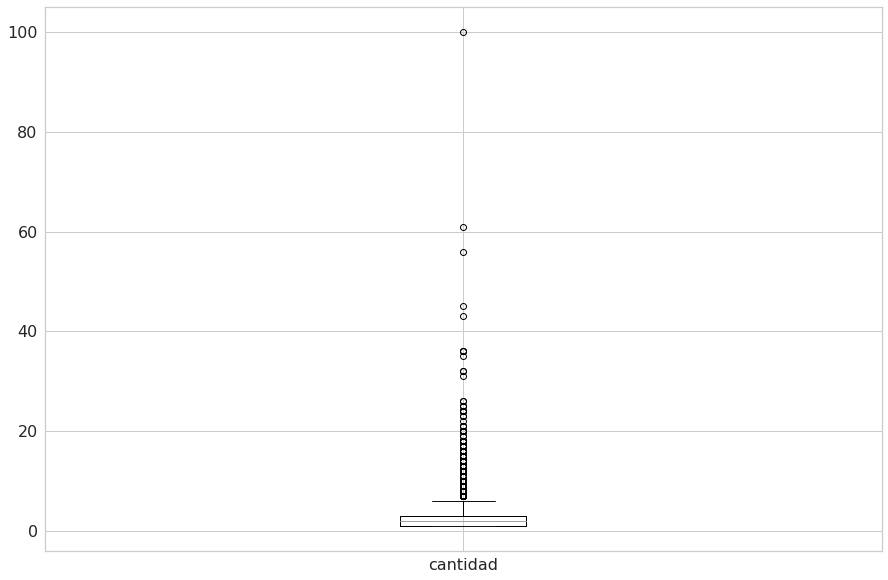

In [ ]:
#Aplicamos la función en la columna 'cantidad'
boxplot (data_2021, 'cantidad')

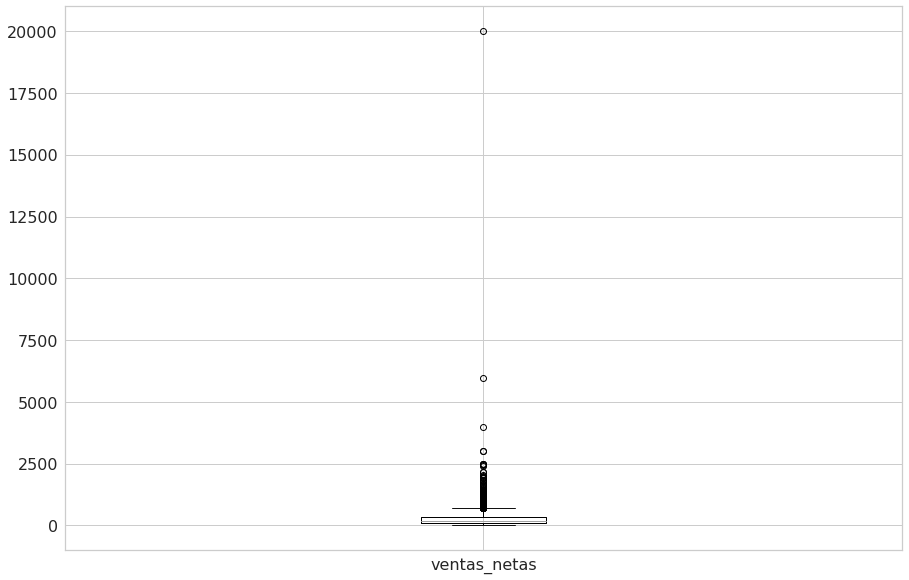

In [ ]:
#Aplicamos la función en la columna 'ventas_netas'
boxplot (data_2021, 'ventas_netas')

In [ ]:
#Observamos que hay algunas valores muy atípicos

#### Creamos la función para eliminar los registros considerados como outliers

In [ ]:
#Creamos la función para remover los valores que son outliers con un parámetro de 5 rangos intercuantiles para el límite superior e inferior.

def tratamiento_outliers (dataset, columna):
  #Calculamos el rango intercuantil.
  iqr = np.percentile(dataset[columna], 75) - np.percentile(dataset[columna], 25)
  
  #Calculamos el límite mínimo y máximo de donde se considerará un registro como outlier.
  upper = np.percentile(dataset[columna], 75) + 5 * iqr
  lower = np.percentile(dataset[columna], 25) - 5 * iqr
  
  #Filtramos los registros que están por arriba del límite mínimo y por abajo del límite máximo (los no outliers)
  dataset = dataset[(dataset[columna] <= upper) & (dataset[columna] >= lower)]  
  
  #Reinciamos el índice del dataset
  dataset.reset_index(drop = True, inplace = True)

  return dataset

#### Aplicamos la función para eliminar los registros considerados como outliers

In [ ]:
#Para la columna: 'cantidad'
data_2021 = tratamiento_outliers (data_2021, 'cantidad')

#Para la columna: 'ventas_netas'
data_2021 = tratamiento_outliers (data_2021, 'ventas_netas')

### 8.1.3 Revisión de correlación entre variables

#### Creamos la función para generar la matriz de correlación

In [ ]:
def matriz_correlacion (dataset):
  dataset_corr = dataset.corr()
  
  mask = np.zeros_like(dataset_corr.corr(),dtype = np.bool)
  mask[np.triu_indices_from(mask)] = True
  plt.subplots(figsize = (60,40))
  cmap = sns.diverging_palette(6, 255, as_cmap = True)
  heatmap = sns.heatmap(dataset_corr, mask = mask, cmap = cmap, annot = True);
  return heatmap

#### Aplicamos la función en el dataset

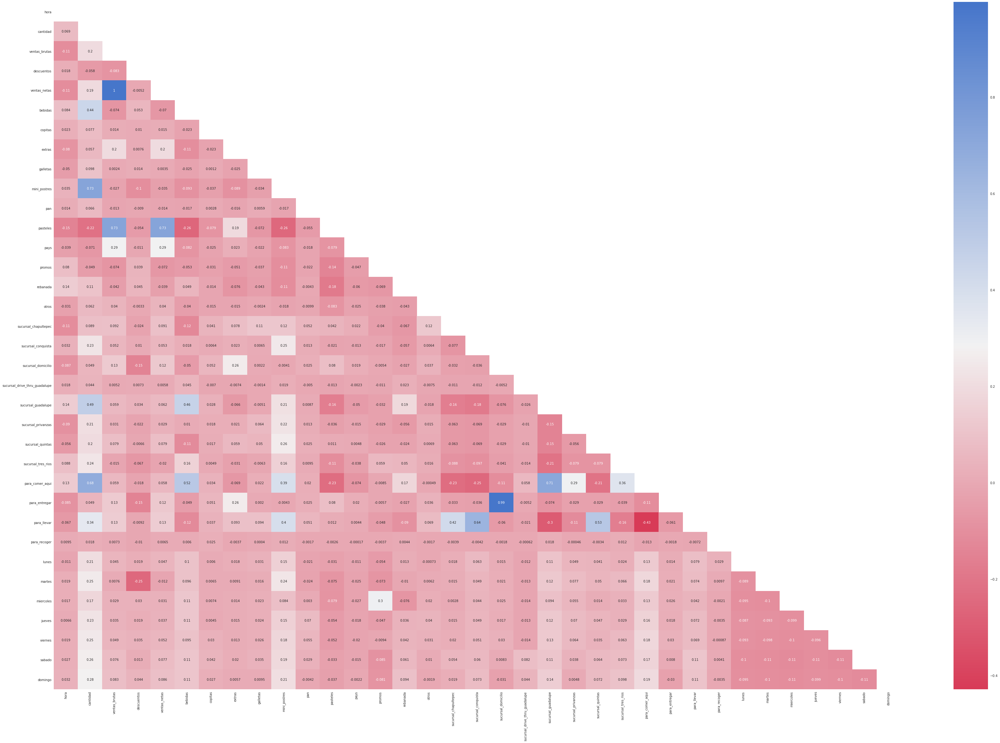

In [ ]:
#Aplicamos la función
matriz_correlacion (data_2021)

In [ ]:
#Observamos que las ventas netas y las ventas brutas tienen una correlación muy alta
#Obervamos que la sucursal_domicilio y para_entregar tienen una correlación muy alta 

#Decidimos eliminar la columna 'ventas_brutas' y 'descuentos' para solo tener las 'ventas_netas'
#Decidimos no eliminar la columna 'sucursal_domicilio' porque la estaríamos dejando fuera del análisis por sucursal.

data_2021 = data_2021.drop(columns = ['ventas_brutas'])
data_2021 = data_2021.drop(columns = ['descuentos'])

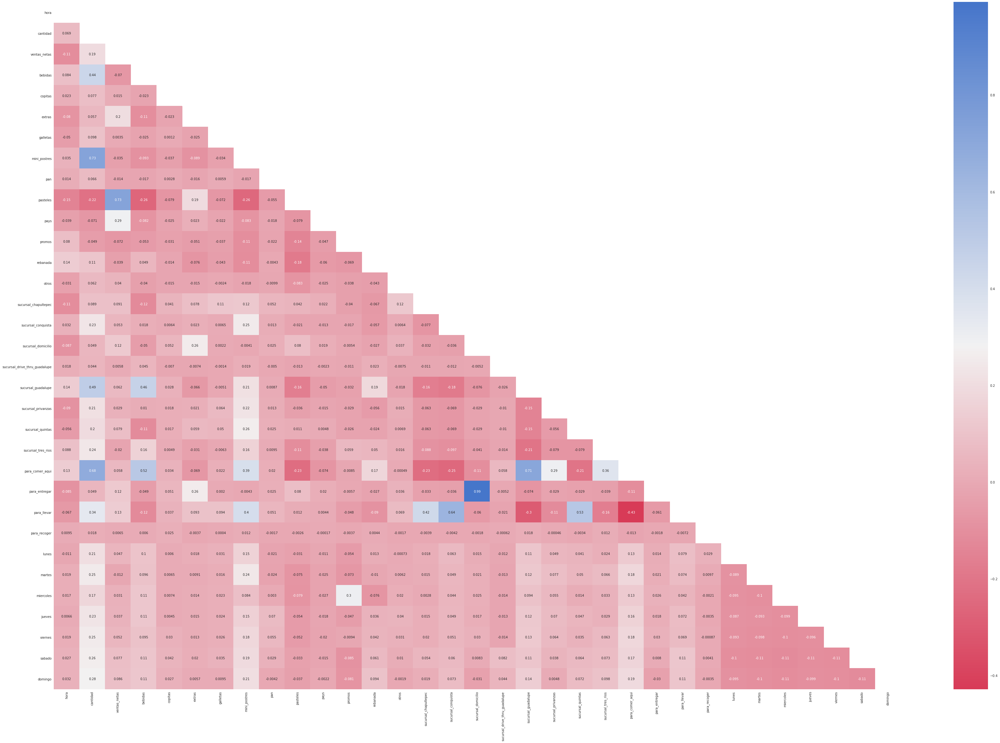

In [ ]:
#Aplicamos nuevamente la función.
matriz_correlacion (data_2021)

In [ ]:
#Solamente queda la correlación alta de las columnas 'sucursal_domicilio' y 'para_entregar'

## 8.2 Distribución de ventas por categoría y por sucursal - Periodo: enero a julio 2021


#### Creamos la función para graficar las ventas por categoría y por sucursal


In [ ]:
def grafica_ventas_categoria_sucursal(dataset, periodo):
  #Declaramos el grid con el tamaño de la gráfica.
  fig, ax = plt.subplots()
  fig.set_size_inches(25, 10)
  
  #Definimos el orden en que queremos mostrar las categorías
  hue_order = ['pasteles', 'bebidas', 'mini_postres', 'rebanada', 'pays', 'promos', 'otros', 'copitas', 'galletas', 'extras', 'pan']
  
  #Seleccionamos el tipo de gráfica y los datos a graficar
  grafica_ventas_categoria_sucursal = sns.barplot(x = "sucursal", y = "ventas_netas", hue = "categoria", hue_order = hue_order, data = dataset, estimator = sum, palette = "Accent", ci = None);
  
  #Nombramos la gráfica y los ejes de la gráfica
  plt.title(f'Distribución de ventas por categoría y por sucursal - Periodo: {periodo}', fontsize = 26)
  plt.xlabel('Sucursal', fontsize = 20)
  plt.ylabel('Ventas netas', fontsize = 20)
  
  #Fijamos la leyenda de las categorías en la esquinsa superior derecha
  plt.legend(loc = 'upper right')
  
  #Cambiamos el formato exponencial a numérico al eje y
  plt.ticklabel_format(style = 'plain', axis ='y')

  return grafica_ventas_categoria_sucursal

In [ ]:
data.head()

,id_transaccion,fecha_hora,mes,dia,hora,categoria,item,sucursal,tipo_servicio,cantidad,ventas_brutas,descuentos,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo
0,gsHaNtHqx9Td8zk3oci5L5reV,2021-07-31 21:54:52,julio,sabado,21,mini_postres,Mini Triple Chocolate,LAMARQUE Guadalupe,Para comer aquí,1.0,40.0,0.0,40.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,gsHaNtHqx9Td8zk3oci5L5reV,2021-07-31 21:54:52,julio,sabado,21,mini_postres,Mini Better Than Sex,LAMARQUE Guadalupe,Para comer aquí,1.0,40.0,0.0,40.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,gsHaNtHqx9Td8zk3oci5L5reV,2021-07-31 21:54:52,julio,sabado,21,copitas,Copita Glorias,LAMARQUE Guadalupe,Para comer aquí,1.0,85.0,0.0,85.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,KnQVfQokevimU7h1OCvnEaheV,2021-07-31 21:42:13,julio,sabado,21,rebanada,R. Desnudo de Chocolate,LAMARQUE Guadalupe,Para comer aquí,1.0,85.0,0.0,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,KnQVfQokevimU7h1OCvnEaheV,2021-07-31 21:42:13,julio,sabado,21,rebanada,R. Suspiro de Fresa,LAMARQUE Guadalupe,Para comer aquí,1.0,85.0,0.0,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


#### Ventas por mes Enero - Julio 2021

In [ ]:
#Agrupamos la información por mes y sumamos las ventas netas
ventas_mensuales_2021 = pd.DataFrame(data.groupby(['mes']).ventas_netas.sum())

#Ordenamos por mes del año
mes_del_año = ['enero', 'febrero', 'marzo', 'abril', 'mayo', 'junio', 'julio']
#Reiniciamos el índice del dataset
ventas_mensuales_2021 = ventas_mensuales_2021.reindex(mes_del_año)

#Agregamos el total por cada columna
ventas_mensuales_2021.loc['Total'] = ventas_mensuales_2021.sum()

#Mostramos el dataset
ventas_mensuales_2021

,ventas_netas
mes,
enero,1867344.45
febrero,1792387.95
marzo,1845440.40
abril,1811440.20
mayo,2161516.30
junio,1939993.35
julio,2093795.75
Total,13511918.40


Text(0, 0.5, 'Ventas netas')

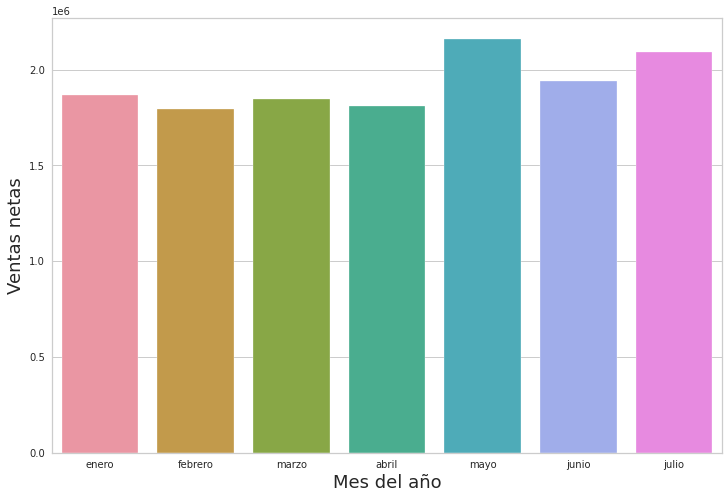

In [ ]:
sns.set_style("whitegrid")
bar, ax = plt.subplots(figsize = (12, 8))
  
ax = sns.barplot(x = ventas_mensuales_2021[0:-1].index, y = ventas_mensuales_2021[0:-1].ventas_netas)
  
#ax.set_title(f'{titulo}', fontsize = 22)
ax.set_xlabel ('Mes del año', fontsize = 18)
ax.set_ylabel ('Ventas netas', fontsize = 18)

#### Enero - Julio 2021

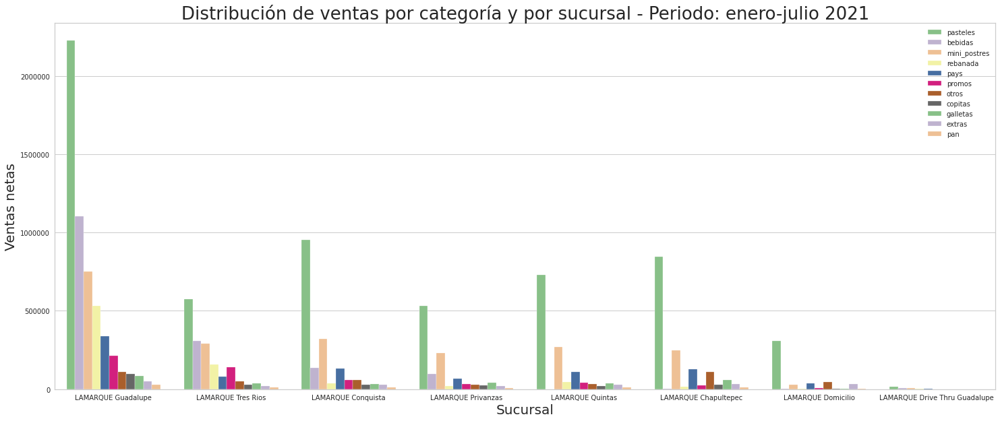

In [ ]:
grafica_ventas_categoria_sucursal(data, 'enero-julio 2021')

#### Enero 2021

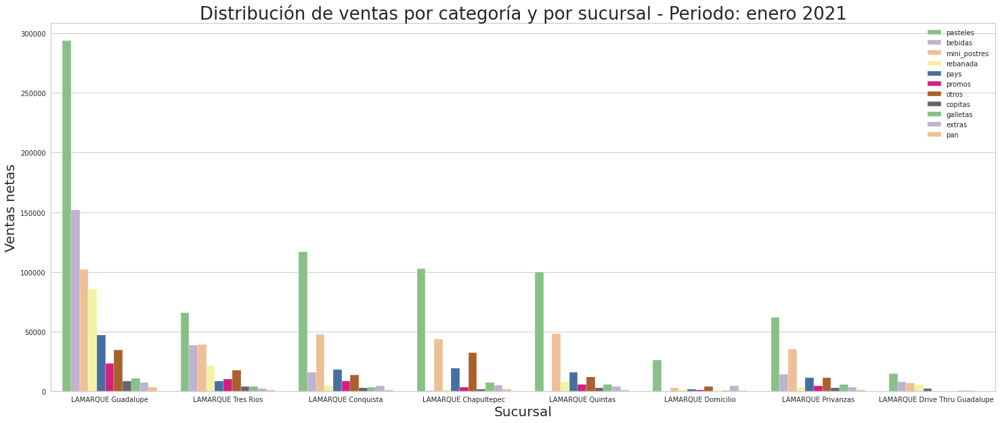

In [ ]:
grafica_ventas_categoria_sucursal(data[data['mes'] == 'enero'], 'enero 2021')

#### Febrero 2021

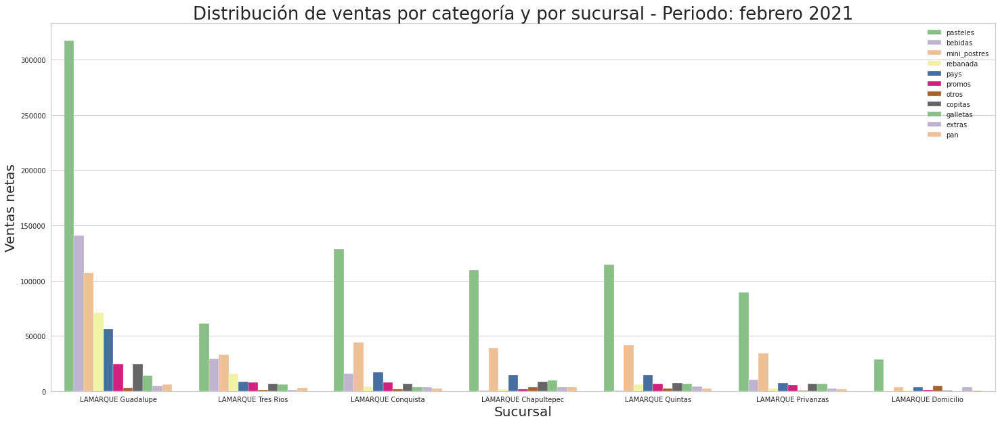

In [ ]:
grafica_ventas_categoria_sucursal(data[data['mes'] == 'febrero'], 'febrero 2021')

#### Marzo 2021

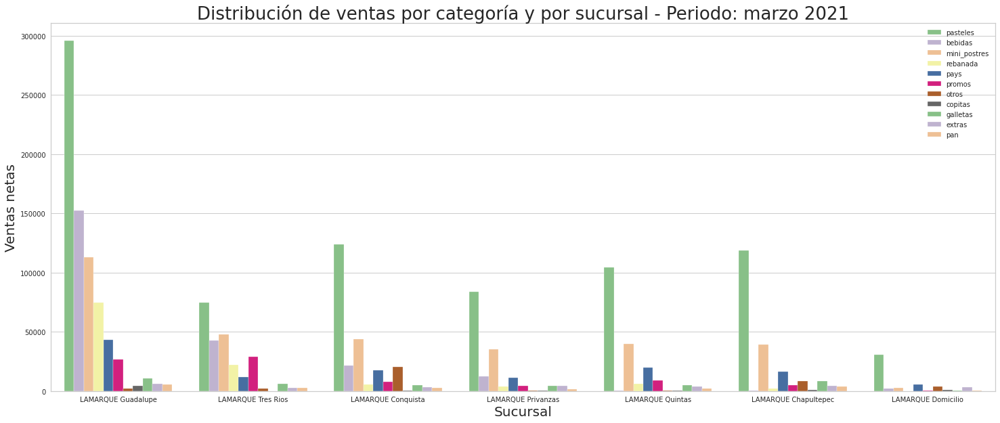

In [ ]:
grafica_ventas_categoria_sucursal(data[data['mes'] == 'marzo'], 'marzo 2021')

#### Abril 2021

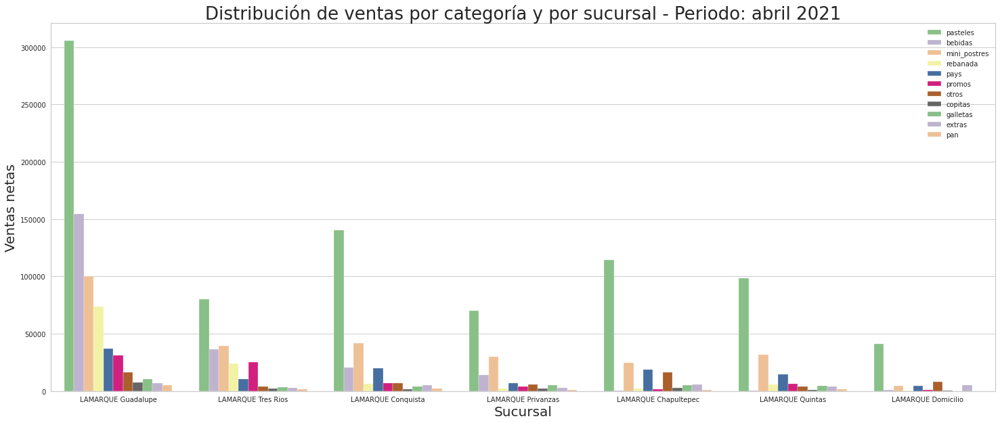

In [ ]:
grafica_ventas_categoria_sucursal(data[data['mes'] == 'abril'], 'abril 2021')

#### Mayo 2021

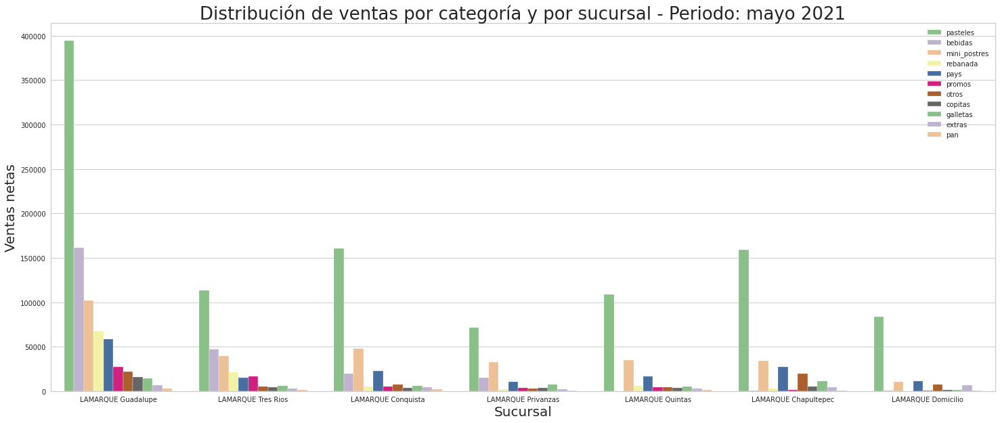

In [ ]:
grafica_ventas_categoria_sucursal(data[data['mes'] == 'mayo'], 'mayo 2021')

#### Junio 2021

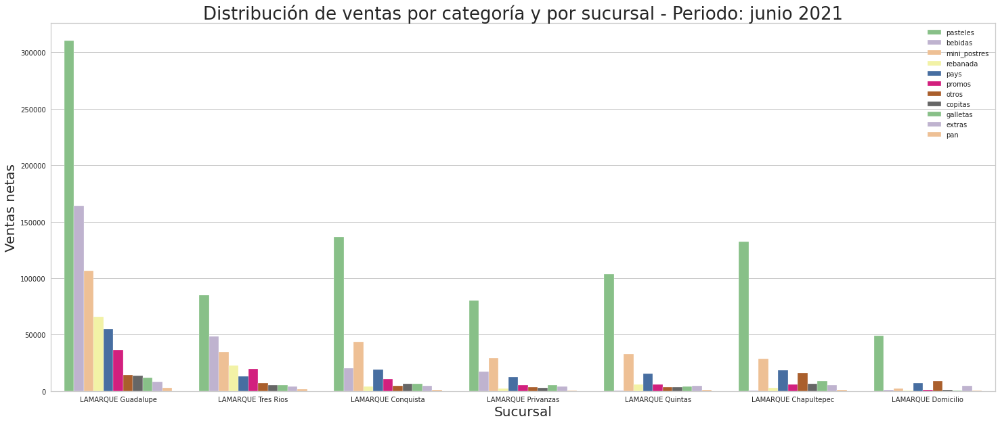

In [ ]:
grafica_ventas_categoria_sucursal(data[data['mes'] == 'junio'], 'junio 2021')

#### Julio 2021

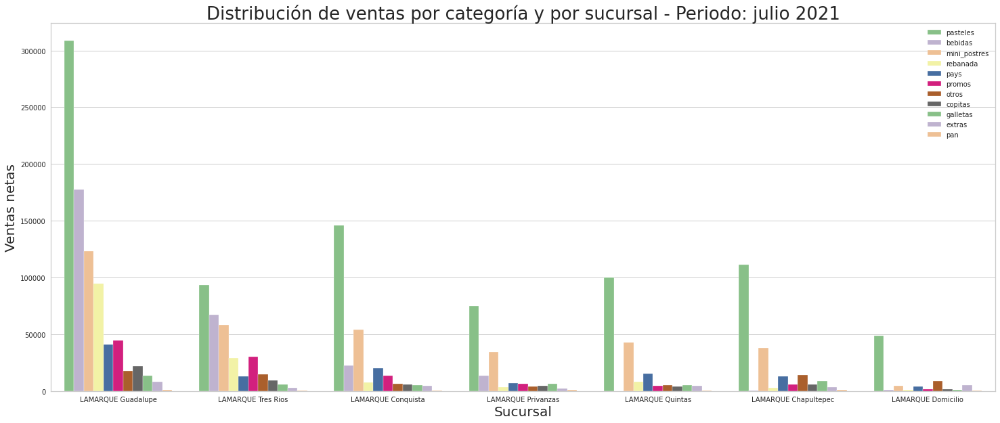

In [ ]:
grafica_ventas_categoria_sucursal(data[data['mes'] == 'julio'], 'julio 2021')

## 8.3 Análisis de ventas por día de la semana

### 8.3.1 Dataset agrupado con cuenta de registros .count()

#### Creamos el dataset agrupando la información por día - Cuenta de registros

In [ ]:
#Agrupamos la información por día y contamos los registros que hay por cada columna para cada día
data_por_dia_cuenta = data_2021.groupby(['dia']).count()

#Ordenamos por día de la semana
dias_semana = ['lunes', 'martes', 'miercoles', 'jueves', 'viernes', 'sabado', 'domingo']
#Reiniciamos el índice del dataset
data_por_dia_cuenta = data_por_dia_cuenta.reindex(dias_semana)

#Agregamos el total por cada columna
data_por_dia_cuenta.loc['Total'] = data_por_dia_cuenta.sum()

#Mostramos el dataset
data_por_dia_cuenta

,id_transaccion,fecha_hora,mes,hora,cantidad,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo
dia,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
lunes,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514,7514
martes,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000,8000
miercoles,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523,9523
jueves,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063,8063
viernes,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135,9135
sabado,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593,10593
domingo,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539,9539
Total,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367,62367


#### Creamos la función para graficar las ventas por día de la semana

In [ ]:
def grafica_barras_dataset_cuenta_con_columna_totales(dataset, titulo, xlabel, ylabel):
  sns.set_style("whitegrid")
  bar, ax = plt.subplots(figsize = (12, 8))
  
  ax = sns.barplot(x = dataset[0:-1].index, y = dataset[0:-1].id_transaccion)
  
  #ax.set_title(f'{titulo}', fontsize = 22)
  ax.set_xlabel (f'{xlabel}', fontsize = 18)
  ax.set_ylabel (f'{ylabel}', fontsize = 18)

  return ax

#### Aplicamos la función para graficar las ventas por día de la semana

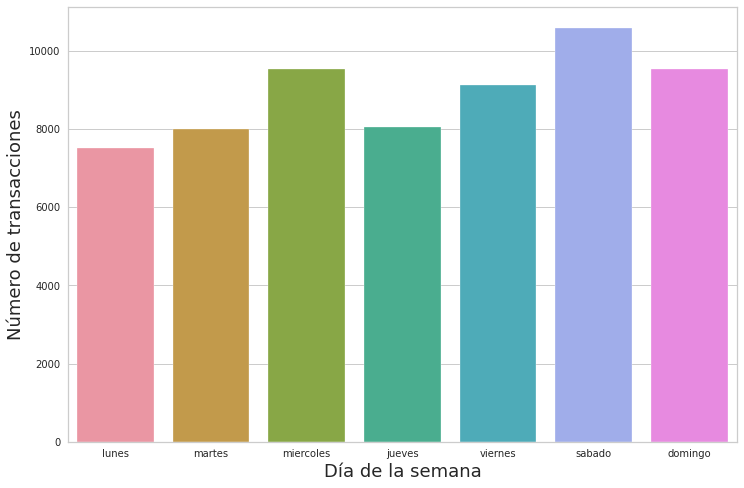

In [ ]:
grafica_barras_dataset_cuenta_con_columna_totales (data_por_dia_cuenta, 'Distribución de transacciones por día de la semana', 'Día de la semana', 'Número de transacciones')

### 8.3.2 Dataset agrupado con suma de registros .sum()

#### Creamos el dataset agrupando la información por día - Suma de registros

In [ ]:
#Agrupamos la información por día y sumamos los registros que hay por cada columna para cada día
data_por_dia_suma = data_2021.groupby(['dia']).sum()

#Ordenamos por día de la semana
dias_semana = ['lunes', 'martes', 'miercoles', 'jueves', 'viernes', 'sabado', 'domingo']
#Reiniciamos el índice del dataset
data_por_dia_suma = data_por_dia_suma.reindex(dias_semana)

#Agregamos el total por cada columna
data_por_dia_suma.loc['Total'] = data_por_dia_suma.sum()

#Mostramos el dataset
data_por_dia_suma

,hora,cantidad,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo
dia,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
lunes,114815.0,15789.0,1658599.50,4012.0,300.0,628.0,565.0,6022.0,46.0,2408.0,322.0,131.0,1055.0,300.0,1390.0,1977.0,349.0,0.0,7188.0,1548.0,1315.0,2022.0,10716.0,350.0,4705.0,18.0,15789.0,0.0,0.0,0.0,0.0,0.0,0.0
martes,125098.0,18605.0,1564972.30,4467.0,344.0,638.0,531.0,8947.0,46.0,1973.0,267.0,30.0,991.0,371.0,1331.0,2218.0,389.0,0.0,8122.0,1937.0,1577.0,3031.0,13046.0,389.0,5160.0,10.0,0.0,18605.0,0.0,0.0,0.0,0.0,0.0
miercoles,149912.0,18013.0,1890992.95,4673.0,309.0,649.0,533.0,5006.0,126.0,1942.0,244.0,3623.0,372.0,536.0,1432.0,2232.0,439.0,0.0,8077.0,1805.0,1316.0,2712.0,12560.0,448.0,5000.0,5.0,0.0,0.0,18013.0,0.0,0.0,0.0,0.0
jueves,125515.0,17342.0,1676518.20,4589.0,298.0,656.0,554.0,6247.0,417.0,2201.0,292.0,235.0,1414.0,439.0,1336.0,2084.0,394.0,0.0,7991.0,1820.0,1496.0,2221.0,12005.0,401.0,4933.0,3.0,0.0,0.0,0.0,17342.0,0.0,0.0,0.0
viernes,143397.0,19513.0,1950299.60,4540.0,444.0,713.0,596.0,7228.0,364.0,2604.0,327.0,656.0,1528.0,513.0,1522.0,2372.0,472.0,0.0,8749.0,1900.0,1437.0,3061.0,13667.0,476.0,5364.0,6.0,0.0,0.0,0.0,0.0,19513.0,0.0,0.0
sabado,166576.0,22720.0,2403898.65,5380.0,591.0,891.0,729.0,8400.0,271.0,3506.0,455.0,36.0,2002.0,459.0,2166.0,2923.0,429.0,242.0,9526.0,1713.0,2111.0,3610.0,15062.0,434.0,7214.0,10.0,0.0,0.0,0.0,0.0,0.0,22720.0,0.0
domingo,150097.0,21110.0,2219336.20,4635.0,508.0,687.0,499.0,8465.0,130.0,3079.0,508.0,14.0,2244.0,341.0,1719.0,2879.0,76.0,182.0,9357.0,1043.0,2203.0,3651.0,14210.0,84.0,6813.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,21110.0
Total,975410.0,133092.0,13364617.40,32296.0,2794.0,4862.0,4007.0,50315.0,1400.0,17713.0,2415.0,4725.0,9606.0,2959.0,10896.0,16685.0,2548.0,424.0,59010.0,11766.0,11455.0,20308.0,91266.0,2582.0,39189.0,55.0,15789.0,18605.0,18013.0,17342.0,19513.0,22720.0,21110.0


#### Creamos la función para generar gráficas de pie para análisis

In [ ]:
def grafica_pie_analisis (dataset, variable, titulo):
    fig1, ax1 = plt.subplots()
    fig1.set_size_inches(18.5, 10.5)
    ax1.pie(dataset[0:-1][variable], autopct = '%1.1f%%', labels = dataset[0:-1].index, startangle = 90, textprops={'fontsize': 18})
    # Con el [0:-1] quitamos la última fila (total) del dataset para que no se dupliquen los datos
    plt.title(f'{titulo} {variable}', fontsize = 18)
    plt.show()

#### Aplicamos la función para la gráfica de pie para análisis por día por concepto

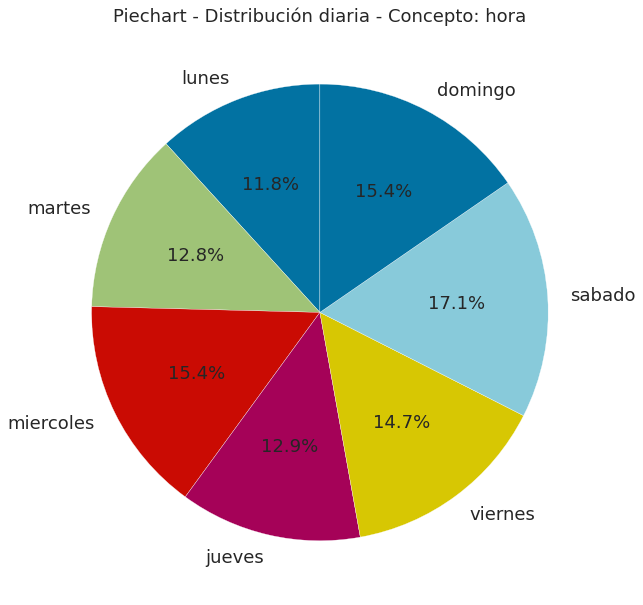

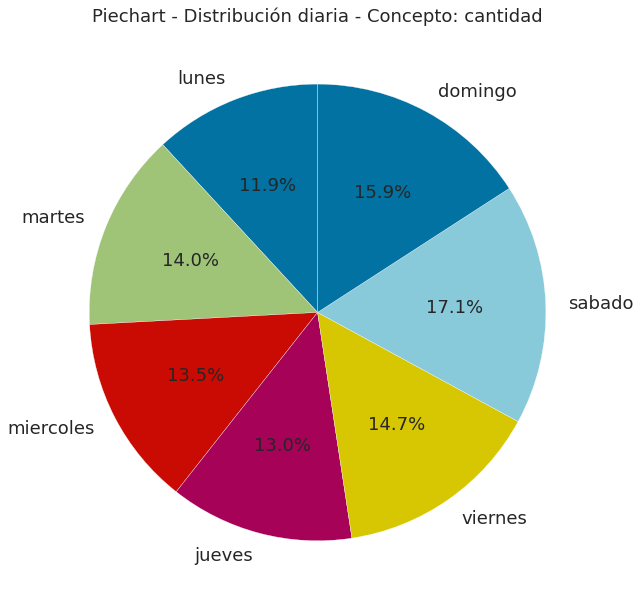

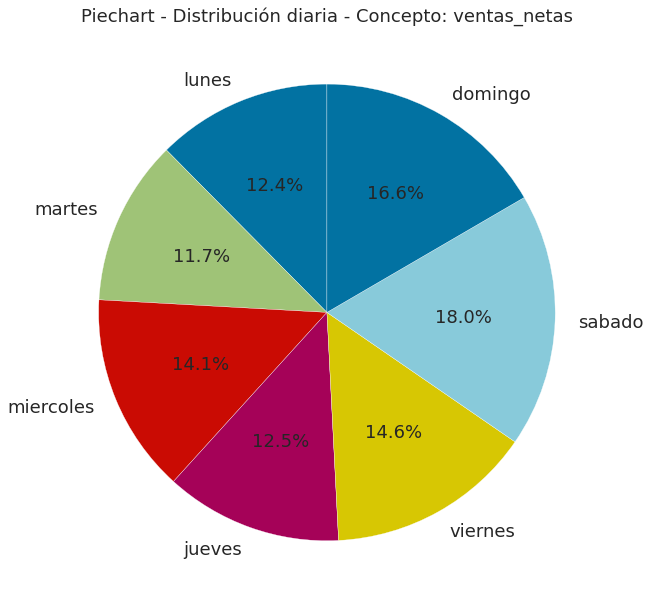

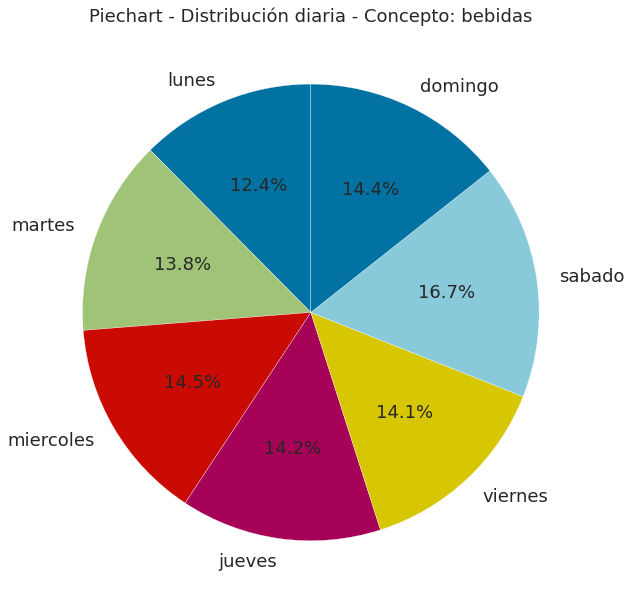

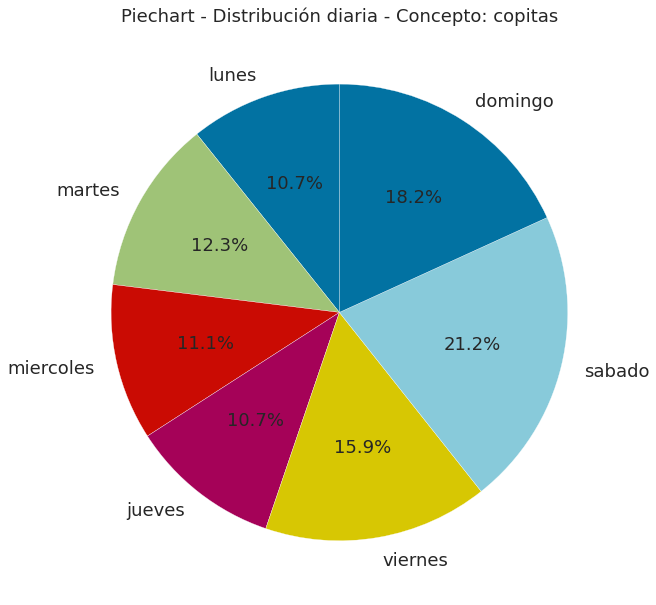

...

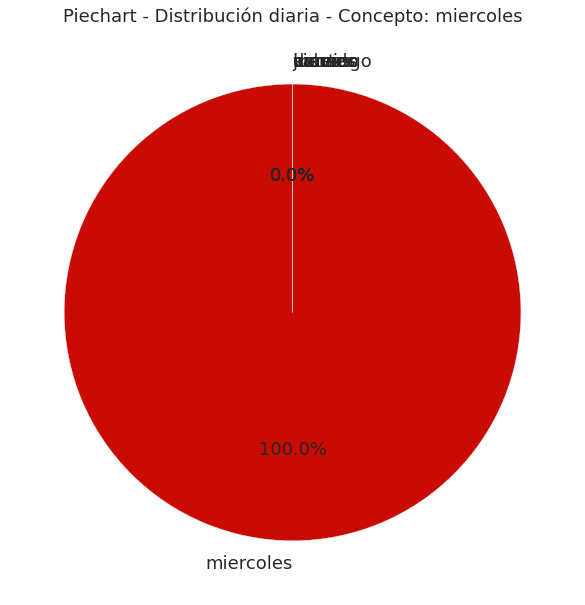

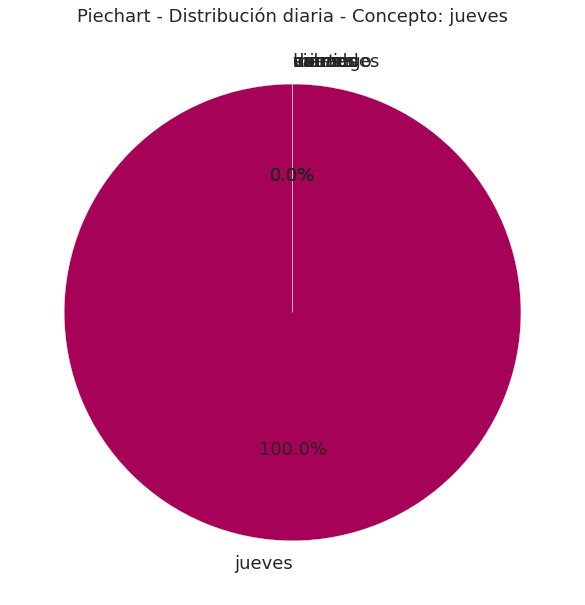

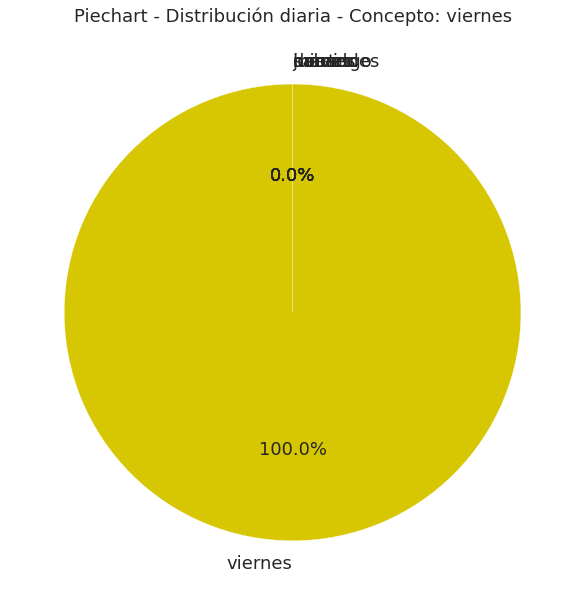

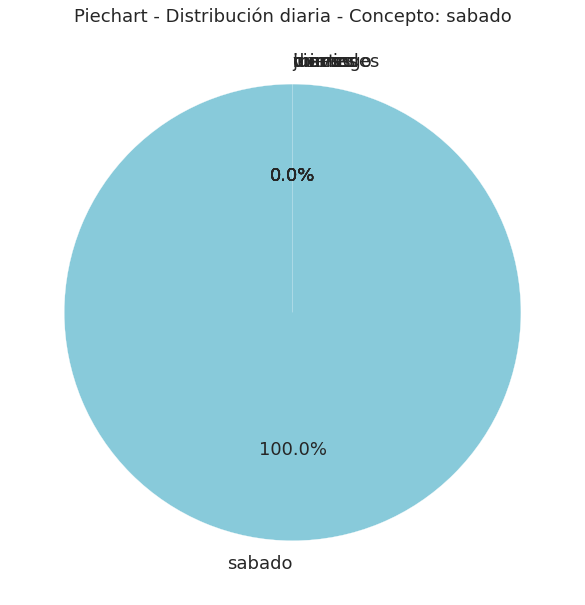

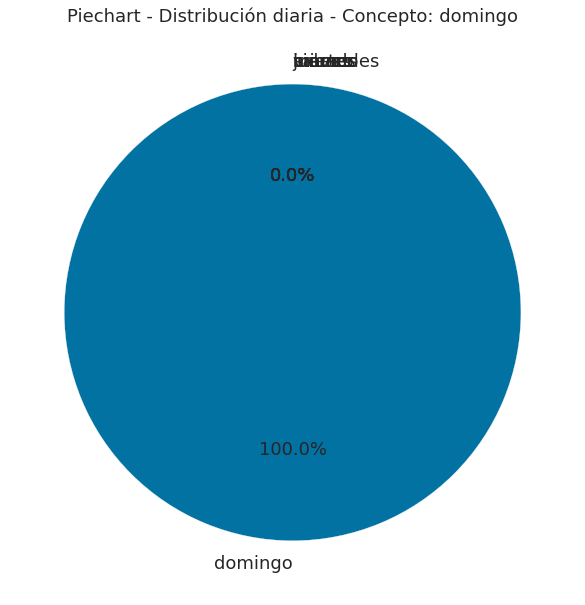

In [ ]:
for variable in data_por_dia_suma.columns:
    grafica_pie_analisis (data_por_dia_suma, variable, 'Piechart - Distribución diaria - Concepto:')

#### 8.3.2.1 Distribución de cantidad de productos vendidos por día por sucursal

##### Creamos el dataset

In [ ]:
#Filtramos las columnas de los productos vendidos por día de cada sucursal
productos_vendidos_por_dia_por_sucursal = data_por_dia_suma[['sucursal_chapultepec', 'sucursal_conquista', 'sucursal_domicilio', 'sucursal_drive_thru_guadalupe', 'sucursal_guadalupe', 'sucursal_privanzas', 'sucursal_quintas', 'sucursal_tres_rios']]

#Agregamos el total por día
productos_vendidos_por_dia_por_sucursal = productos_vendidos_por_dia_por_sucursal.T
productos_vendidos_por_dia_por_sucursal.loc['Total'] = productos_vendidos_por_dia_por_sucursal.sum()
productos_vendidos_por_dia_por_sucursal = productos_vendidos_por_dia_por_sucursal.T

#Mostramos el dataset
productos_vendidos_por_dia_por_sucursal

,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,Total
dia,,,,,,,,,
lunes,1390.0,1977.0,349.0,0.0,7188.0,1548.0,1315.0,2022.0,15789.0
martes,1331.0,2218.0,389.0,0.0,8122.0,1937.0,1577.0,3031.0,18605.0
miercoles,1432.0,2232.0,439.0,0.0,8077.0,1805.0,1316.0,2712.0,18013.0
jueves,1336.0,2084.0,394.0,0.0,7991.0,1820.0,1496.0,2221.0,17342.0
viernes,1522.0,2372.0,472.0,0.0,8749.0,1900.0,1437.0,3061.0,19513.0
sabado,2166.0,2923.0,429.0,242.0,9526.0,1713.0,2111.0,3610.0,22720.0
domingo,1719.0,2879.0,76.0,182.0,9357.0,1043.0,2203.0,3651.0,21110.0
Total,10896.0,16685.0,2548.0,424.0,59010.0,11766.0,11455.0,20308.0,133092.0


##### Usamos la función para generar gráficas de pie para análisis

In [ ]:
#Función: grafica_pie_analisis

##### Aplicamos la función para la gráfica de pie para análisis por día de la semana por sucursal

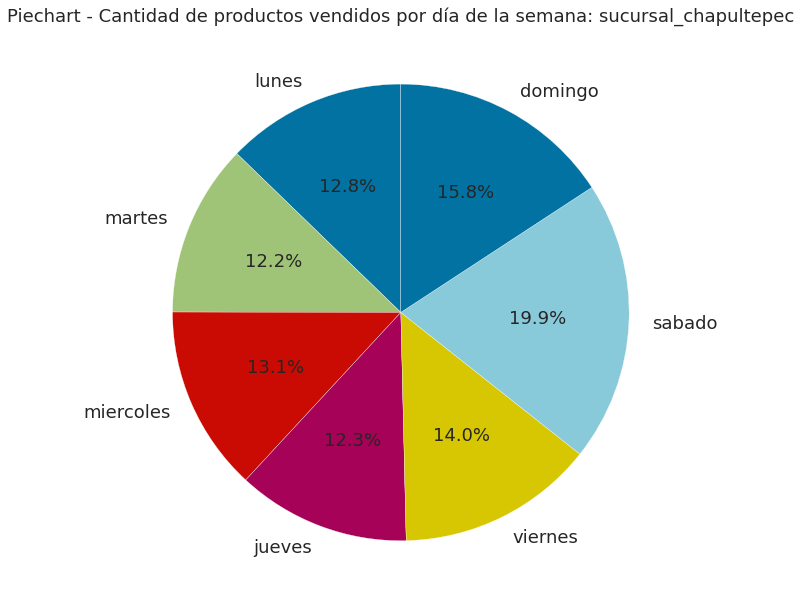

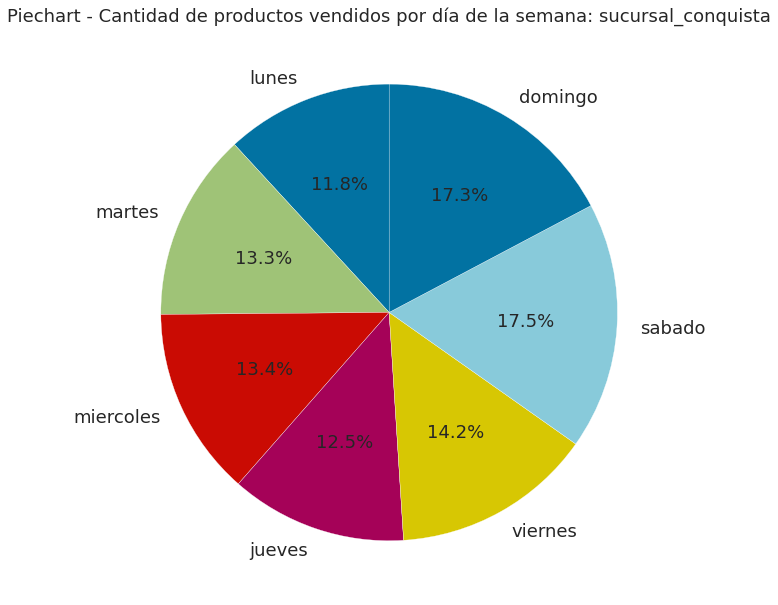

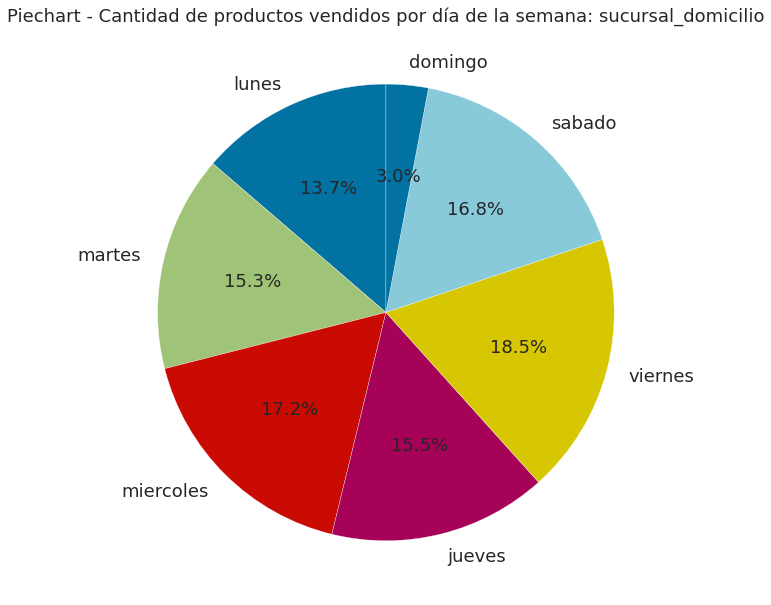

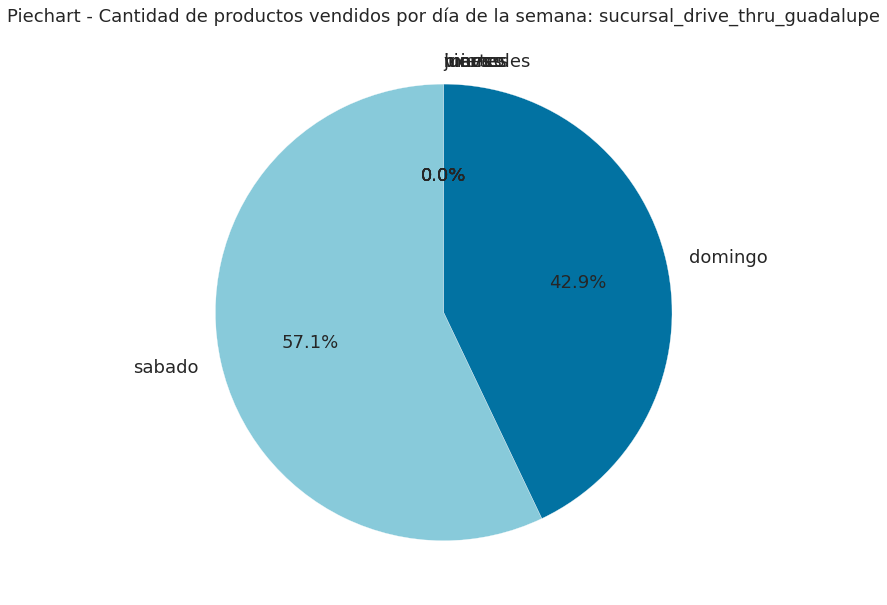

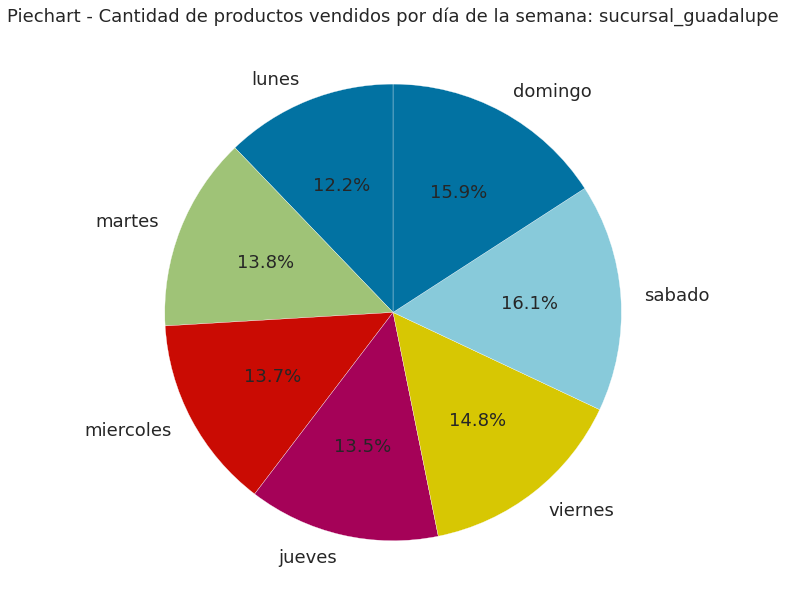

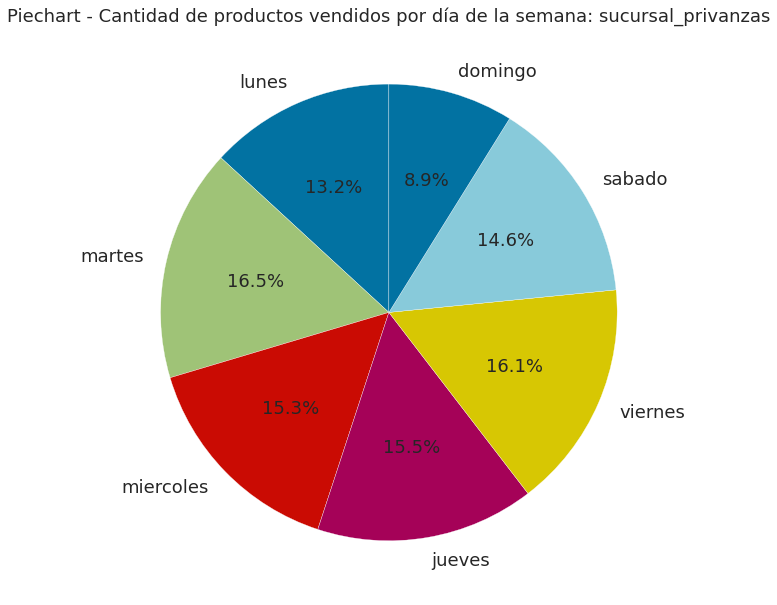

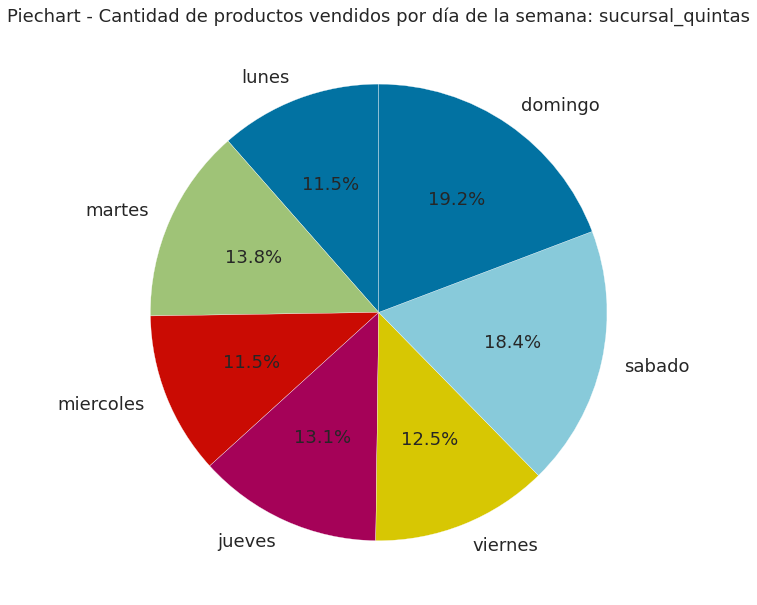

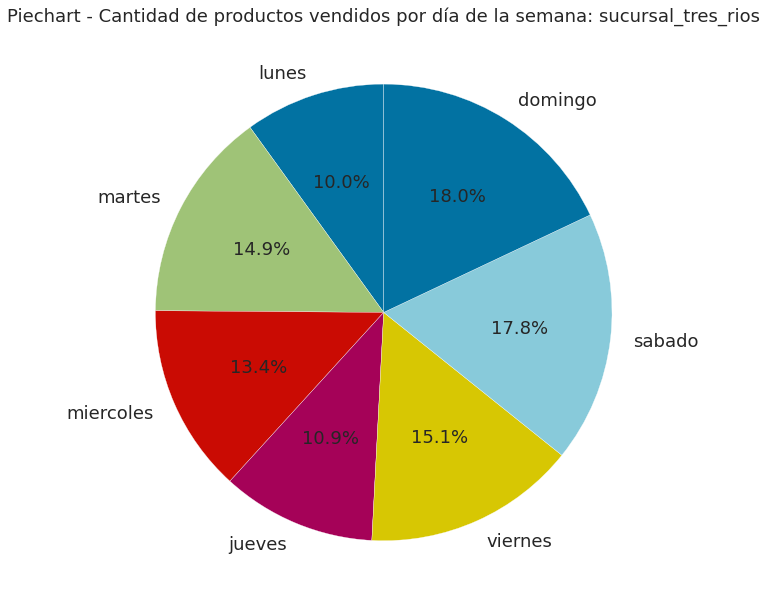

In [ ]:
sucursales = ['sucursal_chapultepec', 'sucursal_conquista', 'sucursal_domicilio', 'sucursal_drive_thru_guadalupe', 'sucursal_guadalupe', 'sucursal_privanzas', 'sucursal_quintas', 'sucursal_tres_rios']

for variable in sucursales:
    grafica_pie_analisis (productos_vendidos_por_dia_por_sucursal, variable, 'Piechart - Cantidad de productos vendidos por día de la semana:')

#### 8.3.2.2 Distribución de cantidad de productos vendidos por día por tipo de servicio

##### Creamos el dataset

In [ ]:
#Filtramos las columnas de los productos vendidos por día de cada sucursal
productos_vendidos_por_dia_por_tipodeservicio = data_por_dia_suma[['para_comer_aqui', 'para_entregar', 'para_llevar', 'para_recoger']]

#Agregamos el total por día
productos_vendidos_por_dia_por_tipodeservicio = productos_vendidos_por_dia_por_tipodeservicio.T
productos_vendidos_por_dia_por_tipodeservicio.loc['Total'] = productos_vendidos_por_dia_por_tipodeservicio.sum()
productos_vendidos_por_dia_por_tipodeservicio = productos_vendidos_por_dia_por_tipodeservicio.T

#Mostramos el dataset
productos_vendidos_por_dia_por_tipodeservicio

,para_comer_aqui,para_entregar,para_llevar,para_recoger,Total
dia,,,,,
lunes,10716.0,350.0,4705.0,18.0,15789.0
martes,13046.0,389.0,5160.0,10.0,18605.0
miercoles,12560.0,448.0,5000.0,5.0,18013.0
jueves,12005.0,401.0,4933.0,3.0,17342.0
viernes,13667.0,476.0,5364.0,6.0,19513.0
sabado,15062.0,434.0,7214.0,10.0,22720.0
domingo,14210.0,84.0,6813.0,3.0,21110.0
Total,91266.0,2582.0,39189.0,55.0,133092.0


##### Usamos la función para generar gráficas de pie para análisis

In [ ]:
#Función: grafica_pie_analisis

##### Aplicamos la función para la gráfica de pie para análisis por día por tipo de servicio

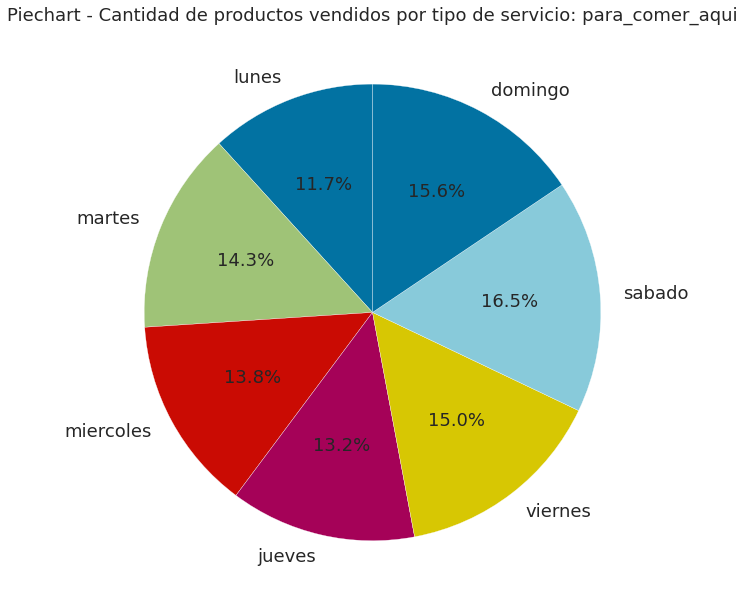

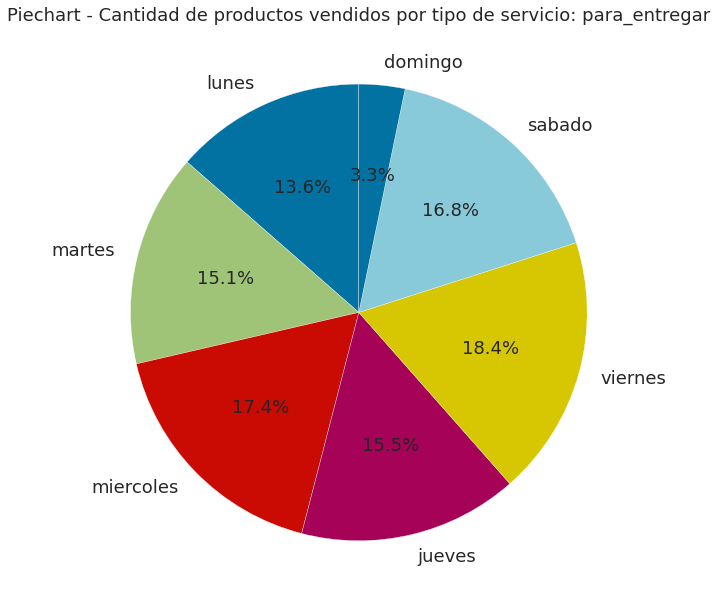

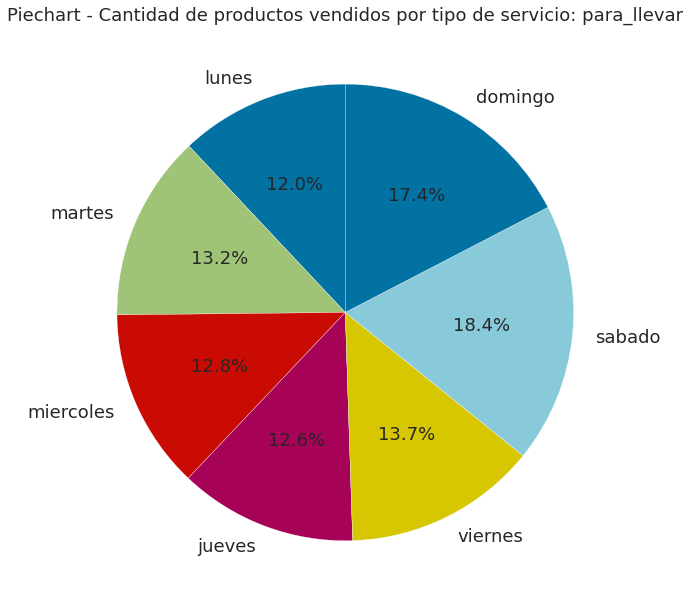

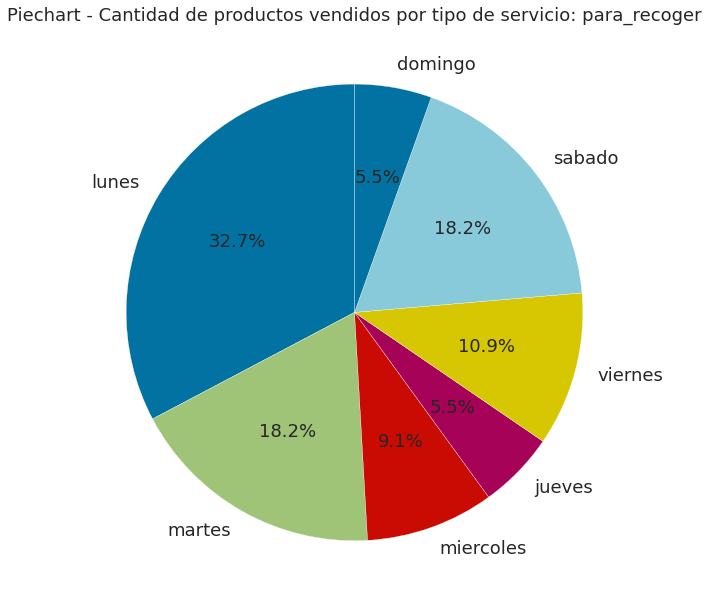

In [ ]:
servicios = ['para_comer_aqui', 'para_entregar', 'para_llevar', 'para_recoger']

for variable in servicios:
    grafica_pie_analisis (productos_vendidos_por_dia_por_tipodeservicio, variable, 'Piechart - Cantidad de productos vendidos por tipo de servicio:')

## 8.4 Análisis de ventas por hora del día

### 8.4.1 Dataset agrupado con cuenta de registros .count()

#### Creamos el dataset agrupando la información por hora - Cuenta de registros

In [ ]:
#Agrupamos la información por hora y contamos los registros que hay por cada columna para cada hora
data_por_hora_cuenta = data_2021.groupby(['hora']).count()

#Agregamos el total por cada columna
data_por_hora_cuenta.loc['Total'] = data_por_hora_cuenta.sum()

#Mostramos el dataset
data_por_hora_cuenta

,id_transaccion,fecha_hora,mes,dia,cantidad,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo
hora,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11
8,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696,696
9,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683,1683
10,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213,2213
11,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043,3043
12,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189,4189
13,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981,4981
14,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209,5209
15,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369,5369


#### Usamos la función para generar gráficas de barras para dataset con columnas con totales


In [ ]:
#Función: grafica_barras_dataset_cuenta_con_columna_totales

#### Aplicamos la función para graficar las ventas por hora del día

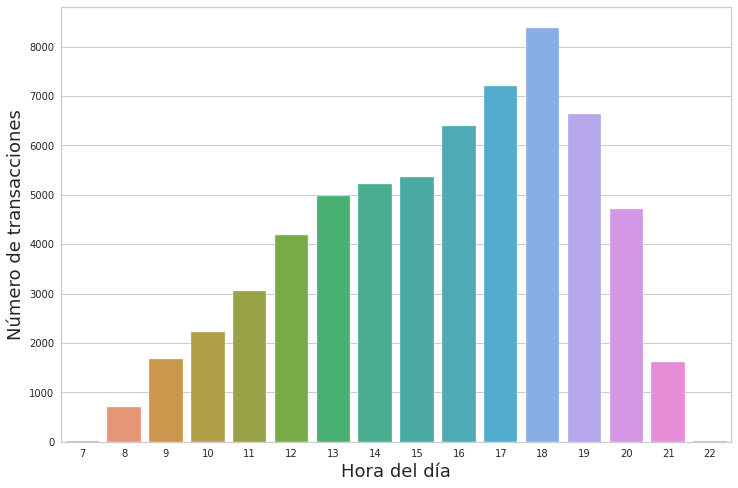

In [ ]:
grafica_barras_dataset_cuenta_con_columna_totales (data_por_hora_cuenta, 'Distribución de transacciones por hora del día', 'Hora del día', 'Número de transacciones')

### 8.4.2 Dataset agrupado con suma de registros .sum()

#### Creamos el dataset agrupando la información por hora - Suma de registros

In [ ]:
#Agrupamos la información por día y contamos los registros que hay por cada columna para cada día
data_por_hora_suma = data_2021.groupby(['hora']).sum()

#Agregamos el total por cada columna
data_por_hora_suma.loc['Total'] = data_por_hora_suma.sum()

#Mostramos el dataset
data_por_hora_suma

,cantidad,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo
hora,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7,20.0,2303.00,7.0,0.0,0.0,2.0,2.0,0.0,3.0,0.0,0.0,5.0,1.0,0.0,5.0,0.0,0.0,7.0,5.0,0.0,3.0,15.0,0.0,5.0,0.0,4.0,3.0,6.0,3.0,0.0,4.0,0.0
8,1411.0,127943.60,599.0,15.0,54.0,56.0,416.0,11.0,166.0,16.0,25.0,34.0,19.0,8.0,115.0,19.0,4.0,728.0,331.0,4.0,202.0,1265.0,20.0,126.0,0.0,215.0,277.0,218.0,277.0,275.0,140.0,9.0
9,3305.0,342608.80,1203.0,39.0,169.0,149.0,959.0,21.0,512.0,56.0,51.0,67.0,79.0,342.0,336.0,150.0,2.0,1325.0,517.0,200.0,433.0,2276.0,150.0,879.0,0.0,560.0,506.0,514.0,516.0,681.0,446.0,82.0
10,4468.0,492917.05,1274.0,77.0,200.0,220.0,1474.0,38.0,749.0,77.0,88.0,156.0,115.0,529.0,467.0,191.0,0.0,1807.0,676.0,320.0,478.0,2956.0,193.0,1319.0,0.0,713.0,661.0,712.0,683.0,765.0,766.0,168.0
11,6142.0,712889.75,1401.0,102.0,368.0,299.0,2153.0,58.0,1116.0,126.0,130.0,232.0,157.0,868.0,641.0,321.0,2.0,2291.0,694.0,611.0,714.0,3686.0,322.0,2134.0,0.0,894.0,861.0,767.0,892.0,909.0,939.0,880.0
12,8357.0,1031663.45,1505.0,158.0,496.0,362.0,3119.0,75.0,1690.0,230.0,146.0,336.0,240.0,1250.0,879.0,304.0,17.0,3088.0,987.0,963.0,869.0,4953.0,304.0,3097.0,3.0,1016.0,1169.0,993.0,1082.0,1241.0,1454.0,1402.0
13,9909.0,1224734.35,1507.0,207.0,541.0,397.0,3811.0,89.0,2005.0,268.0,275.0,510.0,299.0,1315.0,1189.0,264.0,30.0,3427.0,1275.0,1307.0,1102.0,5829.0,264.0,3816.0,0.0,1190.0,1297.0,1319.0,1206.0,1233.0,1820.0,1844.0
14,10356.0,1274271.45,1321.0,236.0,579.0,338.0,4216.0,117.0,2025.0,306.0,353.0,538.0,327.0,1174.0,1342.0,306.0,21.0,3438.0,1276.0,1467.0,1332.0,6062.0,307.0,3987.0,0.0,1175.0,1270.0,1299.0,1281.0,1348.0,1824.0,2159.0
15,11066.0,1235227.10,1837.0,230.0,464.0,316.0,4498.0,116.0,1815.0,273.0,400.0,734.0,383.0,1217.0,1499.0,270.0,46.0,3965.0,1205.0,1401.0,1463.0,6660.0,272.0,4131.0,3.0,1159.0,1484.0,1480.0,1321.0,1472.0,1933.0,2217.0


#### Usamos la función para generar gráficas de pie para análisis

In [ ]:
#Función: grafica_pie_analisis

#### Aplicamos la función para la gráfica de pie para análisis por hora del día por concepto

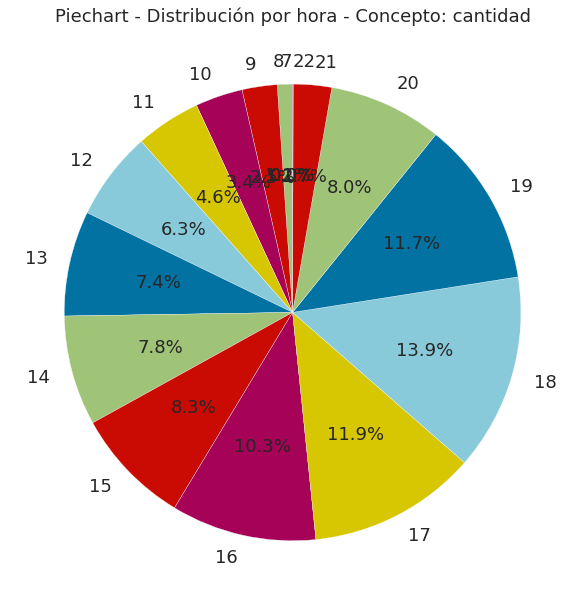

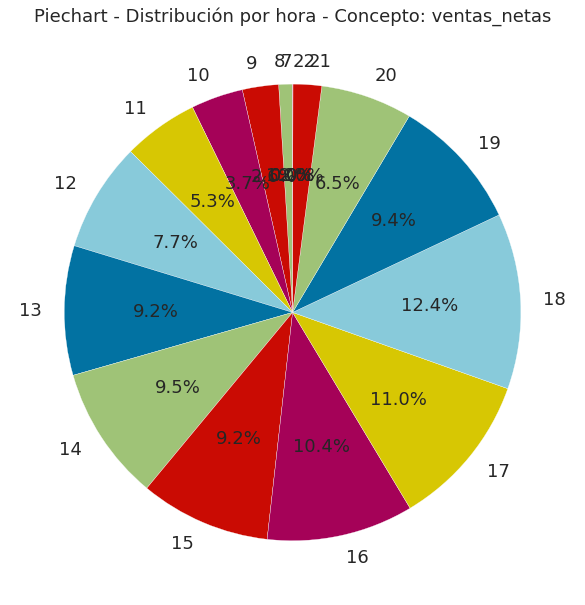

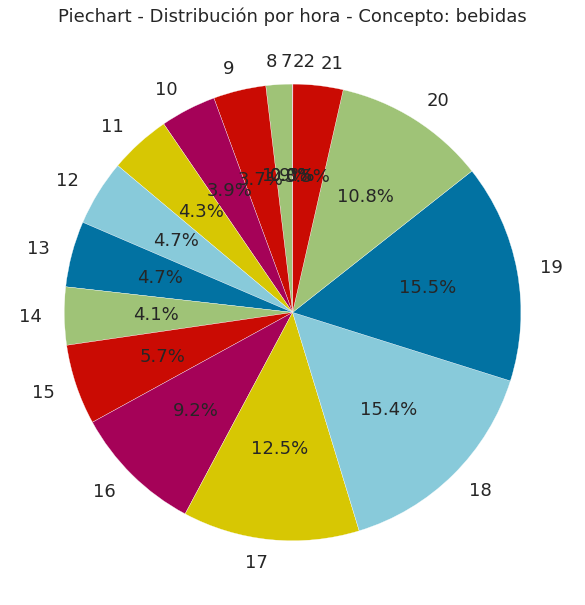

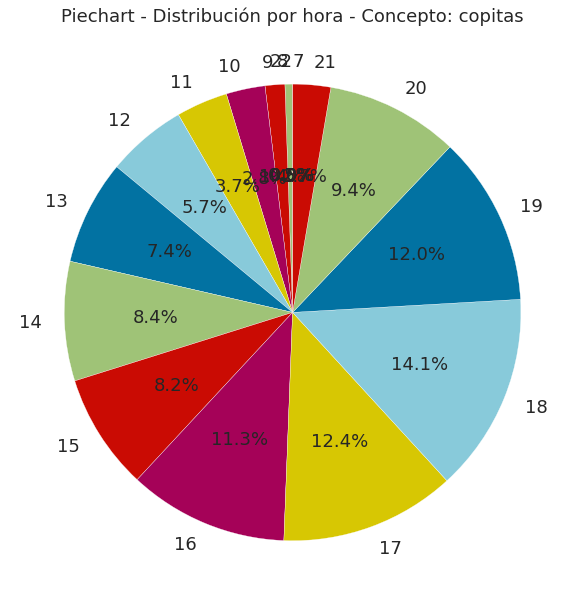

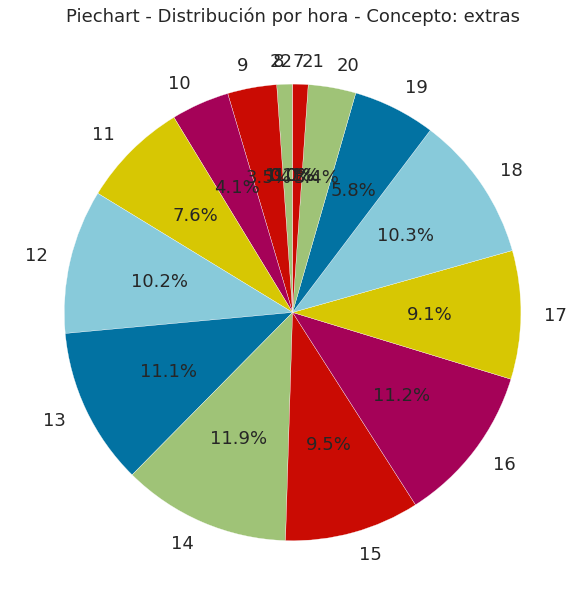

...

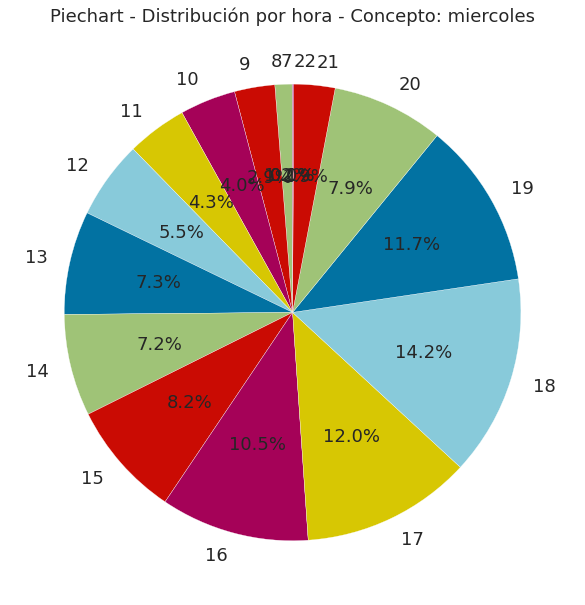

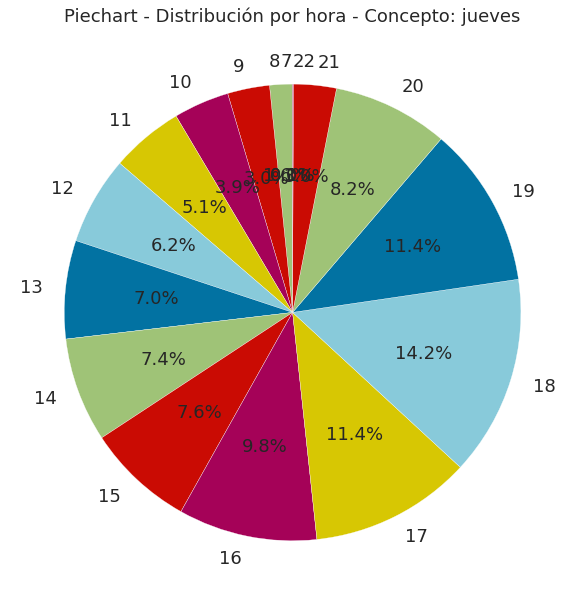

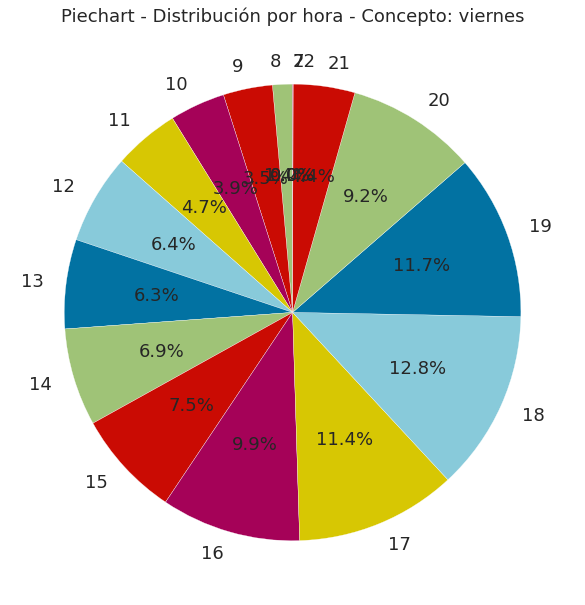

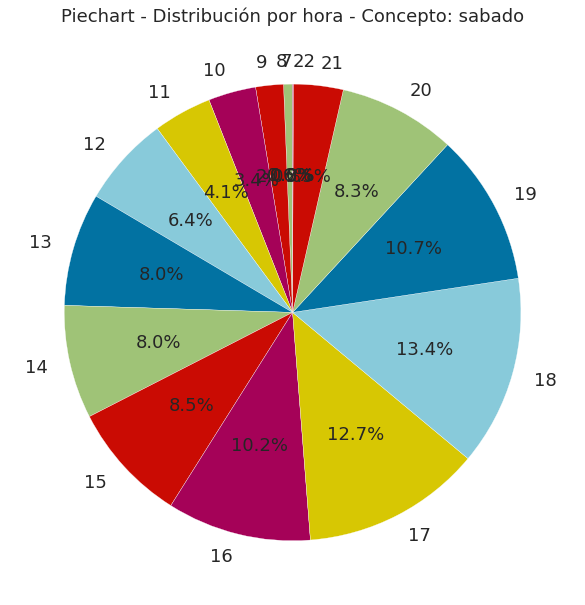

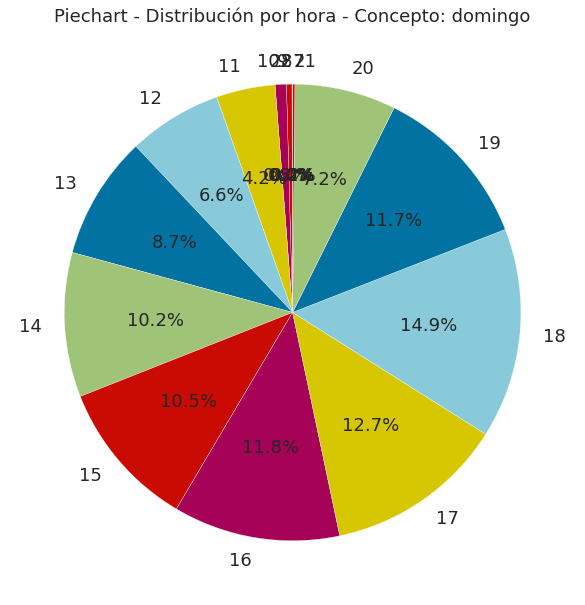

In [ ]:
for variable in data_por_hora_suma.columns:
    grafica_pie_analisis (data_por_hora_suma, variable, 'Piechart - Distribución por hora - Concepto:')

#### 8.4.2.1 Distribución de cantidad de productos vendidos por hora del día por sucursal

##### Creamos el dataset

In [ ]:
#Filtramos las columnas de los productos vendidos por día de cada sucursal
productos_vendidos_por_hora_por_sucursal = data_por_hora_suma[['sucursal_chapultepec', 'sucursal_conquista', 'sucursal_domicilio', 'sucursal_drive_thru_guadalupe', 'sucursal_guadalupe', 'sucursal_privanzas', 'sucursal_quintas', 'sucursal_tres_rios']]

#Agregamos el total por hora
productos_vendidos_por_hora_por_sucursal = productos_vendidos_por_hora_por_sucursal.T
productos_vendidos_por_hora_por_sucursal.loc['Total'] = productos_vendidos_por_hora_por_sucursal.sum()
productos_vendidos_por_hora_por_sucursal = productos_vendidos_por_hora_por_sucursal.T

#Mostramos el dataset
productos_vendidos_por_hora_por_sucursal

,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,Total
hora,,,,,,,,,
7,0.0,5.0,0.0,0.0,7.0,5.0,0.0,3.0,20.0
8,8.0,115.0,19.0,4.0,728.0,331.0,4.0,202.0,1411.0
9,342.0,336.0,150.0,2.0,1325.0,517.0,200.0,433.0,3305.0
10,529.0,467.0,191.0,0.0,1807.0,676.0,320.0,478.0,4468.0
11,868.0,641.0,321.0,2.0,2291.0,694.0,611.0,714.0,6142.0
12,1250.0,879.0,304.0,17.0,3088.0,987.0,963.0,869.0,8357.0
13,1315.0,1189.0,264.0,30.0,3427.0,1275.0,1307.0,1102.0,9909.0
14,1174.0,1342.0,306.0,21.0,3438.0,1276.0,1467.0,1332.0,10356.0
15,1217.0,1499.0,270.0,46.0,3965.0,1205.0,1401.0,1463.0,11066.0


##### Usamos la función para generar gráficas de pie para análisis

In [ ]:
#Función: grafica_pie_analisis

##### Aplicamos la función para la gráfica de pie para análisis por hora del día por sucursal

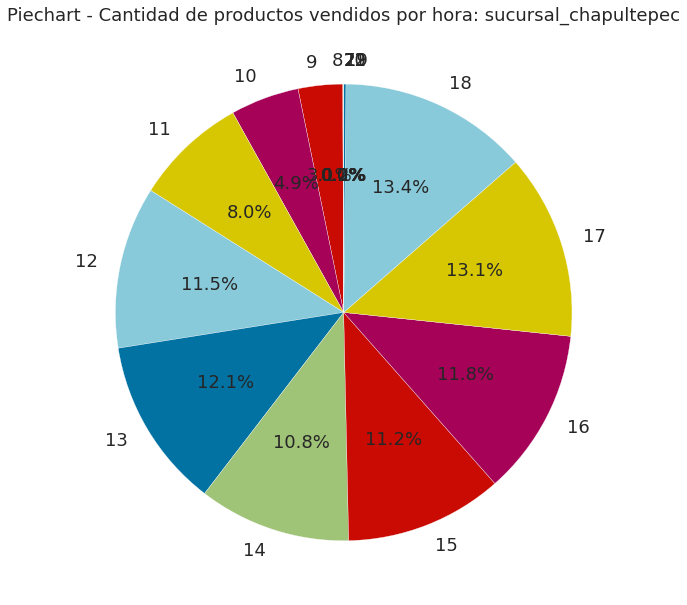

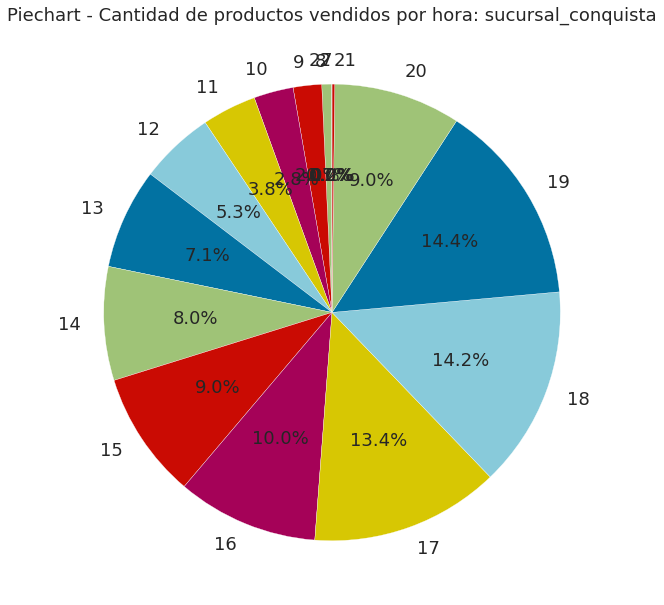

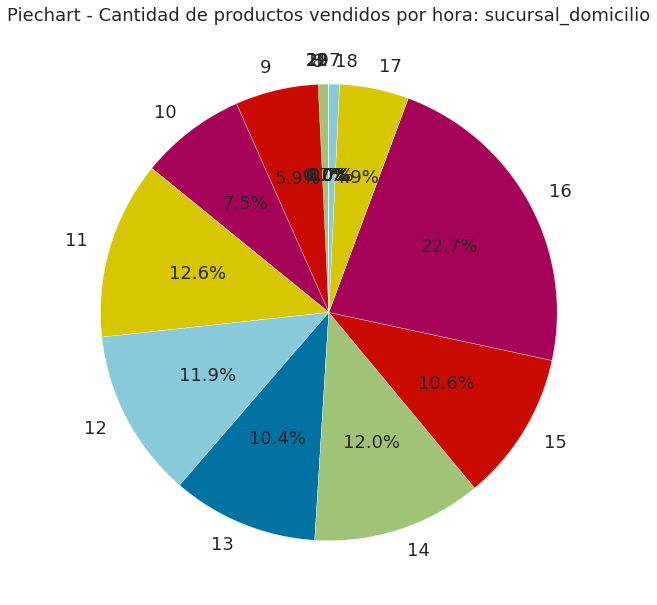

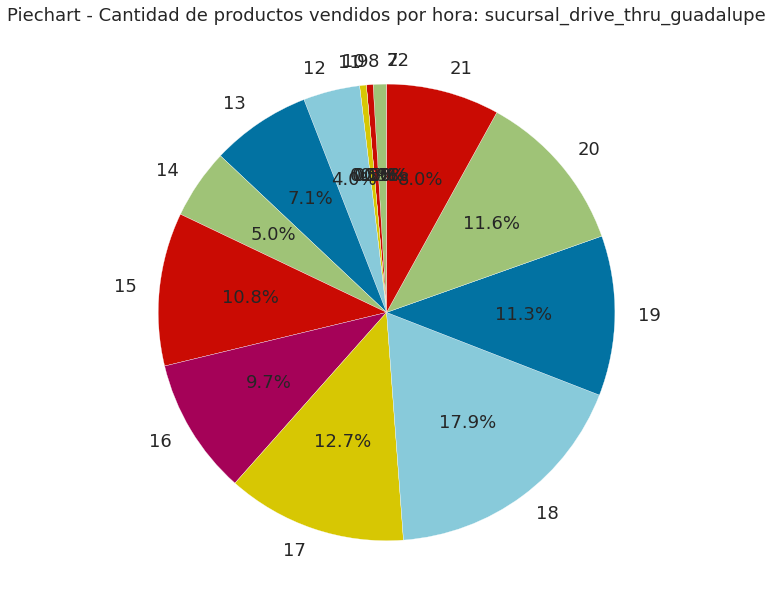

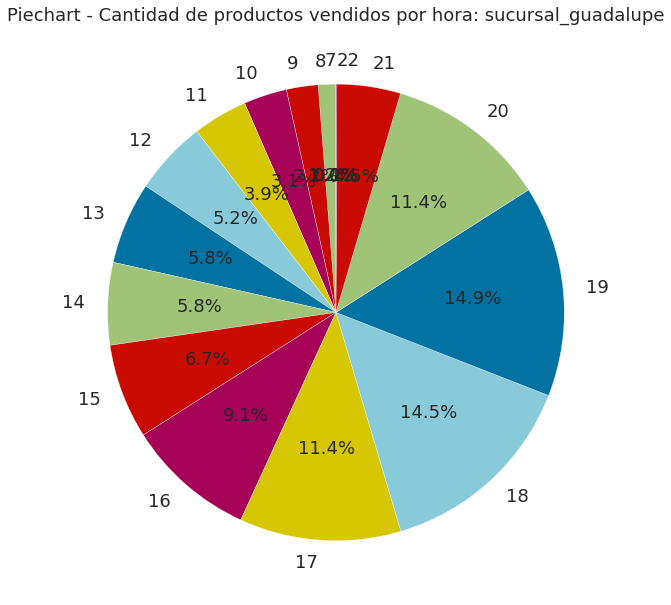

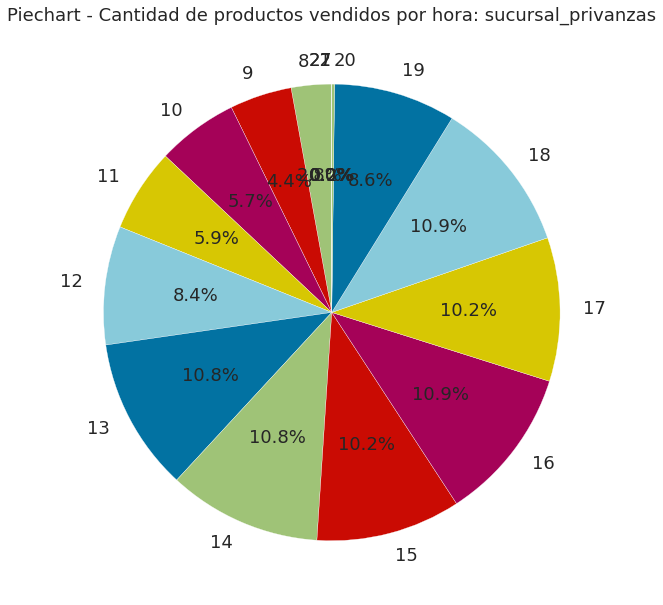

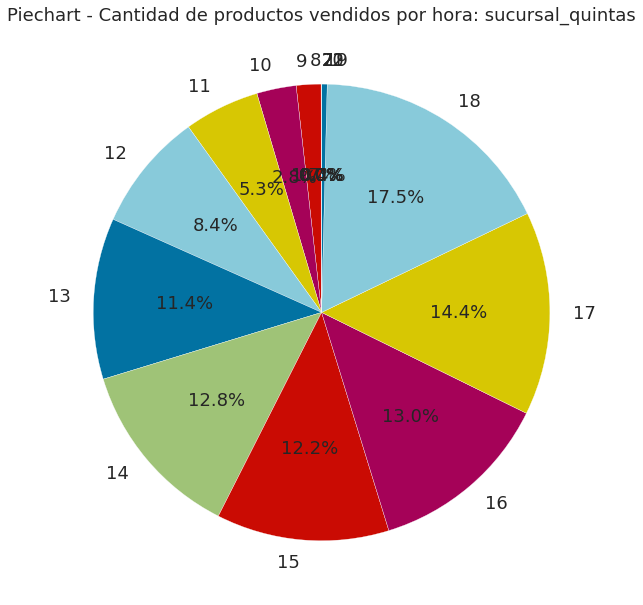

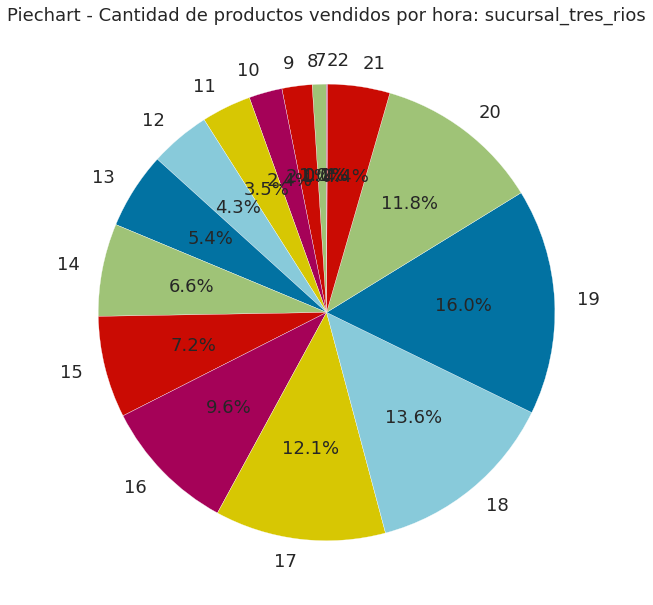

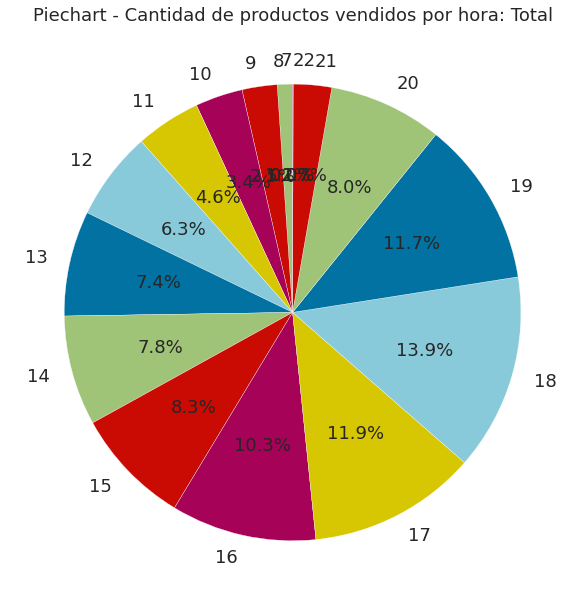

In [ ]:
for variable in productos_vendidos_por_hora_por_sucursal.columns:
    grafica_pie_analisis (productos_vendidos_por_hora_por_sucursal, variable, 'Piechart - Cantidad de productos vendidos por hora:')

#### 8.4.2.2 Distribución de cantidad de productos vendidos por hora del día por tipo de servicio

##### Creamos el dataset

In [ ]:
#Filtramos las columnas de los productos vendidos por día de cada sucursal
productos_vendidos_por_hora_por_tipodeservicio = data_por_hora_suma[['para_comer_aqui', 'para_entregar', 'para_llevar', 'para_recoger']]

#Agregamos el total por hora
productos_vendidos_por_hora_por_tipodeservicio = productos_vendidos_por_hora_por_tipodeservicio.T
productos_vendidos_por_hora_por_tipodeservicio.loc['Total'] = productos_vendidos_por_hora_por_tipodeservicio.sum()
productos_vendidos_por_hora_por_tipodeservicio = productos_vendidos_por_hora_por_tipodeservicio.T

#Mostramos el el dataset
productos_vendidos_por_hora_por_tipodeservicio

,para_comer_aqui,para_entregar,para_llevar,para_recoger,Total
hora,,,,,
7,15.0,0.0,5.0,0.0,20.0
8,1265.0,20.0,126.0,0.0,1411.0
9,2276.0,150.0,879.0,0.0,3305.0
10,2956.0,193.0,1319.0,0.0,4468.0
11,3686.0,322.0,2134.0,0.0,6142.0
12,4953.0,304.0,3097.0,3.0,8357.0
13,5829.0,264.0,3816.0,0.0,9909.0
14,6062.0,307.0,3987.0,0.0,10356.0
15,6660.0,272.0,4131.0,3.0,11066.0


##### Usamos la función para generar gráficas de pie para análisis

In [ ]:
#Función: grafica_pie_analisis

##### Aplicamos la función para la gráfica de pie para análisis por hora del día por tipo de servicio

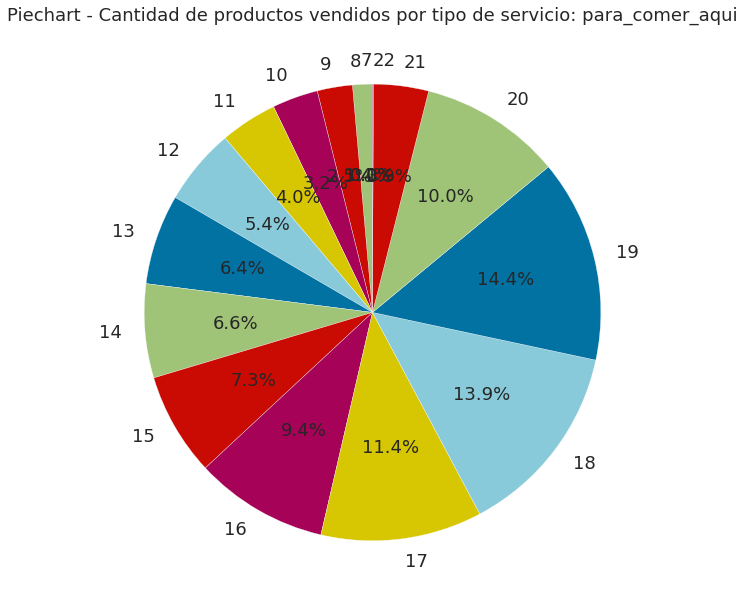

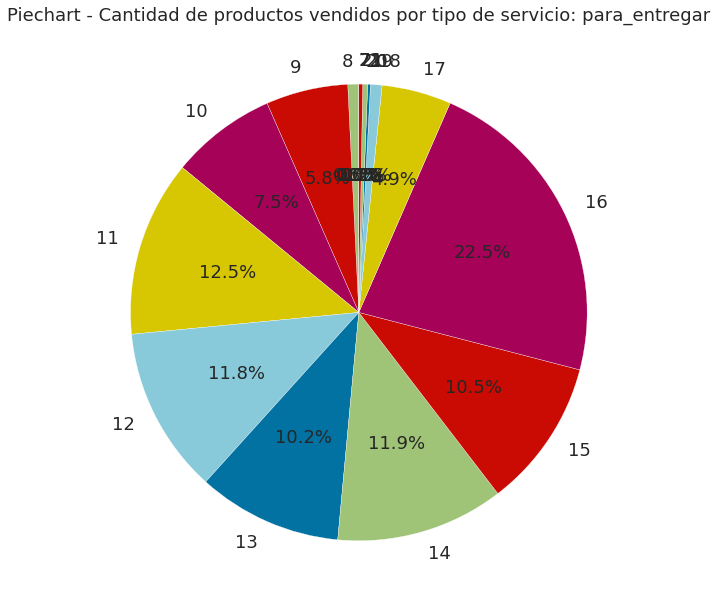

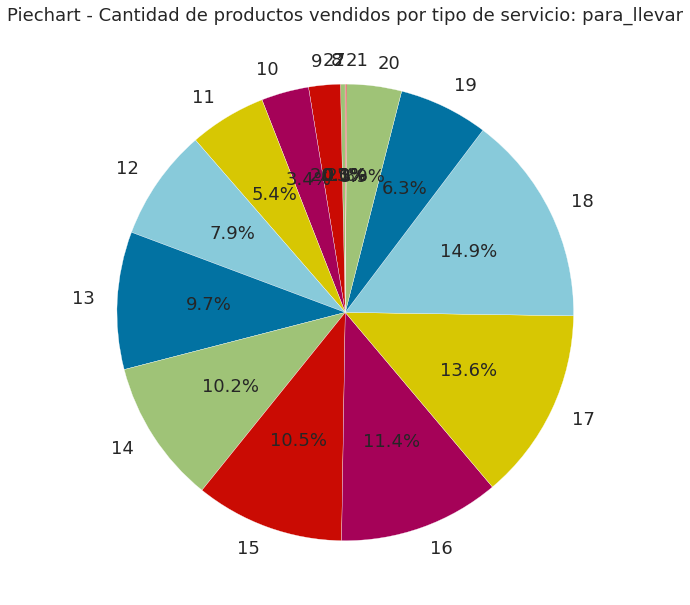

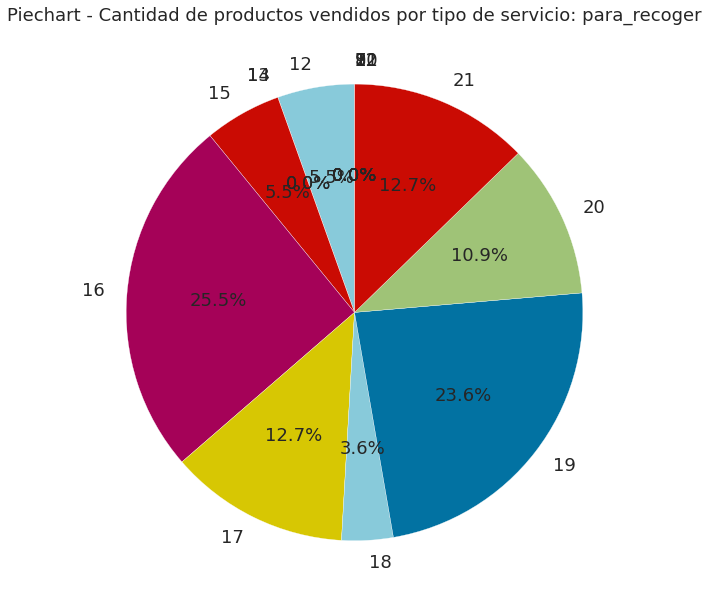

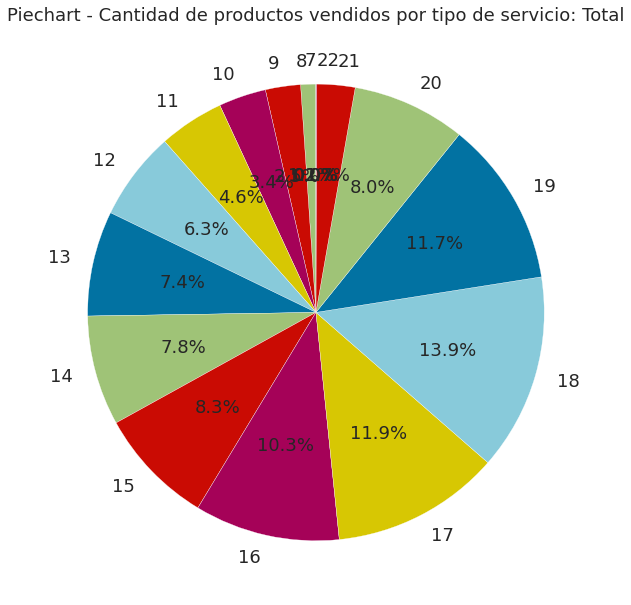

In [ ]:
for variable in productos_vendidos_por_hora_por_tipodeservicio.columns:
    grafica_pie_analisis (productos_vendidos_por_hora_por_tipodeservicio, variable, 'Piechart - Cantidad de productos vendidos por tipo de servicio:')

## 8.5 Análisis de devoluciones, cancelaciones y duplicados

In [ ]:
data_devoluciones.head()

,fecha,hora,zona_horaria,categoria,item,cantidad,price_point,sku,modificatorios_aplicados,ventas_brutas,descuentos,ventas_netas,impuestos,id_transaccion,id_pago,aparato_cobro,notas,detalles,tipo_evento,sucursal,tipo_servicio,unidad,cuenta
7,07/31/21,21:35:47,Mazatlan,Bebidas,Frapuccino Regular,-1.0,NaN,88.0,NaN,$-65.00,$0.00,$-65.00,$0.00,mvrWgmLZGuiWN9hmXiaI7G3eV,bL5dUcuSXsELC1juFgkcmqTJuaB,iPad de Daniel (2),Cobro accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
8,07/31/21,21:35:47,Mazatlan,Mini Postres,Mini Suspiro de Fresa,-1.0,NaN,29.0,NaN,$-40.00,$0.00,$-40.00,$0.00,mvrWgmLZGuiWN9hmXiaI7G3eV,bL5dUcuSXsELC1juFgkcmqTJuaB,iPad de Daniel (2),Cobro accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
338,07/31/21,17:03:00,Mazatlan,Pasteles,Suspiro de Fresa Chico,-1.0,NaN,62.0,NaN,$-390.00,$0.00,$-390.00,$0.00,c5nEWMv47rgAxTYgvvep9dteV,bZ6esJxat2jE6m99pT29OfGxvaB,A,Cambio De Pastel,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Tres Rios,Para comer aquí,ea,-1
1850,07/29/21,11:06:00,Mazatlan,Mini Postres,Mini Suspiro de Fresa,-2.0,NaN,29.0,NaN,$-80.00,$0.00,$-80.00,$0.00,sEgGl2EAWpPa4VISXIpZtC3eV,jNA5GvIaurmkd5G5g3rr3gaWvaB,iPad de Daniel,Mercancía devuelta,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-2
1851,07/29/21,11:06:00,Mazatlan,Mini Postres,Mini Suspiro de Platano,-1.0,NaN,30.0,NaN,$-40.00,$0.00,$-40.00,$0.00,sEgGl2EAWpPa4VISXIpZtC3eV,jNA5GvIaurmkd5G5g3rr3gaWvaB,iPad de Daniel,Mercancía devuelta,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1


### 8.5.1 Análisis de devoluciones, cancelaciones y duplicados por sucursal

In [ ]:
#Revisamos en la columna de 'notas' el porque de las devoluciones
data_devoluciones['notas'].isnull().sum()

#Todas las devoluciones tienen alguna nota

0

In [ ]:
#Revisamos  los motivos de las devoluciones registradas
data_devoluciones['notas'].value_counts()

Cobro accidental                                      343
Mercancía devuelta                                    155
Pedido cancelado                                      100
Cargo accidental                                       56
Productos devueltos                                    28
Lo cobre de nuevo pensando quen no lo había hecho       5
SerDom                                                  4
SerDom                                                  3
Era En Tarjeta                                          3
Se fue la luz                                           2
Cambio de método de pago                                2
Cambio el pay por un desnudo ch                         2
Metodo De Pago                                          2
Cambio De Opinion Del Cliente                           2
Error de cobro                                          2
Cambio de forma de pago                                 1
Cobro Mal De Precio Por Promocion                       1
Error de la te

In [ ]:
#Observamos que cerca del 90% de las devoluciones son registradas con 5 conceptos:
# Cobro accidental = 47.12%
# Mercancía devuelta = 21.29%
# Pedido cancelado = 13.74%
# Cargo accidental = 7.69 %
# Productos devueltos = 3.85%

#De los 5 conceptos hay 2 que se repiten por lo que los vamos a agrupar 

# Cambiamos los nombres de los días de la semana a español.
data_devoluciones['notas'] = np.where(data_devoluciones['notas'] == 'Cobro accidental', 'cobro_accidental',
                                   np.where(data_devoluciones['notas'] == 'Mercancía devuelta', 'producto_devuelto',
                                         np.where(data_devoluciones['notas'] == 'Pedido cancelado', 'pedido_cancelado',
                                                  np.where(data_devoluciones['notas'] == 'Cargo accidental', 'cobro_accidental',
                                                           np.where(data_devoluciones['notas'] == 'Productos devueltos', 'producto_devuelto', 'otros')))))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


In [ ]:
#Revisamos nuevamente los motivos de las devoluciones
data_devoluciones['notas'].value_counts(1)

cobro_accidental     0.548077
producto_devuelto    0.251374
pedido_cancelado     0.137363
otros                0.063187
Name: notas, dtype: float64

In [ ]:
#Revisamos los cobros accidentales:
cobros_accidentales = data_devoluciones[data_devoluciones['notas'] == 'cobro_accidental']
cobros_accidentales.head()

,fecha,hora,zona_horaria,categoria,item,cantidad,price_point,sku,modificatorios_aplicados,ventas_brutas,descuentos,ventas_netas,impuestos,id_transaccion,id_pago,aparato_cobro,notas,detalles,tipo_evento,sucursal,tipo_servicio,unidad,cuenta
7,07/31/21,21:35:47,Mazatlan,Bebidas,Frapuccino Regular,-1.0,NaN,88.0,NaN,$-65.00,$0.00,$-65.00,$0.00,mvrWgmLZGuiWN9hmXiaI7G3eV,bL5dUcuSXsELC1juFgkcmqTJuaB,iPad de Daniel (2),cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
8,07/31/21,21:35:47,Mazatlan,Mini Postres,Mini Suspiro de Fresa,-1.0,NaN,29.0,NaN,$-40.00,$0.00,$-40.00,$0.00,mvrWgmLZGuiWN9hmXiaI7G3eV,bL5dUcuSXsELC1juFgkcmqTJuaB,iPad de Daniel (2),cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
2770,07/27/21,18:28:28,Mazatlan,Rebanada,Rebanada Cheesecake Nuevo,-1.0,Normal,NaN,NaN,$-85.00,$0.00,$-85.00,$0.00,epUtVi441Cjx1mtgi4IwOxweV,T1MJbEAu49RHPREkoPWt7XCluaB,iPad de Daniel,cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
3059,07/27/21,15:35:33,Mazatlan,Bebidas,Iced Chai,-1.0,NaN,108.0,NaN,$-65.00,$0.00,$-65.00,$0.00,EQEKwFy7HRYptbFid6Ik551eV,1ioWiy74P4av7M020uVlgR13vaB,iPad de Daniel,cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
3060,07/27/21,15:35:33,Mazatlan,Bebidas,Leche de Almendra,-1.0,Sin variación,NaN,NaN,$-10.00,$0.00,$-10.00,$0.00,EQEKwFy7HRYptbFid6Ik551eV,1ioWiy74P4av7M020uVlgR13vaB,iPad de Daniel,cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1


In [ ]:
#Cobros accidentales por sucursal y por fecha:
cobros_accidentales_sucursal_fecha = cobros_accidentales.groupby(['sucursal', 'fecha'])['cantidad'].count()
cobros_accidentales_sucursal_fecha = pd.DataFrame(cobros_accidentales_sucursal_fecha)
cobros_accidentales_sucursal_fecha

cantidad
sucursal                      fecha             
LAMARQUE Chapultepec          03/14/21         2
                              04/14/21         1
                              04/18/21         3
                              05/09/21         2
                              07/15/21         1
LAMARQUE Conquista            01/23/21         1
                              01/28/21         5
                              02/07/21         1
                              02/24/21         1
                              03/26/21         5
                              04/04/21         2
                              04/08/21         4
                              05/01/21         2
                              05/10/21         1
                              06/02/21         1
                              06/06/21         2
                              07/13/21         1
LAMARQUE Domicilio            04/20/21         1
                              04/22/21         1
                              05/11/21         3
                              05/17/21         2
                              05/18/21         2
                              05/26/21         2
                              06/08/21         2
                              07/03/21         1
                              07/05/21         2
LAMARQUE Drive Thru Guadalupe 01/02/21         2
LAMARQUE Guadalupe            01/04/21         2
                              01/07/21         4
                              01/11/21         1
                              01/12/21         2
                              01/13/21         6
                              01/15/21         1
                              01/16/21         1
                              01/20/21         1
                              01/23/21         2
                              01/27/21         1
                              01/28/21         1
                              02/01/21         1
                              02/04/21         4
                              02/05/21         1
                              02/11/21         1
                              02/12/21         3
                              02/14/21         1
                              02/16/21         1
                              02/18/21         1
                              02/20/21         1
                              02/23/21         1
                              03/02/21         1
                              03/06/21         3
                              03/14/21         2
                              03/15/21         1
                              03/16/21         1
                              03/21/21         1
                              03/30/21         1
                              04/01/21         1
                              04/09/21         2
                              04/10/21         4
                              04/13/21         5
                              04/14/21         4
                              04/15/21         1
                              04/16/21         1
                              04/20/21         1
                              04/21/21         1
                              04/23/21         2
                              04/26/21         1
                              04/27/21         1
                              04/28/21         5
                              04/29/21         1
                              04/30/21         1
                              05/01/21         3
                              05/02/21         1
                              05/03/21         1
                              05/04/21         2
                              05/05/21         7
                              05/06/21         2
                              05/09/21         1
                              05/10/21        11
                              05/11/21         7
                              05/13/21         1
                      

In [ ]:
#Se observa que los cobros accidentales fueron realizados en diferentes sucursales y en muy pocas ocasiones.

#Revisamos los cobros accidentales por sucursal y fecha donde hubo varios eventos en la misma fecha
cobros_accidentales[(cobros_accidentales['sucursal'] == 'LAMARQUE Guadalupe') & (cobros_accidentales['fecha'] == '05/10/21')]

,fecha,hora,zona_horaria,categoria,item,cantidad,price_point,sku,modificatorios_aplicados,ventas_brutas,descuentos,ventas_netas,impuestos,id_transaccion,id_pago,aparato_cobro,notas,detalles,tipo_evento,sucursal,tipo_servicio,unidad,cuenta
46437,05/10/21,19:31:44,Mazatlan,Mini Postres,Mini Suspiro de Fresa,-1.0,NaN,29.0,NaN,$-40.00,$0.00,$-40.00,$0.00,GNIHPu5bAO8QH12QobwaYn2eV,t8nyKJzC4QpwNjVh1221758lvaB,iPad de Daniel (2),cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
46438,05/10/21,19:31:44,Mazatlan,Mini Postres,Mini Pay de Platano,-1.0,NaN,28.0,NaN,$-40.00,$0.00,$-40.00,$0.00,GNIHPu5bAO8QH12QobwaYn2eV,t8nyKJzC4QpwNjVh1221758lvaB,iPad de Daniel (2),cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
46439,05/10/21,19:31:44,Mazatlan,Mini Postres,Mini Pay de Piña Colada,-1.0,NaN,27.0,NaN,$-40.00,$0.00,$-40.00,$0.00,GNIHPu5bAO8QH12QobwaYn2eV,t8nyKJzC4QpwNjVh1221758lvaB,iPad de Daniel (2),cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
46462,05/10/21,19:07:41,Mazatlan,Bebidas,Latte Chai Grande,-1.0,NaN,NaN,NaN,$-65.00,$0.00,$-65.00,$0.00,2Jmn27rlvefEr0jkkegBPa6eV,tyWOlwUlpqbSbyEaEeWtTTlyuaB,iPad de Daniel (2),cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
46463,05/10/21,19:07:41,Mazatlan,Bebidas,Latte Chai Mediano,-1.0,NaN,NaN,NaN,$-60.00,$0.00,$-60.00,$0.00,2Jmn27rlvefEr0jkkegBPa6eV,tyWOlwUlpqbSbyEaEeWtTTlyuaB,iPad de Daniel (2),cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
46464,05/10/21,19:07:41,Mazatlan,Copitas,Copita Red Velvet,-1.0,Normal,NaN,NaN,$-85.00,$0.00,$-85.00,$0.00,2Jmn27rlvefEr0jkkegBPa6eV,tyWOlwUlpqbSbyEaEeWtTTlyuaB,iPad de Daniel (2),cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
46465,05/10/21,19:07:41,Mazatlan,Galletas,Caja de Galletas de Avena Chica Az. Coco,-2.0,NaN,NaN,NaN,$-270.00,$0.00,$-270.00,$0.00,2Jmn27rlvefEr0jkkegBPa6eV,tyWOlwUlpqbSbyEaEeWtTTlyuaB,iPad de Daniel (2),cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-2
46503,05/10/21,18:45:31,Mazatlan,Mini Postres,Mini Pay de Piña Colada,-1.0,NaN,27.0,NaN,$-40.00,$0.00,$-40.00,$0.00,yH4EayWf8KaeMlxWKULNsqleV,dwZetW11HN9JuUszN9zmWaRdvaB,iPad de Daniel (2),cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
46504,05/10/21,18:45:31,Mazatlan,Mini Postres,Mini Toffee White,-1.0,Normal,NaN,NaN,$-40.00,$0.00,$-40.00,$0.00,yH4EayWf8KaeMlxWKULNsqleV,dwZetW11HN9JuUszN9zmWaRdvaB,iPad de Daniel (2),cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1
46508,05/10/21,18:44:03,Mazatlan,Pasteles,Suspiro de Fresa Chico,-1.0,NaN,62.0,NaN,$-390.00,$0.00,$-390.00,$0.00,wO6LOijDNCu97talvjckgB2eV,brTQnUXWoL1heloQ1QcM8OWpuaB,iPad de Daniel,cobro_accidental,https://squareup.com/dashboard/sales/transacti...,Refund,LAMARQUE Guadalupe,Para comer aquí,ea,-1


In [ ]:
#Cantidad de productos devueltos registrados
data_devoluciones.groupby(['sucursal']).sum()

,cantidad,sku,modificatorios_aplicados,cuenta
sucursal,,,,
LAMARQUE Chapultepec,-30.0,700.0,0.0,-30
LAMARQUE Conquista,-89.0,2218.0,0.0,-89
LAMARQUE Domicilio,-24.0,674.0,0.0,-24
LAMARQUE Drive Thru Guadalupe,-3.0,72.0,0.0,-3
LAMARQUE Guadalupe,-410.0,10688.0,0.0,-410
LAMARQUE Privanzas,-51.0,1208.0,0.0,-51
LAMARQUE Quintas,-60.0,1404.0,0.0,-60
LAMARQUE Tres Rios,-209.0,5213.0,0.0,-209


# 9. Estandarización de variables numéricas.

In [ ]:
#Seeccionamos las columnas del dataset: data_2021 con valores numéricos
columnas_numericas = data_2021.select_dtypes(include = ['int64', 'float64']).columns.tolist()

#Inicializamos el modelo para estandarizar
scaler = StandardScaler()

#Entrenamos el modelo con el dataset: data_2021
scaler.fit(data_2021[columnas_numericas])

#Aplicamos la transdormación de los datos del dataset: data_2021
data_2021_estandarizado2 = scaler.transform(data_2021[columnas_numericas])
data_2021_estandarizado2 = pd.DataFrame(data_2021_estandarizado2)
data_2021_estandarizado2.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32
0,-2.402192,-0.710013,-1.122237,0.463028,-0.164407,-0.251194,-0.205849,-0.524871,-0.116827,-0.599184,-0.197087,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,-0.042483,-0.621936,-0.236572,-0.23639,0.687878,-0.276061,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,0.610165,-0.327457
1,-2.402192,-0.083906,-0.542735,1.423345,-0.164407,-0.251194,-0.205849,-0.524871,-0.116827,-0.599184,-0.197087,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,-0.042483,-0.621936,-0.236572,-0.23639,1.707894,0.319707,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,1.569990,-0.327457
2,-2.402192,1.168306,-0.349568,-0.497288,-0.164407,-0.251194,-0.205849,2.077503,-0.116827,-0.599184,-0.197087,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,24.953429,-0.621936,-0.236572,-0.23639,-0.332139,1.511241,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,3.489640,-0.327457
3,-2.087762,-0.083906,2.547942,-0.497288,-0.164407,-0.251194,-0.205849,-0.524871,-0.116827,1.510527,4.892653,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,12.455473,-0.621936,-0.236572,-0.23639,-0.332139,0.319707,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,1.569990,-0.327457
4,-2.087762,-0.710013,-1.090043,0.463028,-0.164407,-0.251194,-0.205849,-0.524871,-0.116827,-0.599184,-0.197087,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,-0.042483,-0.621936,-0.236572,-0.23639,0.687878,-0.276061,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,0.610165,-0.327457


In [ ]:
#Creamos la función para la estandarización de los valores numéricos:
def estandarizacion_variables_numericas(dataset):
    dataset_estandar = dataset.copy()
    columnas_numericas = dataset_estandar.select_dtypes(include = ['int64', 'float64']).columns.tolist()
    scaler = StandardScaler()
    scaler.fit(dataset_estandar[columnas_numericas])
    dataset_estandar[columnas_numericas] = scaler.transform(dataset_estandar[columnas_numericas])
    return dataset_estandar

In [ ]:
# Aplicamos la función para la estandarización de los valores numéricos
data_2021_estandarizado = estandarizacion_variables_numericas(data_2021)

# 10. Reducción de dimensionalidad por medio de PCA

In [ ]:
#Seleccionamos las columnas que vamos a utilizar para hacer el PCA

#No seleccionamos las columnas: 'id_transaccion', 'fecha_hora', 'mes', 'dia' porque no son numéricas.
#No seleccionamos la columna: 'ventas_netas' por que los datos de estas columnas se engloban en los datos de la cantidad de productos que se compraron.

data_for_pca = data_2021_estandarizado[['hora', 'cantidad', 'bebidas', 'copitas', 'extras', 'galletas', 'mini_postres', 'pan', 'pasteles', 'pays', 'promos', 'rebanada', 'otros', 'sucursal_chapultepec', 'sucursal_conquista', 'sucursal_domicilio', 'sucursal_drive_thru_guadalupe', 'sucursal_guadalupe', 'sucursal_privanzas', 'sucursal_quintas', 'sucursal_tres_rios', 'para_comer_aqui', 'para_entregar', 'para_llevar', 'para_recoger', 'lunes', 'martes', 'miercoles', 'jueves', 'viernes', 'sabado', 'domingo']]

In [ ]:
#Revisamos el PCA para nuestra información

pca = PCA()
principal_components = pca.fit_transform(data_for_pca)

#Guardamos el número de componentes que crea el modelo en una variable
numero_componentes = len(pca.explained_variance_ratio_)

Text(0, 0.5, 'Varianza acumulada explicada')

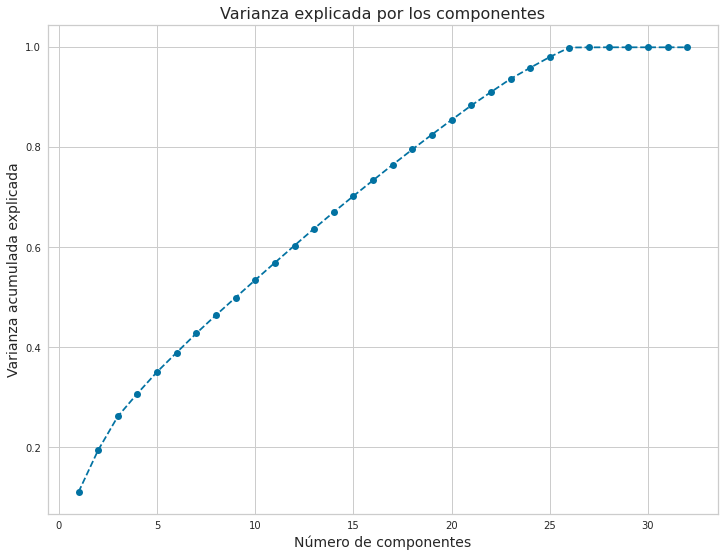

In [ ]:
#Graficamos los componentes para ver cuando sumen el 80%
plt.figure (figsize = (12,9))
plt.plot(range(1,numero_componentes + 1), pca.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')
plt.title ("Varianza explicada por los componentes", fontsize = 16)
plt.xlabel ('Número de componentes', fontsize = 14)
plt.ylabel ('Varianza acumulada explicada', fontsize = 14)

In [ ]:
#Definimos el número de componentes
n_components = 18

#Inicializamos el modelo PCA
pca = PCA(n_components = n_components)

#Corremos el modelo en la base de datos
principalComponents = pca.fit_transform(data_for_pca)

#Creamos un dataset con la información del modelo PCA
data_pca = pd.DataFrame(data = principalComponents, columns = ['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18'])

#Mostramos el dataset
data_pca.head()

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,pc11,pc12,pc13,pc14,pc15,pc16,pc17,pc18
0,-0.841499,-0.715420,-0.095687,-0.366988,0.719982,0.379333,0.321953,0.588437,0.287771,0.220693,0.178867,0.386092,0.213961,-0.058413,-0.324496,0.095028,-0.376603,-0.121958
1,0.307512,-0.767915,0.071765,-0.380108,0.675316,0.945540,0.603612,1.293452,0.459326,0.591492,0.515634,0.723630,0.244287,0.263005,-0.570947,0.376414,-0.789538,-0.343003
2,2.286711,0.630827,0.275595,-2.661807,-0.441307,4.226743,1.824853,10.932945,0.867393,5.103027,-2.030796,0.231915,0.561241,-7.172714,-2.029368,-4.311860,5.567742,11.522452
3,-1.001989,-0.491253,0.169060,-2.236895,0.142920,1.720753,0.731174,5.568838,0.676521,1.908134,-1.581028,0.236715,0.854814,-6.012177,-2.878881,0.323888,1.556223,5.377495
4,-0.807182,-0.743130,-0.126576,-0.319668,0.609452,0.434292,0.321989,0.553605,0.308774,0.253906,0.171608,0.371542,0.201960,-0.030515,-0.308226,0.092245,-0.363590,-0.128311


In [ ]:
#Para revisar que atributos te explica cada uno de los componentes
data_pca_comp = pd.DataFrame (data = pca.components_, columns = data_for_pca.columns.values, index = ['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc17', 'pc18'])

#Mostramos el dataset
data_pca_comp

,hora,cantidad,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo
pc1,0.109141,0.459002,0.316657,0.027666,-0.076750,0.022086,0.311629,0.021084,-0.217971,-0.062687,-0.023530,0.111262,0.005792,-0.070230,0.004228,-0.076887,0.029158,0.367342,0.113561,-0.009178,0.157413,0.480768,-0.076533,-0.038098,0.009303,0.087857,0.125829,0.069734,0.106190,0.116089,0.115174,0.136559
pc2,-0.088127,0.268902,-0.133850,0.030100,0.105275,0.080852,0.357538,0.041875,0.009931,-0.000633,-0.078249,-0.115328,0.064224,0.245706,0.352000,0.055611,-0.008180,-0.179195,0.018131,0.319757,-0.064608,-0.193267,0.055327,0.575431,0.000443,0.066103,0.079824,0.005688,0.058022,0.058761,0.092441,0.079267
pc3,-0.098237,0.110326,0.025683,0.050160,0.290066,-0.004442,0.010465,0.020835,0.087852,0.004321,-0.035213,-0.027340,0.029330,-0.049502,-0.095337,0.643256,-0.000979,0.051010,0.051133,-0.058066,0.008626,0.074495,0.643501,-0.129495,0.001699,0.029520,0.042096,0.029867,0.038690,0.055236,0.021393,-0.027897
pc4,0.150496,0.013247,0.028663,0.009144,-0.088898,-0.013618,0.017073,0.012528,-0.254504,-0.042681,0.615833,-0.152631,0.033216,-0.066168,0.144275,0.069874,-0.066575,-0.105973,-0.033599,-0.023870,0.128841,-0.042967,0.070335,0.054950,-0.009890,-0.085482,-0.060311,0.599446,-0.064867,0.009999,-0.161239,-0.151513
pc5,-0.351524,0.019961,-0.159649,-0.071697,0.049605,0.159572,0.159542,-0.040764,0.137516,0.001818,0.011729,-0.380931,0.078555,0.118968,-0.271957,-0.123364,-0.068983,-0.170526,0.575647,-0.031016,0.081231,0.161064,-0.124008,-0.153290,-0.014501,0.035650,0.149579,0.109408,0.022502,0.021666,-0.086125,-0.186809
pc6,0.174792,-0.026746,-0.217975,0.019081,-0.062355,-0.147041,0.165965,-0.045808,-0.079587,0.005838,0.005687,0.102567,-0.054574,-0.176161,-0.056668,0.048111,0.137025,-0.423617,0.064060,0.089236,0.623884,0.024913,0.047942,-0.078906,0.002535,-0.193911,0.128830,-0.199589,-0.206060,0.001702,0.146969,0.206085
pc7,0.000115,-0.009183,-0.037391,0.205925,-0.143993,0.290912,-0.112355,0.326925,-0.287585,0.050905,-0.003180,0.152560,0.350199,0.425437,-0.232437,0.030969,0.049481,-0.074029,-0.031060,-0.085521,0.105427,-0.014784,0.030467,0.000686,-0.016159,-0.214934,-0.221052,-0.065639,0.161591,0.193547,0.233987,-0.132742
pc8,-0.110779,0.062835,0.097102,0.001135,0.190227,0.092718,-0.071615,-0.140932,0.216331,-0.069570,0.081118,-0.099221,-0.076073,0.174003,-0.103633,-0.050612,0.354674,0.054535,-0.075137,-0.000915,0.018769,0.059087,-0.050112,0.014765,-0.013607,-0.022899,-0.252715,0.266688,-0.309108,-0.314915,0.539764,0.156201
pc1,0.066795,-0.044448,0.074244,0.154267,-0.190180,0.114438,-0.008135,-0.238543,-0.249722,0.133596,-0.087560,-0.047948,0.122261,0.099077,0.152610,0.057928,0.011702,-0.029268,-0.034267,-0.266277,-0.019315,-0.059483,0.056700,-0.000695,0.175976,0.317389,0.429821,-0.099204,-0.310604,-0.230709,0.190895,-0.351858
pc2,0.105630,-0.016271,0.031637,-0.066671,-0.016627,-0.145729,0.021762,0.222365,0.087778,-0.149008,-0.022909,-0.048286,-0.194839,-0.298784,0.281225,-0.012459,0.141729,-0.086149,0.205244,-0.087197,-0.071613,-0.007437,-0.012409,-0.005433,-0.039389,-0.120732,-0.088553,-0.071127,0.292712,0.036069,0.446001,-0.524334


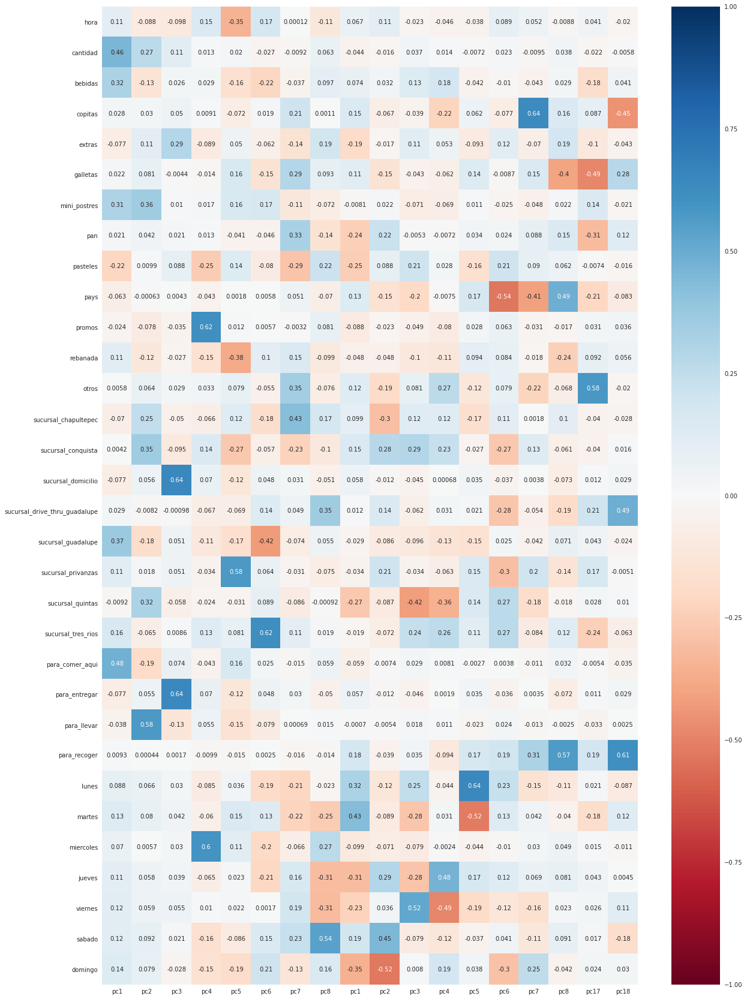

In [ ]:
#Creamos un heatmap para ver los datos visualmente más claro
plt.subplots(figsize = (20,30))
sns.heatmap(data_pca_comp.T, vmin = -1, vmax = 1, cmap = 'RdBu', annot = True)

In [ ]:
#Juntamos los valores del PCA con el dataset estandarizado que teníamos
data_2021_estandarizado_con_pca = pd.concat([data_2021_estandarizado, data_pca.reindex(data_2021.index)], axis = 1)
data_2021_estandarizado_con_pca.head()

,id_transaccion,fecha_hora,mes,dia,hora,cantidad,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,pc11,pc12,pc13,pc14,pc15,pc16,pc17,pc18
0,03QKt0jzPLEwy2rWIRdCuc0eV,2021-01-02 08:39:04,enero,sabado,-2.402192,-0.710013,-1.122237,0.463028,-0.164407,-0.251194,-0.205849,-0.524871,-0.116827,-0.599184,-0.197087,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,-0.042483,-0.621936,-0.236572,-0.23639,0.687878,-0.276061,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,0.610165,-0.327457,-0.841499,-0.715420,-0.095687,-0.366988,0.719982,0.379333,0.321953,0.588437,0.287771,0.220693,0.178867,0.386092,0.213961,-0.058413,-0.324496,0.095028,-0.376603,-0.121958
1,IZQoJ5UHM8WtvQDoiVVwrwAfV,2021-01-02 08:44:56,enero,sabado,-2.402192,-0.083906,-0.542735,1.423345,-0.164407,-0.251194,-0.205849,-0.524871,-0.116827,-0.599184,-0.197087,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,-0.042483,-0.621936,-0.236572,-0.23639,1.707894,0.319707,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,1.569990,-0.327457,0.307512,-0.767915,0.071765,-0.380108,0.675316,0.945540,0.603612,1.293452,0.459326,0.591492,0.515634,0.723630,0.244287,0.263005,-0.570947,0.376414,-0.789538,-0.343003
2,ArjmMG7VBSpiNLbiOC7zo81eV,2021-01-02 08:54:49,enero,sabado,-2.402192,1.168306,-0.349568,-0.497288,-0.164407,-0.251194,-0.205849,2.077503,-0.116827,-0.599184,-0.197087,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,24.953429,-0.621936,-0.236572,-0.23639,-0.332139,1.511241,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,3.489640,-0.327457,2.286711,0.630827,0.275595,-2.661807,-0.441307,4.226743,1.824853,10.932945,0.867393,5.103027,-2.030796,0.231915,0.561241,-7.172714,-2.029368,-4.311860,5.567742,11.522452
3,AVkUaj7IHnbu5tmX4yKO7p7eV,2021-01-02 09:16:38,enero,sabado,-2.087762,-0.083906,2.547942,-0.497288,-0.164407,-0.251194,-0.205849,-0.524871,-0.116827,1.510527,4.892653,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,12.455473,-0.621936,-0.236572,-0.23639,-0.332139,0.319707,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,1.569990,-0.327457,-1.001989,-0.491253,0.169060,-2.236895,0.142920,1.720753,0.731174,5.568838,0.676521,1.908134,-1.581028,0.236715,0.854814,-6.012177,-2.878881,0.323888,1.556223,5.377495
4,Id6AnTSRYvEu4YrezGkRYBieV,2021-01-02 09:23:49,enero,sabado,-2.087762,-0.710013,-1.090043,0.463028,-0.164407,-0.251194,-0.205849,-0.524871,-0.116827,-0.599184,-0.197087,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,-0.042483,-0.621936,-0.236572,-0.23639,0.687878,-0.276061,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,0.610165,-0.327457,-0.807182,-0.743130,-0.126576,-0.319668,0.609452,0.434292,0.321989,0.553605,0.308774,0.253906,0.171608,0.371542,0.201960,-0.030515,-0.308226,0.092245,-0.363590,-0.128311


In [ ]:
#Juntamos los valores del PCA con el dataset que teníamos no estandarizado
data_2021_con_pca = pd.concat([data_2021, data_pca.reindex(data_2021.index)], axis = 1)
data_2021_con_pca.head()

,id_transaccion,fecha_hora,mes,dia,hora,cantidad,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,pc11,pc12,pc13,pc14,pc15,pc16,pc17,pc18
0,03QKt0jzPLEwy2rWIRdCuc0eV,2021-01-02 08:39:04,enero,sabado,8,1.0,40.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.841499,-0.715420,-0.095687,-0.366988,0.719982,0.379333,0.321953,0.588437,0.287771,0.220693,0.178867,0.386092,0.213961,-0.058413,-0.324496,0.095028,-0.376603,-0.121958
1,IZQoJ5UHM8WtvQDoiVVwrwAfV,2021-01-02 08:44:56,enero,sabado,8,2.0,130.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.307512,-0.767915,0.071765,-0.380108,0.675316,0.945540,0.603612,1.293452,0.459326,0.591492,0.515634,0.723630,0.244287,0.263005,-0.570947,0.376414,-0.789538,-0.343003
2,ArjmMG7VBSpiNLbiOC7zo81eV,2021-01-02 08:54:49,enero,sabado,8,4.0,160.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,2.286711,0.630827,0.275595,-2.661807,-0.441307,4.226743,1.824853,10.932945,0.867393,5.103027,-2.030796,0.231915,0.561241,-7.172714,-2.029368,-4.311860,5.567742,11.522452
3,AVkUaj7IHnbu5tmX4yKO7p7eV,2021-01-02 09:16:38,enero,sabado,9,2.0,610.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,-1.001989,-0.491253,0.169060,-2.236895,0.142920,1.720753,0.731174,5.568838,0.676521,1.908134,-1.581028,0.236715,0.854814,-6.012177,-2.878881,0.323888,1.556223,5.377495
4,Id6AnTSRYvEu4YrezGkRYBieV,2021-01-02 09:23:49,enero,sabado,9,1.0,45.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.807182,-0.743130,-0.126576,-0.319668,0.609452,0.434292,0.321989,0.553605,0.308774,0.253906,0.171608,0.371542,0.201960,-0.030515,-0.308226,0.092245,-0.363590,-0.128311


# 11. Revisión del mejor modelo de clusterización

### 11.1 Elbow method

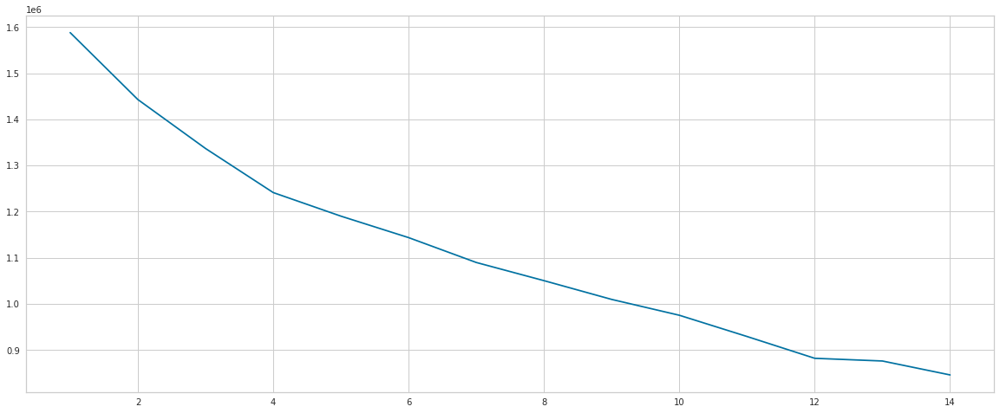

In [ ]:
#Pasamos los datos del PCA a la variable a usar en la revisión del mejor modelo
X = data_pca

sum_of_squared_distances = []
K = range(1, 15)

for k in K:
  km = KMeans (n_clusters = k)
  km = km.fit(X)
  sum_of_squared_distances.append(km.inertia_)

plt.figure(figsize = (20,8))
plt.plot(K, sum_of_squared_distances, 'bx-')
plt.show();

In [ ]:
# A partir de 4 clusters empieza a reducirse la pendiente de la curva, por lo que 4 clusters pareciera ser el mejor modelo.

### 11.2 Distortion: mean sum of squared distances to centers

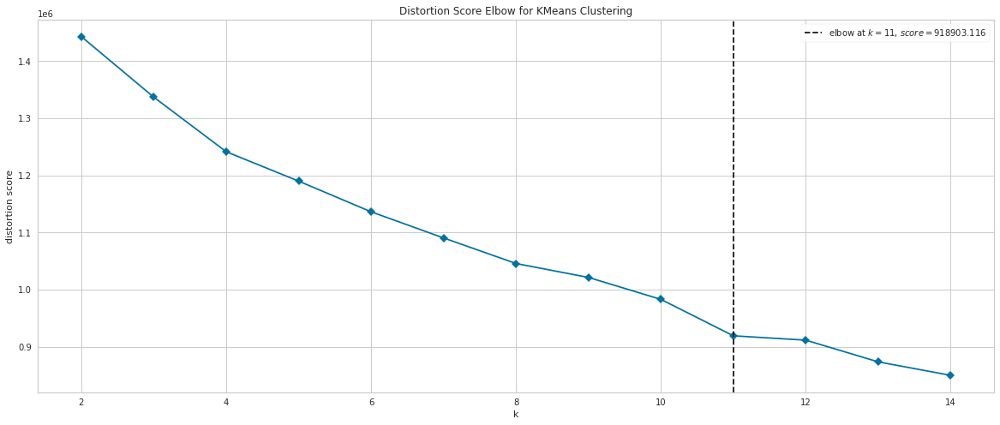

In [ ]:
kmeans = KMeans()
visualizer = KElbowVisualizer(
    kmeans, k = (2, 15), metric = 'distortion', timings = False, locate_elbow = True)

plt.figure(figsize = (20,8))
visualizer.fit(X)
visualizer.poof()

In [ ]:
#El mejor modelo mediante la metrica 'distortion' sería de 8 clusters

### 11.3 Silhouette: mean ratio of intra-cluster and nearest-cluster distance


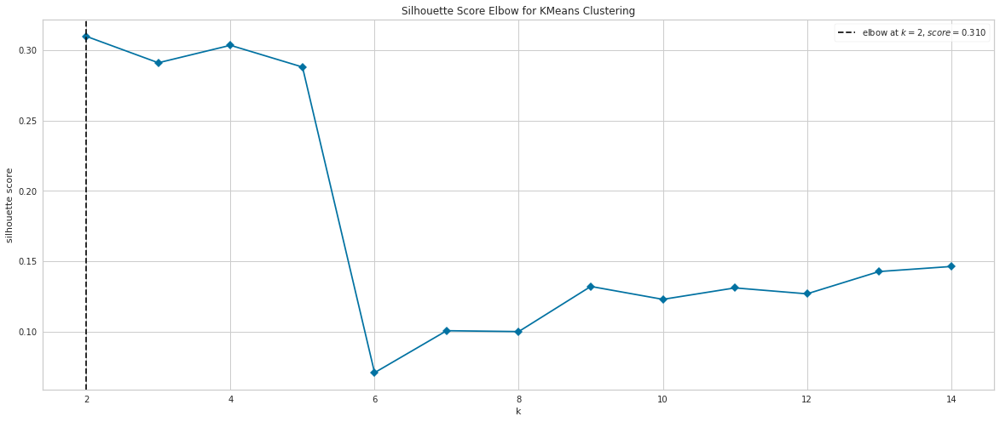

In [ ]:
kmeans = KMeans()
visualizer = KElbowVisualizer(
    kmeans, k = (2, 15), metric = 'silhouette', timings = False, locate_elbow = True)

plt.figure(figsize = (20,8))
visualizer.fit(X)
visualizer.poof()

In [ ]:
#El mejor modelo mediante la metrica 'silhouette' sería de 2 clusters

### 11.4 Calinski_harabaz: ratio of within to between cluster dispersion

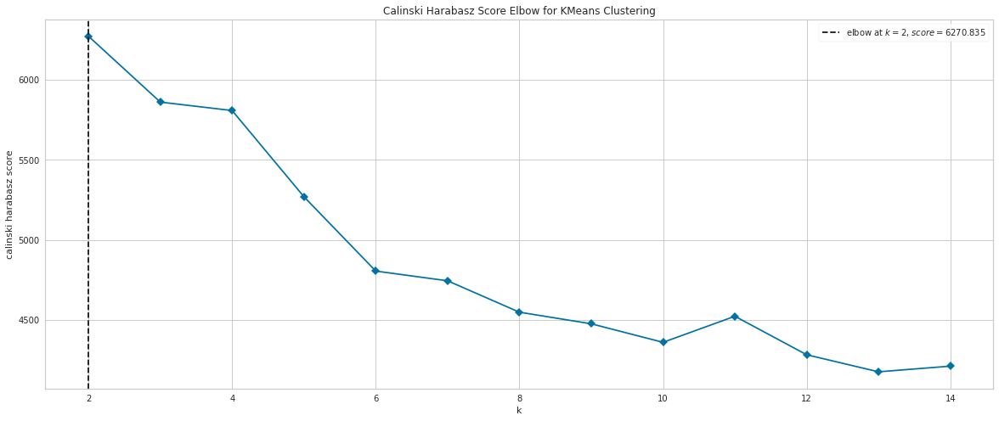

In [ ]:
kmeans = KMeans()
visualizer = KElbowVisualizer(
    kmeans, k = (2, 15), metric = 'calinski_harabasz', timings = False, locate_elbow = True)

plt.figure(figsize = (20,8))
visualizer.fit(X)
visualizer.poof()

In [ ]:
#El mejor modelo mediante la metrica 'calinski_harabaz' sería de 2 clusters

#12. Aplicación de modelos de clusterización

## 12.1 KMEANS número de clusters = 2

### 12.1.1 Aplicación del modelo

In [ ]:
#Creamos el dataset con las columnas numéricas
data_2021_para_kmeans = data_2021_estandarizado[['hora', 'cantidad',
       'ventas_netas', 'bebidas', 'copitas', 'extras', 'galletas',
       'mini_postres', 'pan', 'pasteles', 'pays', 'promos', 'rebanada',
       'otros', 'sucursal_chapultepec', 'sucursal_conquista',
       'sucursal_domicilio', 'sucursal_drive_thru_guadalupe',
       'sucursal_guadalupe', 'sucursal_privanzas', 'sucursal_quintas',
       'sucursal_tres_rios', 'para_comer_aqui', 'para_entregar', 'para_llevar',
       'para_recoger', 'lunes', 'martes', 'miercoles', 'jueves', 'viernes',
       'sabado', 'domingo']]
data_2021_para_kmeans.head()

In [ ]:
#Aplicamos el modelo KMEANS al dataset del kmeans
n_clusters = 2

#Inicializamos el modelo
kmeans = KMeans(n_clusters = n_clusters, random_state = 101)

#Entrenamos el modelo para crear los clusters
data_clusters = kmeans.fit(data_2021_para_kmeans)

#Revisamos las coordenadas de los centros de los clusters
data_clusters.cluster_centers_

array([[ 0.21650122,  1.4653296 ,  0.08706225,  0.91718575,  0.07474548,
        -0.17445197,  0.06259589,  1.01984711,  0.05638367, -0.50081806,
        -0.15641642, -0.10447294,  0.24381212,  0.03443761, -0.20211055,
         0.07595502, -0.10282033,  0.08647139,  1.03257471,  0.38029821,
         0.04388113,  0.52668504,  1.42878577, -0.10228831, -0.01976803,
         0.03025969,  0.28649007,  0.45881586,  0.23546861,  0.33822083,
         0.34302748,  0.37248018,  0.3883232 ],
       [-0.056404  , -0.38175513, -0.0226819 , -0.2389499 , -0.01947307,
         0.04544911, -0.0163078 , -0.26569576, -0.01468936,  0.13047567,
         0.0407504 ,  0.02721782, -0.06351917, -0.00897186,  0.05265487,
        -0.01978819,  0.02678728, -0.02252797, -0.26901162, -0.09907723,
        -0.01143213, -0.13721467, -0.37223454,  0.02664867,  0.00515007,
        -0.00788341, -0.07463785, -0.11953304, -0.06134548, -0.08811501,
        -0.08936727, -0.09704043, -0.10116794]])

In [ ]:
#Con el.labels_ vemos el cluster en que quedó cada registro
data_clusters.labels_

array([1, 1, 0, ..., 1, 1, 0], dtype=int32)

In [ ]:
#Hacemos la predicción de cada registro del dataset con las columnas numéricas estandarizados 'data_2021_para_kmeans'

#Creamos una copia del dataset: 'data_2021_estandarizado' para el modelo con n = 3
data_2021_estandarizado_knn2 = data_2021_estandarizado.copy()

#Agregamos el número de cluster al dataset con toda la información 'data_2021_estandarizado'
data_2021_estandarizado_knn2['Cluster_knn'] = data_clusters.predict(data_2021_para_kmeans)
data_2021_estandarizado_knn2.head()

,id_transaccion,fecha_hora,mes,dia,hora,cantidad,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo,Cluster_knn
0,03QKt0jzPLEwy2rWIRdCuc0eV,2021-01-02 08:39:04,enero,sabado,-2.402192,-0.710013,-1.122237,0.463028,-0.164407,-0.251194,-0.205849,-0.524871,-0.116827,-0.599184,-0.197087,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,-0.042483,-0.621936,-0.236572,-0.23639,0.687878,-0.276061,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,0.610165,-0.327457,1
1,IZQoJ5UHM8WtvQDoiVVwrwAfV,2021-01-02 08:44:56,enero,sabado,-2.402192,-0.083906,-0.542735,1.423345,-0.164407,-0.251194,-0.205849,-0.524871,-0.116827,-0.599184,-0.197087,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,-0.042483,-0.621936,-0.236572,-0.23639,1.707894,0.319707,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,1.569990,-0.327457,1
2,ArjmMG7VBSpiNLbiOC7zo81eV,2021-01-02 08:54:49,enero,sabado,-2.402192,1.168306,-0.349568,-0.497288,-0.164407,-0.251194,-0.205849,2.077503,-0.116827,-0.599184,-0.197087,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,24.953429,-0.621936,-0.236572,-0.23639,-0.332139,1.511241,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,3.489640,-0.327457,0
3,AVkUaj7IHnbu5tmX4yKO7p7eV,2021-01-02 09:16:38,enero,sabado,-2.087762,-0.083906,2.547942,-0.497288,-0.164407,-0.251194,-0.205849,-0.524871,-0.116827,1.510527,4.892653,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,12.455473,-0.621936,-0.236572,-0.23639,-0.332139,0.319707,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,1.569990,-0.327457,1
4,Id6AnTSRYvEu4YrezGkRYBieV,2021-01-02 09:23:49,enero,sabado,-2.087762,-0.710013,-1.090043,0.463028,-0.164407,-0.251194,-0.205849,-0.524871,-0.116827,-0.599184,-0.197087,-0.255981,-0.337173,-0.185665,-0.264624,-0.291501,-0.122333,-0.042483,-0.621936,-0.236572,-0.23639,0.687878,-0.276061,-0.123039,-0.491784,-0.014555,-0.290004,-0.307594,-0.327336,-0.301427,-0.319343,0.610165,-0.327457,1


In [ ]:
#Agregamos el número de cluster al dataset no estandarizado
data_2021_knn2 = data_2021.merge(data_2021_estandarizado_knn2[['id_transaccion', 'Cluster_knn']], how = 'inner', on = 'id_transaccion')
data_2021_knn2.head()

,id_transaccion,fecha_hora,mes,dia,hora,cantidad,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo,Cluster_knn
0,03QKt0jzPLEwy2rWIRdCuc0eV,2021-01-02 08:39:04,enero,sabado,8,1.0,40.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
1,IZQoJ5UHM8WtvQDoiVVwrwAfV,2021-01-02 08:44:56,enero,sabado,8,2.0,130.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1
2,ArjmMG7VBSpiNLbiOC7zo81eV,2021-01-02 08:54:49,enero,sabado,8,4.0,160.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0
3,AVkUaj7IHnbu5tmX4yKO7p7eV,2021-01-02 09:16:38,enero,sabado,9,2.0,610.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1
4,Id6AnTSRYvEu4YrezGkRYBieV,2021-01-02 09:23:49,enero,sabado,9,1.0,45.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1


In [ ]:
#Cambiamos la columna de 'Cluster_knn' para que en lugar de decir 0, diga Cluster_0

#Dataset: data_2021_estandarizado
data_2021_estandarizado_knn2['Cluster_knn'] = data_2021_estandarizado_knn2.Cluster_knn.apply(lambda x: 'Cluster_' + str(x))

#Dataset: data_2021_completo
data_2021_knn2['Cluster_knn'] = data_2021_knn2.Cluster_knn.apply(lambda x: 'Cluster_' + str(x))

In [ ]:
#Generamos la gráfica de los clusters con las variables de las columnas 'hora', 'cantidad', 'ventas_netas'
sns.pairplot(data = data_2021_knn2[['hora', 'cantidad', 'ventas_netas', 'Cluster_knn']], height = 'scatter', hue = 'Cluster_knn', size = 8, palette = 'pastel');

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:1969: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


### 12.1.2 Análisis de la información clusterizada

In [ ]:
#Creamos las variables de 'dias_semana', 'horas_laborales', 'sucursales', tipo_servicio'

#Las usaremos en el análisis

dias_semana = ['lunes', 'martes', 'miercoles', 'jueves', 'viernes', 'sabado', 'domingo']
horas_laborales = [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
sucursales = ['sucursal_chapultepec', 'sucursal_conquista', 'sucursal_domicilio', 'sucursal_drive_thru_guadalupe', 'sucursal_guadalupe', 'sucursal_privanzas', 'sucursal_quintas', 'sucursal_tres_rios']
tipo_servicio = ['para_comer_aqui', 'para_entregar', 'para_llevar', 'para_recoger']

#### 12.1.2.1 Número de transacciones por cluster

##### Creamos el dataset con un groupby de las transacciones de acuerdo a cada cluster

In [ ]:
#Creamos el dataset
transacciones_cluster_total = pd.DataFrame(data_2021_knn2.groupby(['Cluster_knn'])['id_transaccion'].count())

#Renombramos la columna
transacciones_cluster_total.columns = ['transacciones']

#Calculamos el total de transacciones por cluster
transacciones_cluster_total.loc['Total']= transacciones_cluster_total.sum()

#Mostramos el dataset
transacciones_cluster_total

##### Usamos la función para generar gráficas de pie para análisis

In [ ]:
#Función: grafica_pie_analisis

##### Aplicamos la función para generar gráficas de pie para análisis de transacciones realizadas por cluster

In [ ]:
grafica_pie_analisis(transacciones_cluster_total, transacciones_cluster_total.columns[0], 'Distribución por cluster:')

#### 12.1.2.2 Número de transacciones por cluster por día de la semana

##### Creamos el dataset con un crosstab de las transacciones por día de la semana de acuerdo a cada cluster

In [ ]:
#Revisamos con una crosstab en qué día se realizaron las transacciones de acuerdo a cada cluster
transacciones_cluster_dia = pd.crosstab(data_2021_knn2['dia'], data_2021_knn2['Cluster_knn'], data_2021_knn2['id_transaccion'], aggfunc = 'count')

#Ordenamos las filas por día de la semaana
transacciones_cluster_dia = transacciones_cluster_dia.reindex(dias_semana)

#Calculamos el total de transacciones por cluster
transacciones_cluster_dia.loc['Total'] = transacciones_cluster_dia.sum()

#Calculamos el total de transacciones por día
#Pimrero transponemos el dataset
transacciones_cluster_dia = transacciones_cluster_dia.T
#Calculamos el total de transacciones por cluster
transacciones_cluster_dia.loc['Total'] = transacciones_cluster_dia.sum()

#Mostramos el dataset
transacciones_cluster_dia

##### Usamos la función para generar gráficas de pie para análisis

In [ ]:
#Función: grafica_pie_analisis

##### Aplicamos la función para generar gráficas de pie para análisis de transacciones por día de la semana de acuerdo a cada cluster

In [ ]:
for variable in transacciones_cluster_dia.columns:
  grafica_pie_analisis(transacciones_cluster_dia, variable, 'Cantidad de productos vendidos por día:')

##### Aplicamos la función para generar gráficas de pie para análisis de cada cluster de acuerdo a lastransacciones por día de la semana

In [ ]:
for variable in transacciones_cluster_dia.T.columns:
  grafica_pie_analisis(transacciones_cluster_dia.T, variable, 'Cantidad de productos vendidos por día:')

##### Graficamos una lineplot para simplificar la visualización

In [ ]:
sns.set_style("whitegrid")
bar, ax = plt.subplots(figsize = (15, 8))
  
ax = sns.lineplot(data = transacciones_cluster_dia.T[0:7], palette = "Set2", linewidth = 4, markers = True, markersize = 15, dashes = False, legend = False)
  
#ax.set_title(f'{titulo}', fontsize = 22)
ax.set_xlabel ('Día de la semana', fontsize = 18)
ax.set_ylabel ('Número de transacciones', fontsize = 18)


#### 12.1.2.3 Número de transacciones por cluster por hora del día

##### Creamos el dataset con un crosstab de las transacciones por hora del día de acuerdo a cada cluster

In [ ]:
#Revisamos con una crosstab en qué día se realizaron las transacciones de acuerdo a cada cluster
#Para los datos 'NaN' le pedimos que los cambie por 0.
transacciones_cluster_hora = pd.crosstab(data_2021_knn2['hora'], data_2021_knn2['Cluster_knn'], data_2021_knn2['id_transaccion'], aggfunc = 'count').fillna(0)

#Calculamos el total de transacciones por cluster
transacciones_cluster_hora.loc['Total'] = transacciones_cluster_hora.sum()

#Calculamos el total de transacciones por día
#Pimrero transponemos el dataset
transacciones_cluster_hora = transacciones_cluster_hora.T
#Calculamos el total de transacciones por cluster
transacciones_cluster_hora.loc['Total'] = transacciones_cluster_hora.sum()

#Mostramos el dataset
transacciones_cluster_hora

##### Usamos la función para generar gráficas de pie para análisis

In [ ]:
#Función: grafica_pie_analisis

##### Aplicamos la función para generar gráficas de pie para análisis de transacciones por hora del día de acuerdo a cada cluster

In [ ]:
for variable in transacciones_cluster_hora.columns:
  grafica_pie_analisis(transacciones_cluster_hora, variable, 'Cantidad de productos vendidos por hora:')

##### Aplicamos la función para generar gráficas de pie para análisis de cada cluster de acuerdo a las transacciones por hora del día

In [ ]:
for variable in transacciones_cluster_hora.T.columns:
  grafica_pie_analisis(transacciones_cluster_hora.T, variable, 'Cantidad de productos vendidos por hora:')

##### Graficamos una lineplot para simplificar la visualización

In [ ]:
sns.set_style("whitegrid")
bar, ax = plt.subplots(figsize = (15, 8))
  
ax = sns.lineplot(data = transacciones_cluster_hora.T[0:16], palette = "Set2", linewidth = 4, markers = True, markersize = 15, dashes = False, legend = False)
  
#ax.set_title(f'{titulo}', fontsize = 22)
ax.set_xlabel ('Hora del día', fontsize = 18)
ax.set_ylabel ('Número de transacciones', fontsize = 18)


#### 12.1.2.4 Ventas netas por cluster

##### Creamos el dataset con un groupby de las ventas_netas de acuerdo a cada cluster

In [ ]:
#Creamos el dataset
ventas_netas_cluster_total = pd.DataFrame(data_2021_knn2.groupby(['Cluster_knn'])['ventas_netas'].sum())

#Calculamos el total de transacciones por cluster
ventas_netas_cluster_total.loc['Total']= ventas_netas_cluster_total.sum()

#Mostramos el dataset
ventas_netas_cluster_total

##### Usamos la función para generar gráficas de pie para análisis

In [ ]:
#Función: grafica_pie_analisis

##### Aplicamos la función para generar gráficas de pie para análisis de ventas_netas realizadas por cluster

In [ ]:
grafica_pie_analisis(ventas_netas_cluster_total, ventas_netas_cluster_total.columns[0], 'Distribución por cluster:')

#### 12.1.2.5 Ventas netas por cluster por día de la semana

##### Creamos el dataset con un crosstab de las ventas netas por día de la semana de acuerdo a cada cluster

In [ ]:
#Revisamos con una crosstab en qué día se realizaron las transacciones de acuerdo a cada cluster
ventas_netas_cluster_dia = pd.crosstab(data_2021_knn2['dia'], data_2021_knn2['Cluster_knn'], data_2021_knn2['ventas_netas'], aggfunc = 'sum')

#Ordenamos las filas por día de la semaana
ventas_netas_cluster_dia = ventas_netas_cluster_dia.reindex(dias_semana)

#Calculamos el total de transacciones por cluster
ventas_netas_cluster_dia.loc['Total'] = ventas_netas_cluster_dia.sum()

#Calculamos el total de transacciones por día
#Pimrero transponemos el dataset
ventas_netas_cluster_dia = ventas_netas_cluster_dia.T
#Calculamos el total de transacciones por cluster
ventas_netas_cluster_dia.loc['Total'] = ventas_netas_cluster_dia.sum()

#Mostramos el dataset
ventas_netas_cluster_dia

##### Usamos la función para generar gráficas de pie para análisis

In [ ]:
#Función: grafica_pie_analisis

##### Aplicamos la función para generar gráficas de pie para análisis de ventas netas por día de la semana de acuerdo a cada cluster

In [ ]:
for variable in ventas_netas_cluster_dia.columns:
  grafica_pie_analisis(ventas_netas_cluster_dia, variable, 'Ventas netas por día:')

##### Aplicamos la función para generar gráficas de pie para análisis de acuerdo a cada cluster de ventas netas por día de la semana 

In [ ]:
for variable in ventas_netas_cluster_dia.T.columns:
  grafica_pie_analisis(ventas_netas_cluster_dia.T, variable, 'Ventas netas por día:')

##### Graficamos una lineplot para simplificar la visualización


In [ ]:
sns.set_style("whitegrid")
bar, ax = plt.subplots(figsize = (15, 8))
  
ax = sns.lineplot(data = ventas_netas_cluster_dia.T[0:7], palette = "Set2", linewidth = 4, markers = True, markersize = 15, dashes = False, legend = False)
  
#ax.set_title(f'{titulo}', fontsize = 22)
ax.set_xlabel ('Día de la semana', fontsize = 18)
ax.set_ylabel ('Ventas netas', fontsize = 18)

#### 12.1.2.6 Ventas netas por cluster por hora del día

##### Creamos el dataset con un crosstab de las ventas netas por hora del día de acuerdo a cada cluster

In [ ]:
#Revisamos con una crosstab en qué día se realizaron las transacciones de acuerdo a cada cluster
#Para los datos 'NaN' le pedimos que los cambie por 0.
ventas_netas_cluster_hora = pd.crosstab(data_2021_knn2['hora'], data_2021_knn2['Cluster_knn'], data_2021_knn2['ventas_netas'], aggfunc = 'sum').fillna(0)

#Calculamos el total de transacciones por cluster
ventas_netas_cluster_hora.loc['Total'] = ventas_netas_cluster_hora.sum()

#Calculamos el total de transacciones por día
#Pimrero transponemos el dataset
ventas_netas_cluster_hora = ventas_netas_cluster_hora.T
#Calculamos el total de transacciones por cluster
ventas_netas_cluster_hora.loc['Total'] = ventas_netas_cluster_hora.sum()

#Mostramos el dataset
ventas_netas_cluster_hora

##### Usamos la función para generar gráficas de pie para análisis

In [ ]:
#Función: grafica_pie_analisis

##### Aplicamos la función para generar gráficas de pie para análisis de ventas netas por hora del día de acuerdo a cada cluster

In [ ]:
for variable in ventas_netas_cluster_hora.columns:
  grafica_pie_analisis(ventas_netas_cluster_hora, variable, 'Ventas netas por hora:')

##### Aplicamos la función para generar gráficas de pie para análisis de a cuerdo a cada cluster de las ventas netas por hora del día

In [ ]:
for variable in ventas_netas_cluster_hora.T.columns:
  grafica_pie_analisis(ventas_netas_cluster_hora.T, variable, 'Ventas netas por hora:')

##### Graficamos una lineplot para simplificar la visualización

In [ ]:
sns.set_style("whitegrid")
bar, ax = plt.subplots(figsize = (15, 8))
  
ax = sns.lineplot(data = ventas_netas_cluster_hora.T[0:16], palette = "Set2", linewidth = 4, markers = True, markersize = 15, dashes = False, legend = False)
  
#ax.set_title(f'{titulo}', fontsize = 22)
ax.set_xlabel ('Hora del día', fontsize = 18)
ax.set_ylabel ('Ventas netas', fontsize = 18)

#### 12.1.2.7 Cantidad de productos promedio comprados por transacción por día por cluster

##### Creamos el dataset con un crosstab de la cantidad de productos por transacción por día de acuerdo a cada cluster

In [ ]:
#Creamos el crosstab
promedio_productos_por_transaccion_por_dia_por_cluster = pd.crosstab(data_2021_knn2['Cluster_knn'], data_2021_knn2['dia'], data_2021_knn2['cantidad'], aggfunc = 'mean')

#Transponemos la tabla
promedio_productos_por_transaccion_por_dia_por_cluster = promedio_productos_por_transaccion_por_dia_por_cluster.T

#Ordenamos las filas por día de la semaana
promedio_productos_por_transaccion_por_dia_por_cluster = promedio_productos_por_transaccion_por_dia_por_cluster.reindex(dias_semana)

#Mostramos el dataset
promedio_productos_por_transaccion_por_dia_por_cluster

##### Generamos la gráfica de barras para análisis del promedio de productos comprados por transacción por día por cluster

In [ ]:
promedio_productos_por_transaccion_por_dia_por_cluster.plot(kind = 'bar', figsize = (20,10), cmap = 'Accent')

#Nombramos la gráfica y los ejes de la gráfica
plt.title('Cantidad de productos promedio por transacción por día de la semana por cluster', fontsize = 20)
plt.xlabel('Día de la semana', fontsize = 16)
plt.ylabel('Productos promedio por transacción', fontsize = 16)
  
#Fijamos la leyenda de las categorías en la esquinsa superior derecha
plt.legend(loc = 'upper right');

#### 12.1.2.8 Cantidad de productos promedio comprados por transacción por hora del día por cluster

##### Creamos el dataset con un crosstab de la cantidad de productos por transacción por hora del día de acuerdo a cada cluster

In [ ]:
#Creamos el crosstab
#Los valores 'NaN' los llenamos con 0
promedio_productos_por_transaccion_por_hora_por_cluster = pd.crosstab(data_2021_knn2['Cluster_knn'], data_2021_knn2['hora'], data_2021_knn2['cantidad'], aggfunc = 'mean').fillna(0)

#Transponemos la tabla
promedio_productos_por_transaccion_por_hora_por_cluster = promedio_productos_por_transaccion_por_hora_por_cluster.T

#Mostramos el dataset
promedio_productos_por_transaccion_por_hora_por_cluster

##### Generamos la gráfica de barras para análisis del promedio de productos comprados por transacción por hora por cluster

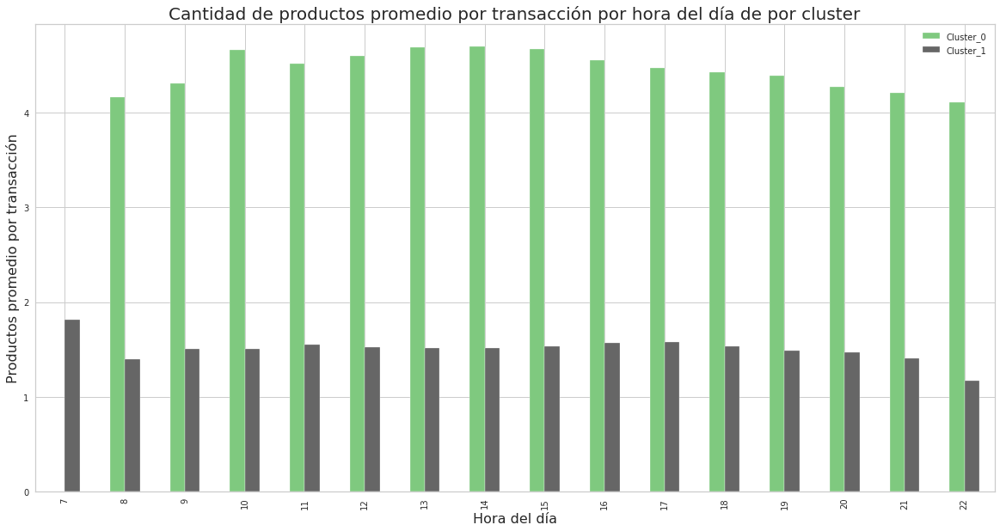

In [ ]:
promedio_productos_por_transaccion_por_hora_por_cluster.plot(kind = 'bar', figsize = (20,10), cmap = 'Accent')

#Nombramos la gráfica y los ejes de la gráfica
plt.title('Cantidad de productos promedio por transacción por hora del día de por cluster', fontsize = 20)
plt.xlabel('Hora del día', fontsize = 16)
plt.ylabel('Productos promedio por transacción', fontsize = 16)
  
#Fijamos la leyenda de las categorías en la esquinsa superior derecha
plt.legend(loc = 'upper right');

#### 12.1.2.9 Distribución de clusters por sucursal

##### Creamos el dataset

In [ ]:
#Pegamos el dataset con el número de cluster 'data_2021_con_pca' al dataset 'data' que tiene los registros antes de las agrupaciones
data_completa_knn2 = data.merge(data_2021_knn2[['id_transaccion', 'Cluster_knn']], how = 'inner', on = 'id_transaccion')
data_completa_knn2.head()

,id_transaccion,fecha_hora,mes,dia,hora,categoria,item,sucursal,tipo_servicio,cantidad,ventas_brutas,descuentos,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo,Cluster_knn
0,gsHaNtHqx9Td8zk3oci5L5reV,2021-07-31 21:54:52,julio,sabado,21,mini_postres,Mini Triple Chocolate,LAMARQUE Guadalupe,Para comer aquí,1.0,40.0,0.0,40.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Cluster_0
1,gsHaNtHqx9Td8zk3oci5L5reV,2021-07-31 21:54:52,julio,sabado,21,mini_postres,Mini Better Than Sex,LAMARQUE Guadalupe,Para comer aquí,1.0,40.0,0.0,40.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Cluster_0
2,gsHaNtHqx9Td8zk3oci5L5reV,2021-07-31 21:54:52,julio,sabado,21,copitas,Copita Glorias,LAMARQUE Guadalupe,Para comer aquí,1.0,85.0,0.0,85.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Cluster_0
3,KnQVfQokevimU7h1OCvnEaheV,2021-07-31 21:42:13,julio,sabado,21,rebanada,R. Desnudo de Chocolate,LAMARQUE Guadalupe,Para comer aquí,1.0,85.0,0.0,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Cluster_1
4,KnQVfQokevimU7h1OCvnEaheV,2021-07-31 21:42:13,julio,sabado,21,rebanada,R. Suspiro de Fresa,LAMARQUE Guadalupe,Para comer aquí,1.0,85.0,0.0,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Cluster_1


In [ ]:
#Cluster 0
cluster0_por_sucursal = data_completa_knn2[data_completa_knn2['Cluster_knn'] == 'Cluster_0'].sucursal.value_counts(1)
cluster0_por_sucursal

LAMARQUE Guadalupe               0.579312
LAMARQUE Tres Rios               0.193492
LAMARQUE Privanzas               0.105658
LAMARQUE Conquista               0.069806
LAMARQUE Quintas                 0.040147
LAMARQUE Chapultepec             0.006535
LAMARQUE Drive Thru Guadalupe    0.004387
LAMARQUE Domicilio               0.000663
Name: sucursal, dtype: float64

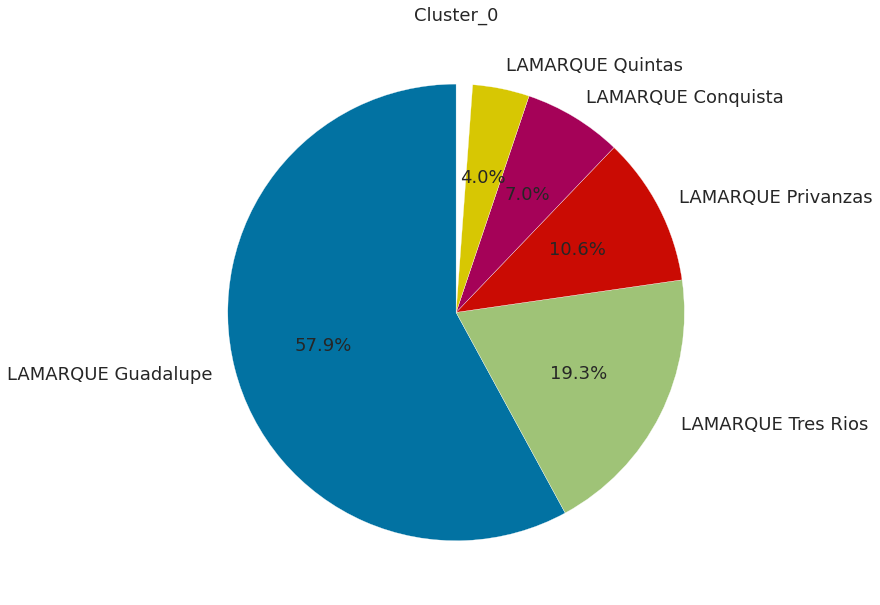

In [ ]:
#Cluster 0 grafica
fig1, ax1 = plt.subplots()
fig1.set_size_inches(18.5, 10.5)
ax1.pie(cluster0_por_sucursal[0:5], autopct = '%1.1f%%', labels = cluster0_por_sucursal[0:5].index, startangle = 90, textprops={'fontsize': 18})
plt.title('Cluster_0', fontsize = 18)
plt.show()

In [ ]:
#Cluster 1
cluster1_por_sucursal = data_completa_knn2[data_completa_knn2['Cluster_knn'] == 'Cluster_1'].sucursal.value_counts(1)
cluster1_por_sucursal

LAMARQUE Guadalupe               0.360115
LAMARQUE Conquista               0.159928
LAMARQUE Chapultepec             0.132500
LAMARQUE Tres Rios               0.126437
LAMARQUE Quintas                 0.111810
LAMARQUE Privanzas               0.074555
LAMARQUE Domicilio               0.032529
LAMARQUE Drive Thru Guadalupe    0.002126
Name: sucursal, dtype: float64

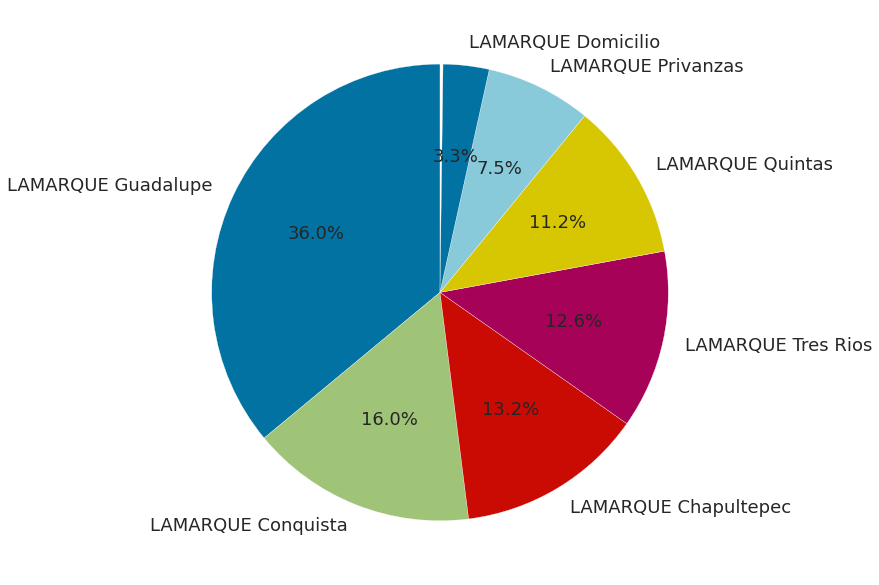

In [ ]:
#Cluster 1 gráfica
fig1, ax1 = plt.subplots()
fig1.set_size_inches(18.5, 10.5)
ax1.pie(cluster1_por_sucursal[0:7], autopct = '%1.1f%%', labels = cluster1_por_sucursal[0:7].index, startangle = 90, textprops={'fontsize': 18})
plt.show()

In [ ]:
#Sucursal Guadalupe
sucursal_guadalupe_por_cluster = data_completa_knn2[data_completa_knn2['sucursal'] == 'LAMARQUE Guadalupe'].Cluster_knn.value_counts(1).sort_values(ascending = True)
sucursal_guadalupe_por_cluster

Cluster_1    0.497134
Cluster_0    0.502866
Name: Cluster_knn, dtype: float64

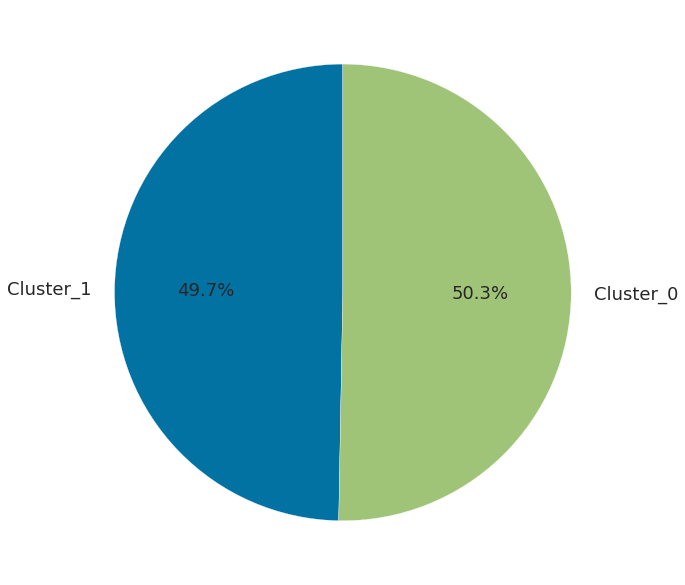

In [ ]:
#Sucursal Guadalupe gráfica
fig1, ax1 = plt.subplots()
fig1.set_size_inches(18.5, 10.5)
ax1.pie(sucursal_guadalupe_por_cluster, autopct = '%1.1f%%', labels = sucursal_guadalupe_por_cluster.index, startangle = 90, textprops={'fontsize': 18})
plt.show()

In [ ]:
#Sucursal Tres Rios
sucursal_tresrios_por_cluster = data_completa_knn2[data_completa_knn2['sucursal'] == 'LAMARQUE Tres Rios'].Cluster_knn.value_counts(1)
sucursal_tresrios_por_cluster

Cluster_1    0.509613
Cluster_0    0.490387
Name: Cluster_knn, dtype: float64

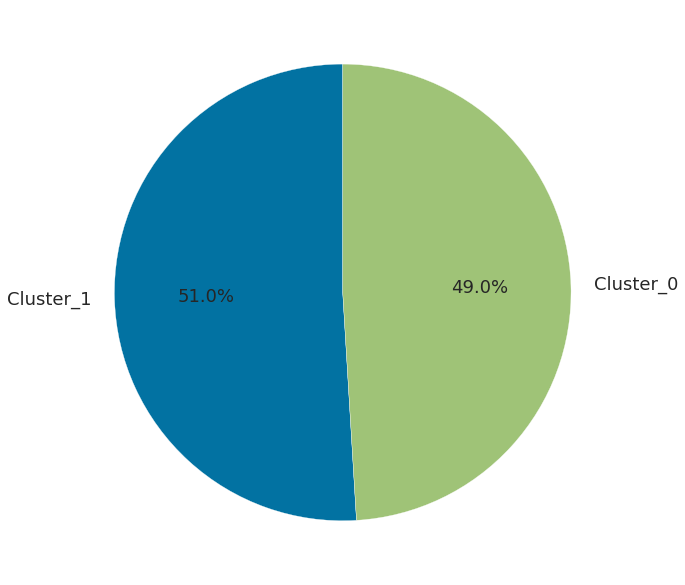

In [ ]:
#Sucursal Tres Rios gráfica
fig1, ax1 = plt.subplots()
fig1.set_size_inches(18.5, 10.5)
ax1.pie(sucursal_tresrios_por_cluster, autopct = '%1.1f%%', labels = sucursal_tresrios_por_cluster.index, startangle = 90, textprops={'fontsize': 18})
plt.show()

In [ ]:
#Sucursal Conquista
sucursal_conquista_por_cluster = data_completa_knn2[data_completa_knn2['sucursal'] == 'LAMARQUE Conquista'].Cluster_knn.value_counts(1)
sucursal_conquista_por_cluster

Cluster_1    0.784647
Cluster_0    0.215353
Name: Cluster_knn, dtype: float64

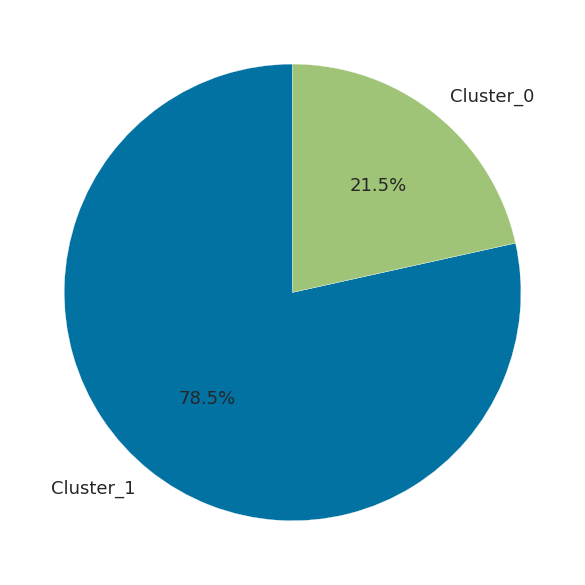

In [ ]:
#Sucursal Conquista gráfica
fig1, ax1 = plt.subplots()
fig1.set_size_inches(18.5, 10.5)
ax1.pie(sucursal_conquista_por_cluster, autopct = '%1.1f%%', labels = sucursal_conquista_por_cluster.index, startangle = 90, textprops={'fontsize': 18})
plt.show()

In [ ]:
#Sucursal Privanzas
sucursal_privanzas_por_cluster = data_completa_knn2[data_completa_knn2['sucursal'] == 'LAMARQUE Privanzas'].Cluster_knn.value_counts(1)
sucursal_privanzas_por_cluster

Cluster_1    0.528788
Cluster_0    0.471212
Name: Cluster_knn, dtype: float64

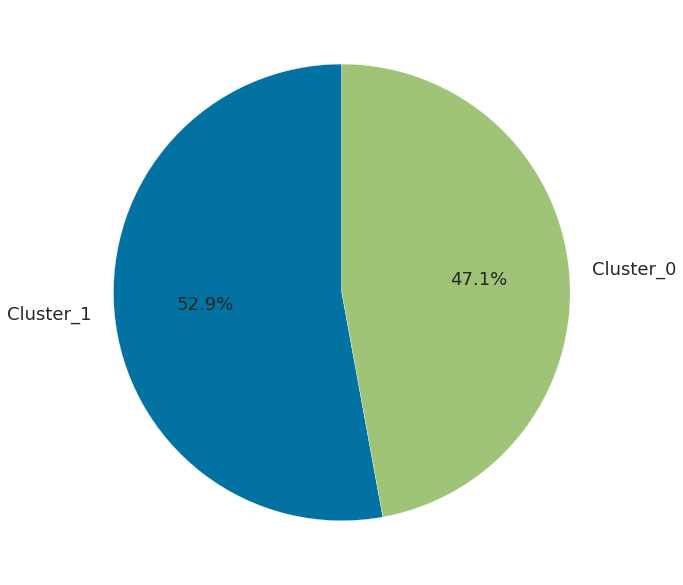

In [ ]:
#Sucursal Privanzas gráfica
fig1, ax1 = plt.subplots()
fig1.set_size_inches(18.5, 10.5)
ax1.pie(sucursal_privanzas_por_cluster, autopct = '%1.1f%%', labels = sucursal_privanzas_por_cluster.index, startangle = 90, textprops={'fontsize': 18})
plt.show()

In [ ]:
#Sucursal Quintas
sucursal_quintas_por_cluster = data_completa_knn2[data_completa_knn2['sucursal'] == 'LAMARQUE Quintas'].Cluster_knn.value_counts(1)
sucursal_quintas_por_cluster

Cluster_1    0.815809
Cluster_0    0.184191
Name: Cluster_knn, dtype: float64

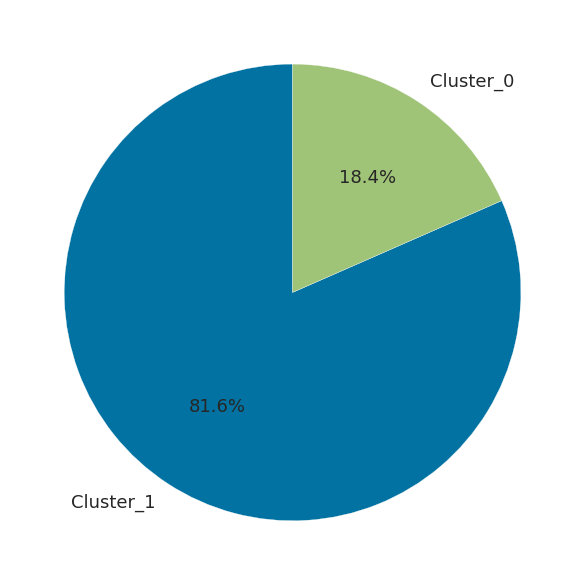

In [ ]:
#Sucursal Quintas gráfica
fig1, ax1 = plt.subplots()
fig1.set_size_inches(18.5, 10.5)
ax1.pie(sucursal_quintas_por_cluster, autopct = '%1.1f%%', labels = sucursal_quintas_por_cluster.index, startangle = 90, textprops={'fontsize': 18})
plt.show()

In [ ]:
#Sucursal Chapultepec
sucursal_chapultepec_por_cluster = data_completa_knn2[data_completa_knn2['sucursal'] == 'LAMARQUE Chapultepec'].Cluster_knn.value_counts(1)
sucursal_chapultepec_por_cluster

Cluster_1    0.96992
Cluster_0    0.03008
Name: Cluster_knn, dtype: float64

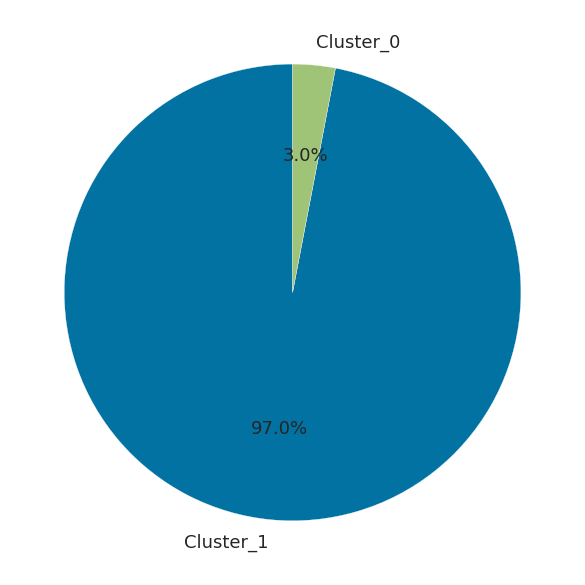

In [ ]:
#Sucursal Chapultepec gráfica
fig1, ax1 = plt.subplots()
fig1.set_size_inches(18.5, 10.5)
ax1.pie(sucursal_chapultepec_por_cluster, autopct = '%1.1f%%', labels = sucursal_chapultepec_por_cluster.index, startangle = 90, textprops={'fontsize': 18})
plt.show()

In [ ]:
#Sucursal Domicilio
sucursal_domicilio_por_cluster = data_completa_knn2[data_completa_knn2['sucursal'] == 'LAMARQUE Domicilio'].Cluster_knn.value_counts(1)
sucursal_domicilio_por_cluster

Cluster_1    0.987353
Cluster_0    0.012647
Name: Cluster_knn, dtype: float64

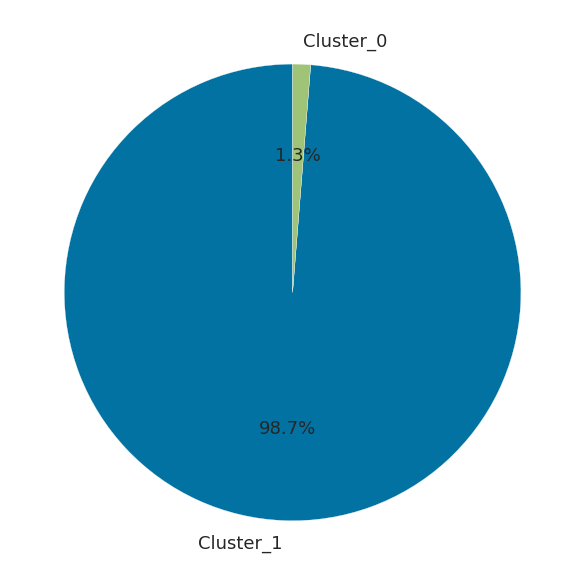

In [ ]:
#Sucursal Domicilio gráfica
fig1, ax1 = plt.subplots()
fig1.set_size_inches(18.5, 10.5)
ax1.pie(sucursal_domicilio_por_cluster, autopct = '%1.1f%%', labels = sucursal_domicilio_por_cluster.index, startangle = 90, textprops={'fontsize': 18})
plt.show()

In [ ]:
#Sucursal Drive Thru Guadalupe
sucursal_guadalupe_dt_por_cluster = data_completa_knn2[data_completa_knn2['sucursal'] == 'LAMARQUE Drive Thru Guadalupe'].Cluster_knn.value_counts(1).sort_values(ascending = True)
sucursal_guadalupe_dt_por_cluster

Cluster_1    0.435294
Cluster_0    0.564706
Name: Cluster_knn, dtype: float64

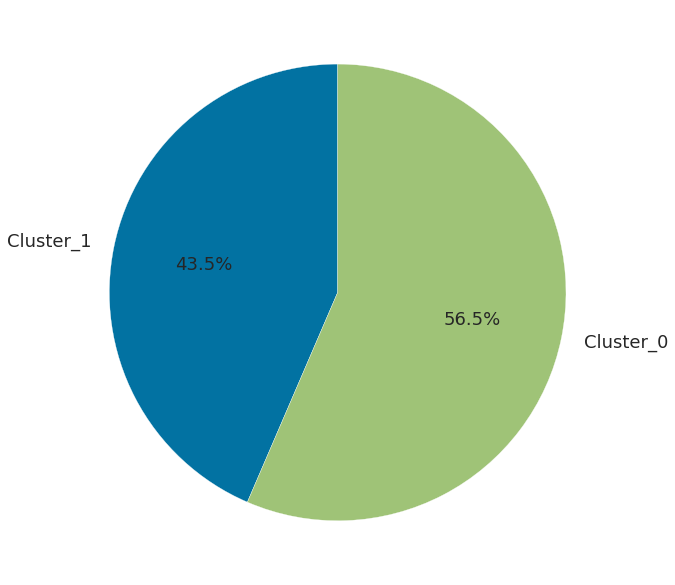

In [ ]:
#Sucursal Drive Thru Guadalupe gráfica
fig1, ax1 = plt.subplots()
fig1.set_size_inches(18.5, 10.5)
ax1.pie(sucursal_guadalupe_dt_por_cluster, autopct = '%1.1f%%', labels = sucursal_guadalupe_dt_por_cluster.index, startangle = 90, textprops={'fontsize': 18})
plt.show()

#### 12.1.2.10 Top de categorías / items comprados por cluster

##### 12.1.2.9.1 Top 3 categorías compradas por cluster

In [ ]:
#Analizamos cuales son las categorías que más se compran en cada cluster
a = data_completa_knn2.groupby(['Cluster_knn'])['categoria'].value_counts()
b = a.to_frame("counts").reset_index()
b.set_index("categoria", inplace = True)

top3_categorias_por_cluster = b.groupby('Cluster_knn').counts.nlargest(3)
top3_categorias_por_cluster = pd.DataFrame (top3_categorias_por_cluster)

#Mostramos el dataset
top3_categorias_por_cluster

counts
Cluster_knn categoria           
Cluster_0   mini_postres   21504
            bebidas        15243
            rebanada        3042
Cluster_1   pasteles       16954
            mini_postres   16540
            bebidas        12339

##### 12.1.2.9.2 Top 10 productos comprados por cluster

In [ ]:
#Analizamos cuales son los productos que más se compran en cada cluster

a = data_completa_knn2.groupby(['Cluster_knn'])['item'].value_counts()
b = a.to_frame("counts").reset_index()
b.set_index("item", inplace = True)

top10_productos_por_cluster = b.groupby('Cluster_knn').counts.nlargest(10)
top10_productos_por_cluster = pd.DataFrame (top10_productos_por_cluster)

#Mostramos el dataset
top10_productos_por_cluster

counts
Cluster_knn item                                 
Cluster_0   Mini Suspiro de Fresa            5846
            Mini Pay de Platano              3314
            Leche Deslactosada               3045
            Mini Panque de Zanahoria         2846
            Mini Triple Chocolate            2607
            Mini Pay de Piña Colada          2237
            Mini Better Than Sex             2086
            Frapuccino Caramelo              1470
            Mini Pay de Guayaba               945
            Frapuccino Chai                   898
Cluster_1   Suspiro de Fresa Chico           6289
            Mini Suspiro de Fresa            5669
            Chocolate Tradicional Mediano    3016
            2 Reb X $120                     2968
            Mini Pay de Platano              2541
            Vela Luz  de Bengala             2392
            Chocolate Tradicional Chico      2265
            Frapuccino Caramelo              1885
            Mini Triple Chocolate            1788
            Pay de Platano                   1728

### 12.1.3 Gráficas de la información clusterizada


In [ ]:
#Creamos el dataframe de los centros de los clusters
data_clusters_centers = pd.DataFrame(data_clusters.cluster_centers_, columns = ['hora', 'cantidad',
       'ventas_netas', 'bebidas', 'copitas', 'extras', 'galletas',
       'mini_postres', 'pan', 'pasteles', 'pays', 'promos', 'rebanada',
       'otros', 'sucursal_chapultepec', 'sucursal_conquista',
       'sucursal_domicilio', 'sucursal_drive_thru_guadalupe',
       'sucursal_guadalupe', 'sucursal_privanzas', 'sucursal_quintas',
       'sucursal_tres_rios', 'para_comer_aqui', 'para_entregar', 'para_llevar',
       'para_recoger', 'lunes', 'martes', 'miercoles', 'jueves', 'viernes',
       'sabado', 'domingo'])

#Mostramos el dataset
data_clusters_centers

,hora,cantidad,ventas_netas,bebidas,copitas,extras,galletas,mini_postres,pan,pasteles,pays,promos,rebanada,otros,sucursal_chapultepec,sucursal_conquista,sucursal_domicilio,sucursal_drive_thru_guadalupe,sucursal_guadalupe,sucursal_privanzas,sucursal_quintas,sucursal_tres_rios,para_comer_aqui,para_entregar,para_llevar,para_recoger,lunes,martes,miercoles,jueves,viernes,sabado,domingo
0,0.216501,1.465330,0.087062,0.917186,0.074745,-0.174452,0.062596,1.019847,0.056384,-0.500818,-0.156416,-0.104473,0.243812,0.034438,-0.202111,0.075955,-0.102820,0.086471,1.032575,0.380298,0.043881,0.526685,1.428786,-0.102288,-0.019768,0.030260,0.286490,0.458816,0.235469,0.338221,0.343027,0.37248,0.388323
1,-0.056404,-0.381755,-0.022682,-0.238950,-0.019473,0.045449,-0.016308,-0.265696,-0.014689,0.130476,0.040750,0.027218,-0.063519,-0.008972,0.052655,-0.019788,0.026787,-0.022528,-0.269012,-0.099077,-0.011432,-0.137215,-0.372235,0.026649,0.005150,-0.007883,-0.074638,-0.119533,-0.061345,-0.088115,-0.089367,-0.09704,-0.101168


In [ ]:
#Creamos la función para graficar los pares de variables que nos interese revisar.
def grafica_scatter (x, y, titulo):
  #Definimos el tamaño de la gráfica
  plt.figure(figsize = (20, 12))
  
  #Graficamos los registros del dataset
  plt.scatter(data_2021_estandarizado_knn2[x], data_2021_estandarizado_knn2[y], c = data_clusters.labels_, cmap = 'coolwarm', alpha = 0.99)
  
  #Graficamos los valores de los clusters_centers
  plt.scatter(data_clusters_centers[x], data_clusters_centers[y], marker = "*", c = 'red', s = 500, alpha = 1.0)
  
  #Definimos el título de la gráfica:
  plt.title(titulo, fontsize = 18)

  #Definimos el nombre de los ejes_
  plt.xlabel(x, fontsize = 14)
  plt.ylabel(y, fontsize = 14)

  #plt.legend(loc = 'upper right')

  #Mostramos la gráfica
  return plt.show();

#### 12.1.3.1 Hora vs Cantidad

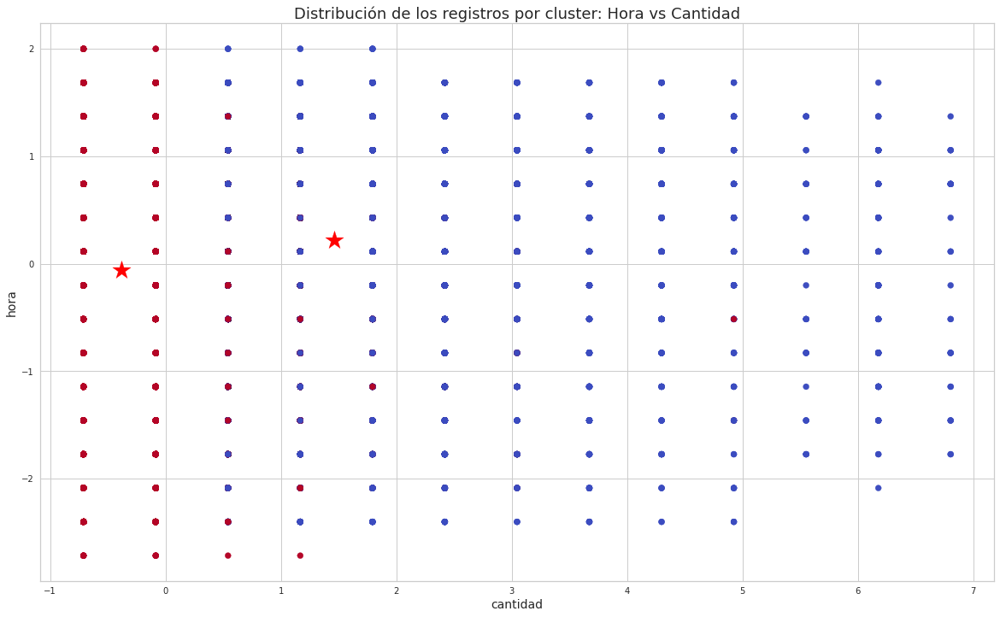

In [ ]:
grafica_scatter('cantidad', 'hora', 'Distribución de los registros por cluster: Hora vs Cantidad')

#### 12.1.3.2 Ventas netas vs Cantidad

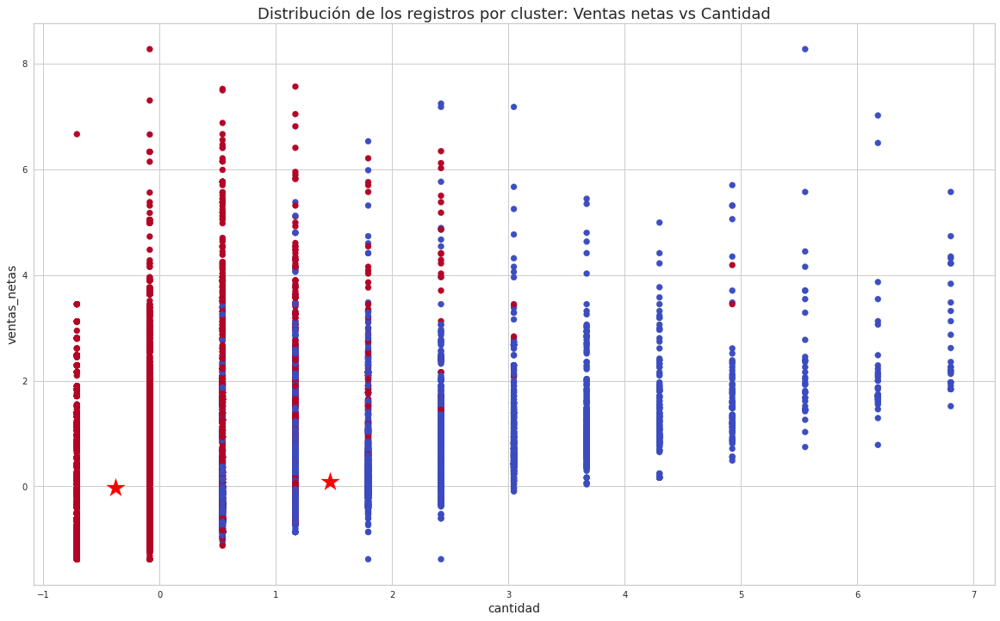

In [ ]:
grafica_scatter('cantidad', 'ventas_netas', 'Distribución de los registros por cluster: Ventas netas vs Cantidad')